In [ ]:
!pip install transformers
!pip install datasets #데이터 세트 다운로드 Hugging Face 연동

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 27.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 36.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 116.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 77.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.6/519.6 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 15.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 27.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 19.7 MB/s eta 0:00:00


In [ ]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"


In [ ]:
import copy # 특정한 파이썬 객체를 통째로 메모리에 copy할 때
import json # json 형식으로 데이터를 표현할 때
import logging # 학습 과정 등 전반적인 프로그램의 진행 상황을 로깅할 때
import os # 파일 입출력 등 현재 컴퓨터에 대한 기능 수행할 때

# 경고(warning) 메시지가 너무 많이 나오는 것을 대비하여 무시 처리
import warnings
warnings.filterwarnings("ignore")

# 로깅할 때 기본적으로 오류(error) 사항으로 로그 메시지를 남기겠다는 의미
import logging
logging.basicConfig(level=logging.ERROR)

# 벡터, 행렬 등의 처리를 위한 NumPy, 테이블(엑셀) 형식의 데이터 처리할 때 Pandas
import numpy as np
import pandas as pd

from datasets import load_dataset
# train_test_split: 별도로 구분된 validation 세트가 없을 때
# 학습 데이터 세트에서 일부를 train과 validation으로 나눌 때 자주 사용 (8:2 정도로 나눔)
from sklearn.model_selection import train_test_split
from tqdm import tqdm

import torch

### 학습한 모델 관련 라이브러리 불러오기

In [ ]:
import transformers
# Auto Model For Sequence Classification: 텍스트 분류를 위한 모델 → Cross-Entropy loss 사용
from transformers import AutoConfig, AutoModel, AutoModelForSequenceClassification, AutoTokenizer
# linear_schedule_with_warmup: 단계적으로 learning rate 줄여나가는 방법
# AdamW: SGD와 같이 optimization 방법 중 하나
from transformers import AdamW, get_linear_schedule_with_warmup

### 우리가 쓸 모델

- KoBigBird를 사용하고, 다음과 같은 형태로 사용 가능
- KoBigBird: BigBird 특유의 sparse attention 사용 (default)

In [ ]:
from transformers import AutoModel, AutoTokenizer

# by default its in `block_sparse` mode with num_random_blocks=3, block_size=64
# 이름에서부터 알 수 있듯이 KoBigBird는 BERT 기반의 모델
model = AutoModel.from_pretrained("monologg/kobigbird-bert-base")

# Tokenizer도 마찬가지로 BERT 기반에서 가져온 것을 확인
tokenizer = AutoTokenizer.from_pretrained("monologg/kobigbird-bert-base")
text = "한국어 BigBird 모델을 공개합니다!"
encoded_input = tokenizer(text, return_tensors='pt')
output = model(**encoded_input)

Attention type 'block_sparse' is not possible if sequence_length: 12 <= num global tokens: 2 * config.block_size + min. num sliding tokens: 3 * config.block_size + config.num_random_blocks * config.block_size + additional buffer: config.num_random_blocks * config.block_size = 704 with config.block_size = 64, config.num_random_blocks = 3. Changing attention type to 'original_full'...


### 실험을 위한 하이퍼 파라미터 설정

In [ ]:
# SimpleNamespace는 온점(.)으로 속성의 값을 정의할 수 있도록 해주는 라이브러리
# config.task = "cls"라고 하면, 나중에 print(config.task)했을 때 "cls"라고 출력
from types import SimpleNamespace

config = SimpleNamespace()

config.task = "cls"
config.dataset = "comment"

config.cache_dir = "cache" # 현재 데이터 세트에 대한 단어집 등 현재 task를 위한 임시적인 폴더
config.output_dir = "output" # 최종적인 모델이 저장되고, 결과가 저장되는 폴더

config.use_tpu = False
config.model_name_or_path = "monologg/kobigbird-bert-base" # Model name or path (HuggingFace에서 불러와 사용할 모델 이름)
config.data_dir = "./" # The input data dir ("10000_labeled.csv"가 있는 경로)


config.train_file = "complete_train.csv" # 미리 준비된 학습 데이터 세트 경로
config.test_file = "complete_test.csv" # 미리 준비된 평가 데이터 세트 경로

config.max_seq_length = 3072 # The maximum total input sequence length after tokenization. (최대 토큰 길이)
config.train_batch_size = 4 # Batch size for training. (학습할 때 batch_size)
config.eval_batch_size = 2 # Batch size for evaluation. (평가할 때 batch_size)

config.learning_rate = 3e-5 # The initial learning rate for Adam. (Adam optimizer에서 쓸 learning rate)
config.num_train_epochs = 20 # Total number of training epochs to perform. (전체 학습 epoch 수)

config.num_labels = 5 # 현재 task에서 선호도(1: 극진보, 2: 진보, 3: 중립, 4: 보수, 5: 극보수)의 개수는 5개이므로
# 5 classes multi-class classification 문제로 이해 할 수 있음
config.gradient_accumulation_steps = 2 # Number of updates steps to accumulate before performing a backward/update pass.
# batch_size가 큰 것처럼 처리하기 위해서, backward()를 매 번 수행하지 않고, gradient를 누적(acculmulation)하는 것

config.threads = 4
config.seed = 42 # random seed for initialization

config.do_train = True # Whether to run training.
config.do_eval_during_train = True
config.do_eval = True # Whether to run prediction.

config.do_lower_case = False
config.weight_decay = 0.0 # Weight decay if we apply some.
config.adam_epsilon = 1e-8 # Epsilon for Adam optimizer.
config.max_grad_norm = 1.0 # Max gradient norm.
config.warmup_proportion = 0.0 # Warmup proportion for linear warmup
# BigBird에서는 full attention을 하면, 메모리는 조금 더 소모되지만, 더 정확도가 향상
# config.attention_type = "original_full"

### 학습 데이터 전처리
- 학습 text를 매번 tokenization을 하지 않고, 모델 학습 시작전에 미리 모든 텍스트를 tokenization 한 결과를 저장한다.

In [ ]:
# 본 실습에서 사용할 tokenizer 객체 초기화
tokenizer = AutoTokenizer.from_pretrained(config.model_name_or_path, cache_dir=config.cache_dir)

In [ ]:
def train_split(config, texts, labels, is_train):
    if is_train:
        x_train, x_val, y_train, y_val = train_test_split(
            texts, labels, test_size=500, random_state=config.seed, stratify=None
        )
        return x_train, y_train, x_val, y_val
    else:
        return texts, labels

In [ ]:
import pandas as pd
import os
import json
from sklearn.model_selection import train_test_split

# 데이터 전처리 및 분리 함수
def process_and_split_dataset(config, data_file):
    is_train = True if 'train' in data_file else False

    df = pd.read_csv(data_file)
    df = df.dropna(subset=['title', 'content', 'label1', 'label2'])

    # 매 줄에서 "label1(정치성향)", "label2(편향여부)" 열 추출
    politics = (df["label1"] - 1).astype(int).values.tolist()
    governments = (df["label2"]).astype(int).values.tolist()
    labels = []
    for i in range(len(politics)):
        politic = politics[i]
        government = governments[i]
        labels.append([politic, government])

    # title과 content를 합쳐서 texts로 표현
    texts = (df["title"].str.replace('\n', ' ') + " " + df["content"].str.replace('\n', ' ')).astype(str).values.tolist()

    # 데이터를 학습 및 검증용으로 분할
    return train_split(config, texts, labels, is_train)





def data_pretokenizing(config, tokenizer, mode="train"):
    # 파일 경로 설정
    data_path = os.path.join(config.data_dir, config.train_file if mode == "train" else config.test_file)
    processed_data = process_and_split_dataset(config, data_path)

    datasets = {}
    if mode == "train":
        train_data_texts, train_data_labels, valid_data_texts, valid_data_labels = processed_data
        datasets["train"] = (train_data_texts, train_data_labels)
        datasets["valid"] = (valid_data_texts, valid_data_labels)
    else:  # mode == "test"
        test_data_texts, test_data_labels = processed_data
        datasets["test"] = (test_data_texts, test_data_labels)

    dataset_files = {}
    for key, (texts, labels) in datasets.items():
        label1 = [l[0] for l in labels]
        label2 = [l[1] for l in labels]

        # 데이터 파일명 설정
        dataset_file = os.path.join(config.data_dir, f"{config.dataset}_{config.model_name_or_path.replace('/', '_')}_{config.max_seq_length}_{key}_dataset.txt")
        print("dataset_file:", dataset_file)

        with open(dataset_file, "w", encoding="utf-8") as writer_file:
            for text, l1, l2 in zip(texts, label1, label2):
                print(f"Processing text: {text[:50]}...")  # 첫 50자만 출력
                print(f"Processing label1: {l1}")
                print(f"Processing label2: {l2}")

                feature = tokenizer(text, max_length=config.max_seq_length, padding="max_length", truncation=True, add_special_tokens=True)

                writed_data = {
                    "input_ids": feature["input_ids"],
                    "attention_mask": feature["attention_mask"],
                    "politic": l1,
                    "government": l2,
                }
                writer_file.write(json.dumps(writed_data) + "\n")

        dataset_files[key] = dataset_file

    return dataset_files



In [ ]:
# 학습 및 검증 데이터 토큰화
train_valid_files = data_pretokenizing(config, tokenizer=tokenizer, mode="train")
train_dataset_file = train_valid_files["train"]
valid_dataset_file = train_valid_files["valid"]

# 테스트 데이터 토큰화
test_files = data_pretokenizing(config, tokenizer=tokenizer, mode="test")
test_dataset_file = test_files["test"]


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
Processing text: 육군, 간부 '복지회관 갑질' 논란에 "전 부대 실태 점검"         임태훈 군인권센...
Processing label1: 2
Processing label2: 2
Processing text: 현대아산? 아산현대? 오염수 선동글 올린 의사... 전문가들 “정치 지망생이시군” 1일 오...
Processing label1: 2
Processing label2: 0
Processing text: 이태원 막말' 김미나, 이번엔 '민주화 유적 비하'…국민의힘, 윤리위 회부도 안해 이태원 ...
Processing label1: 0
Processing label2: 0
Processing text: 민주, 김건희 일가 양평 땅 의혹 ‘고속도로게이트’ 조사키로 윤석열 대통령 부인 김건희 여...
Processing label1: 1
Processing label2: 1
Processing text: [오늘의 주요일정] 정치·정부(3일, 목)         찜통 더위로 전국 대부분 지역에 ...
Processing label1: 2
Processing label2: 3
Processing text: "우리같이 뚱뚱하면…" 尹 '동네 패딩' 리투아니아서도 입었다 북대서양조약기구(NATO·나...
Processing label1: 2
Processing label2: 3
Processing text: 박성민 의원, 민간보조금 개혁 3법 발의…"이권 카르텔 방지"         박성민 국회의...
Processing label1: 3
Processing label2: 0
Processing text: [단독] 문재인 다큐에 1억 지원… 전주영화제 “이게 우리 색깔” 전주국제영화제 조직위원회...
Processing label1: 2
Processing label2: 0
Processing text: 中국가기관 인근서 ‘찰칵’, 체포될 수 있다... 反간첩법 행동 가이드 지난달

### 데이터로더 초기화

#### 데이터패딩

In [ ]:
class IterableDatasetPad(torch.utils.data.IterableDataset):
    def __init__(
        self,
        dataset: torch.utils.data.IterableDataset,
        batch_size: int = 1,
        num_devices: int = 1,
        seed: int = 0,
    ):
        self.dataset = dataset
        self.batch_size = batch_size
        self.seed = seed
        self.num_examples = 0

        chunk_size = self.batch_size * num_devices
        length = len(dataset)
        self.length = length + (chunk_size - length % chunk_size)

    def __len__(self):
        return self.length

    def __iter__(self):
        self.num_examples = 0
        if (
            not hasattr(self.dataset, "set_epoch")
            and hasattr(self.dataset, "generator")
            and isinstance(self.dataset.generator, torch.Generator)
        ):
            self.dataset.generator.manual_seed(self.seed + self.epoch)

        first_batch = None
        current_batch = []
        for element in self.dataset:
            self.num_examples += 1
            current_batch.append(element)
            # Wait to have a full batch before yielding elements.
            if len(current_batch) == self.batch_size:
                for batch in current_batch:
                    yield batch
                    if first_batch is None:
                        first_batch = batch.copy()
                current_batch = []

        while self.num_examples < self.length:
            add_num = self.batch_size - len(current_batch)
            self.num_examples += add_num
            current_batch += [first_batch] * add_num
            for batch in current_batch:
                yield batch
            current_batch = []

#### 전처리된 데이터를 DataLoader로 불러옴

In [ ]:
import torch.utils.data as torch_data

def collate_fn(features):
    input_ids = [sample["input_ids"] for sample in features]
    attention_mask = [sample["attention_mask"] for sample in features]

    politic = [sample["politic"] for sample in features]
    government = [sample["government"] for sample in features]

    input_ids = torch.tensor(np.array(input_ids).astype(np.int64), dtype=torch.long)
    attention_mask = torch.tensor(np.array(attention_mask).astype(np.int8), dtype=torch.long)
    politic = torch.tensor(np.array(politic).astype(np.int64), dtype=torch.long)
    government = torch.tensor(np.array(government).astype(np.int64), dtype=torch.long)
    inputs = {
        "input_ids": input_ids,
        "attention_mask": attention_mask,
    }
    labels = {
        "politic": politic,
        "government": government
    }
    return inputs, labels

# 본 코드에서 학습을 수행하려는 경우
if config.do_train:
    # 학습 데이터 로더 초기화
    train_dataset = load_dataset("text", data_files=train_dataset_file, download_mode="force_redownload")["train"]
    train_dataset = train_dataset.map(lambda x: json.loads(x["text"]), batched=False)

    train_dataloader = torch_data.DataLoader(
        train_dataset,
        sampler=torch_data.RandomSampler(train_dataset),
        drop_last=False,
        batch_size=config.train_batch_size,
        collate_fn=(collate_fn),
    )

# 검증 데이터 세트 전처리(validation)
valid_dataset = load_dataset("text", data_files=valid_dataset_file, download_mode="force_redownload")["train"]
valid_dataset = valid_dataset.map(lambda x: json.loads(x["text"]), batched=False)
valid_dataset = IterableDatasetPad(
    dataset=valid_dataset,
    batch_size=config.eval_batch_size,
    num_devices=1,
    seed=config.seed,
)

valid_dataloader = torch_data.DataLoader(
    valid_dataset,
    sampler=None,
    drop_last=False,
    batch_size=config.eval_batch_size,
    collate_fn=(collate_fn),
)

# 테스트 데이터 세트 로딩 및 전처리
test_dataset = load_dataset("text", data_files=test_dataset_file, download_mode="force_redownload")["train"]
test_dataset = test_dataset.map(lambda x: json.loads(x["text"]), batched=False)
test_dataset = IterableDatasetPad(
    dataset=test_dataset,
    batch_size=config.eval_batch_size,
    num_devices=1,
    seed=config.seed,
)

test_dataloader = torch_data.DataLoader(
    test_dataset,
    sampler=None,
    drop_last=False,
    batch_size=config.eval_batch_size,
    collate_fn=(collate_fn),
)

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Map:   0%|          | 0/4000 [00:00<?, ? examples/s]

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

### 텍스트 분류 모델 정의

In [ ]:
from transformers import AutoModel
import torch.nn as nn

# 텍스트 분류 모델 정의
class ClsModel(torch.nn.Module):
    def __init__(self):
        super().__init__()
        # (전처리된) 학습할 데이터 세트의 경로 설정
        data_file = os.path.join(config.data_dir, str(config.train_file))
        # 사전 학습된 모델 가중치 불러오기
        model_config = AutoConfig.from_pretrained(config.model_name_or_path, num_labels=config.num_labels)
        self.model = AutoModel.from_pretrained(
            config.model_name_or_path, config=model_config, cache_dir=config.cache_dir
        )
        self.classifier1 = nn.Linear(768, 5)
        self.classifier2 = nn.Linear(768, 6)

        # BERT model과 별개로, 입력 문자열을 토큰의 index로 바꾸어주는 tokenizer가 사용됨
        self.tokenizer = tokenizer

    # "학습된 모델"을 save_dir에 저장하는 함수
    def save_pretrained(self, save_dir):
        self.model.save_pretrained(save_dir)
        # Tokenizer는 기본적으로 "special_tokens_map_file", "tokenizer_file"을 가질 수 있음
        # 이러한 값을 제거한 뒤에 save_dir에 저장하겠다는 의미
        for key in ["special_tokens_map_file", "tokenizer_file"]:
            self.tokenizer.init_kwargs.pop(key, None)
        self.tokenizer.save_pretrained(save_dir)

    def get_optimizer(self): # 현재 모델을 학습하기 위한 최적화 방법(AdamW) 객체를 불러오는 함수
        # bias랑 LayerNorm에는 decay 적용하지 않겠다는 의미
        no_decay = ["bias", "LayerNorm.weight"]
        optimizer_grouped_parameters = [
            {
                "params": [p for n, p in self.model.named_parameters() if not any(nd in n for nd in no_decay)],
                "weight_decay": config.weight_decay,
            },
            {
                "params": [p for n, p in self.model.named_parameters() if any(nd in n for nd in no_decay)],
                "weight_decay": config.weight_decay,
            },
        ]
        # AdamW의 첫 번째 인자(params)는 "학습할 가중치", weight_decay는 가중치에 적용되는 regularization 기법
        optimizer = AdamW(optimizer_grouped_parameters, lr=config.learning_rate, eps=config.adam_epsilon)
        return optimizer

    def get_scheduler(self, batch_num, optimizer): # AdamW로 학습할 때, learning rate을 단계적으로 줄이기 위한 함수
        if config.warmup_proportion == 0.0:
            return None

        t_total = batch_num // config.gradient_accumulation_steps * config.num_train_epochs

        scheduler = get_linear_schedule_with_warmup(
            optimizer,
            num_warmup_steps=int(t_total * config.warmup_proportion),
            num_training_steps=t_total,
        )

        return scheduler

    def forward(self, inputs):
        # print(inputs) => {"input_ids", "attention_mask"}
        # https://huggingface.co/docs/transformers/model_doc/big_bird
        # BigBirdModel의 입력 양식에 맞게 넣어주어야 오류가 없음
        # BigBirdModel로 "input_ids", "attention_mask" 등 "미리 정해진" 규격에 맞는 입력만
        # 들어가야 오류가 없다는 의미 => 그러므로, preference, slang 등은 들어가면 X
        hidden = self.model(**inputs)
        # print(hidden.last_hidden_state.shape) # torch.Size([4 (batch_size), 1024 (seq_len), 768 (embedding_size)])
        # 마지막 레이어의 [CLS] 토큰만 가져오기
        cls_token_embeddings = hidden.last_hidden_state[:,0,:] # [batch_size, 768]
        # print(cls_token_embeddings.shape)
        output_1 = self.classifier1(cls_token_embeddings) # 768 → 5
        output_2 = self.classifier2(cls_token_embeddings) # 768 → 6
        print(output_1.shape) # [batch_size, 5]
        print(output_2.shape) # [batch_size, 6]

        return output_1, output_2

    def eval_step(self, inputs, labels, outputs):
        logits_1 = outputs[0].detach().cpu()
        logits_2 = outputs[1].detach().cpu()
        labels_1 = self.tensor_to_list(labels["politic"])
        labels_2 = self.tensor_to_list(labels["government"])
        predictions_1 = self.tensor_to_list(torch.argmax(logits_1, dim=-1))
        predictions_2 = self.tensor_to_list(torch.argmax(logits_2, dim=-1))
        results_1 = [{"prediction": prediction, "label": label} for prediction, label in zip(predictions_1, labels_1)]
        results_2 = [{"prediction": prediction, "label": label} for prediction, label in zip(predictions_2, labels_2)]
        return {"results_1": results_1, "results_2": results_2}





    # PyTorch의 Tensor 객체를 NumPy 객체로 변환
    def tensor_to_array(self, tensor):
        return tensor.detach().cpu().numpy()

    # PyTorch의 Tensor 객체를 Python의 리스트(list) 자료형으로 변환
    def tensor_to_list(self, tensor):
        return self.tensor_to_array(tensor).tolist()

In [ ]:
def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True

def cal_running_avg_loss(loss, running_avg_loss, decay=0.99):
    if running_avg_loss == 0:
        return loss
    running_avg_loss = running_avg_loss * decay + (1 - decay) * loss
    return running_avg_loss

### 모델 학습 및 평가 라이브러리


In [ ]:
from functools import partial
import sklearn.metrics as sklearn_metrics

"""binary_metrics = {
    "accuracy": sklearn_metrics.accuracy_score,
    "precision": sklearn_metrics.precision_score, # TP / (TP + FP)
    "recall": sklearn_metrics.recall_score, # recall = sensitivity (민감도)
    "f1": sklearn_metrics.f1_score,
    "matthews_corrcoef": sklearn_metrics.matthews_corrcoef,
    "roc_auc": sklearn_metrics.roc_auc_score,
}""" # 우리는 두가지 task 다 다중분류임으로 안씀

metrics = {
    "accuracy": sklearn_metrics.accuracy_score,
    "f1-macro": partial(sklearn_metrics.f1_score, average="macro"),
}


def eval_cls(results_1, results_2, **kwargs):
    predictions_1 = np.array([result["prediction"] for result in results_1])
    labels_1 = np.array([result["label"] for result in results_1])
    predictions_2 = np.array([result["prediction"] for result in results_2])
    labels_2 = np.array([result["label"] for result in results_2])
    results_1 = {
        metric: round(f(labels_1, predictions_1) * 100, 2)
        for metric, f in metrics.items()
    }
    results_2 = {
        metric: round(f(labels_2, predictions_2) * 100, 2)
        for metric, f in metrics.items()
    }

    return {
        "results_1": results_1,
        "results_2": results_2,
        "best_score_1": results_1["accuracy"],
        "best_score_2": results_2["accuracy"],

    }


### Epoch 동안 학습 및 평가를 수행하는 함수 정의

In [ ]:
def _run_epoch(model, loader, device=None, context=None, **kwargs):
    config = kwargs["config"]
    is_train = kwargs["is_train"]

    avg_loss = 0
    results = []
    batch_num = len(loader)

    if is_train:
        model.train()
        if config.use_tpu:
            optimizer = context.getattr_or("optimizer", lambda: model.get_optimizer())
            scheduler = context.getattr_or("scheduler", lambda: model.get_scheduler(batch_num, optimizer))
        else:
            optimizer = kwargs["optimizer"]
            scheduler = kwargs["scheduler"]
    else:
        model.eval()

    is_master = True

    pbar = tqdm(enumerate(loader), total=batch_num, disable=not is_master, dynamic_ncols=True, position=0, leave=True)

    corrected_1 = 0
    corrected_2 = 0
    total = 0

    for i, (inputs, labels) in pbar:
        if not config.use_tpu:
            for k, v in inputs.items():
                if isinstance(v, torch.Tensor):
                    inputs[k] = v.to(device)
            for k, v in labels.items():
                if isinstance(v, torch.Tensor):
                    labels[k] = v.to(device)

        outputs = model(inputs)


        outputs_1 = outputs[0]
        outputs_2 = outputs[1]

        labels_1 = labels["politic"]
        labels_2 = labels["government"]

        loss_function_1 = nn.CrossEntropyLoss()
        loss_1 = loss_function_1(outputs_1, labels_1)

        total += outputs_1.shape[0]

        _, predicted_1 = outputs_1.max(1)
        corrected_1 += predicted_1.eq(labels_1).sum().item()

        loss_function_2 = nn.CrossEntropyLoss()
        loss_2 = loss_function_2(outputs_2, labels_2)

        _, predicted_2 = outputs_2.max(1)
        corrected_2 += predicted_2.eq(labels_2).sum().item()

        w_1 = 1
        w_2 = 1
        loss = w_1 * loss_1 + w_2 * loss_2

        avg_loss = cal_running_avg_loss(loss.item(), avg_loss)
        loss /= config.gradient_accumulation_steps

        if is_train:
            loss.backward()
            if i % config.gradient_accumulation_steps == 0 or i == batch_num - 1:
                if config.max_grad_norm > 0:
                    torch.nn.utils.clip_grad_norm_(model.parameters(), config.max_grad_norm)

                optimizer.step()
                optimizer.zero_grad()

                if scheduler is not None:
                    scheduler.step()
        else:
            result = (model.module if hasattr(model, "module") else model).eval_step(inputs, labels, outputs)
            results.append(result)

        if not is_train:
            result = (model.module if hasattr(model, "module") else model).eval_step(inputs, labels, outputs)
            result["loss_1"] = loss_1.item()
            result["loss_2"] = loss_2.item()
            results.append(result)


    return {
        "loss": avg_loss,
        "result": results,
    }


# 학습 코드에서 호출하는 함수
def run_epoch(**kwargs):
    model = kwargs.pop("model")
    if kwargs["config"].use_tpu:
        results = model(_run_epoch, **kwargs)
    else:
        results = _run_epoch(model, **kwargs)

    if isinstance(results, list):
        loss = sum([result["loss"] for result in results]) / len(results)
        result = []
        for res in results:
            result.extend(res["result"])
        results = {"loss": loss, "result": result}

    return results

### 딥러닝 모델 초기화 및 설정

In [ ]:
# 현재 모델 이름이 "monologg/kobigbird-bert-base" 이므로, Hugging Face에서 찾아서 불러옴
set_seed(config.seed)

# 딥러닝 모델 초기화
model = ClsModel()

print(f"configuration: {str(config)}")

if torch.cuda.is_available(): # GPU를 사용할 수 있다면
    gpu_count = torch.cuda.device_count()
    print(f"{gpu_count} GPU device detected")
    devices = ["cuda:{}".format(i) for i in range(gpu_count)]
    model_dp = torch.nn.DataParallel(model, device_ids=devices)
    model.to(devices[0])
else: # GPU를 사용할 수 없다면 CPU로 구동
    devices = ["cpu"]
    model_dp = model

# 학습 결과를 저장하기 위한 폴더 만들기
if not os.path.exists(config.cache_dir):
    os.makedirs(config.cache_dir)

output_dir = os.path.join(config.output_dir, config.task, config.dataset)
print("Output directory:", output_dir)
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# 실제 학습을 위해 optimizer 및 scheduler 초기화
optimizer = None
scheduler = None
if config.do_train: # 학습 모드(train mode)인 경우
    optimizer = model.get_optimizer()
    scheduler = model.get_scheduler(len(train_dataloader), optimizer)

params = {
    "config": config,
    "model": model_dp,
    "optimizer": optimizer,
    "scheduler": scheduler,
}
if not config.use_tpu:
    params["device"] = devices[0]

configuration: namespace(task='cls', dataset='comment', cache_dir='cache', output_dir='output', use_tpu=False, model_name_or_path='monologg/kobigbird-bert-base', data_dir='./', train_file='complete_train.csv', test_file='complete_test.csv', max_seq_length=3072, train_batch_size=4, eval_batch_size=2, learning_rate=3e-05, num_train_epochs=20, num_labels=5, gradient_accumulation_steps=2, threads=4, seed=42, do_train=True, do_eval_during_train=True, do_eval=True, do_lower_case=False, weight_decay=0.0, adam_epsilon=1e-08, max_grad_norm=1.0, warmup_proportion=0.0)
1 GPU device detected
Output directory: output/cls/comment


In [ ]:
def do_eval(epoch):
    with torch.no_grad():
        results = run_epoch(loader=valid_dataloader, epoch=epoch, is_train=False, **params)["result"]

        # 검증 손실의 평균을 계산합니다.
        total_loss_1 = sum([result["loss_1"] for result in results if "loss_1" in result])
        total_loss_2 = sum([result["loss_2"] for result in results if "loss_2" in result])
        avg_loss = (total_loss_1 + total_loss_2) / len(results)

        results_1 = [result['results_1'] for result in results]
        results_2 = [result['results_2'] for result in results]

        results_1 = [item for sublist in results_1 for item in sublist]
        results_2 = [item for sublist in results_2 for item in sublist]

        eval_results = eval_cls(
            config=config,
            model=model,
            loader=valid_dataloader,
            tokenizer=model.tokenizer,
            results_1=results_1,
            results_2=results_2,
        )
    print(f"\n[EPOCH {epoch+1}] Evaluation Results:")
    print("Eval results for output 1.")
    for k, v in eval_results["results_1"].items():
        print(f"{k} : {v}")

    print("Eval results for output 2.")
    for k, v in eval_results["results_2"].items():
        print(f"{k} : {v}")

    return avg_loss, eval_results["best_score_1"], eval_results["best_score_2"], eval_results


best_model_path = "best_model.pth"  # 최고 정확도 모델 저장 경로

# 초기에 이러한 리스트들을 정의합니다.
train_losses = []
valid_losses = []
valid_accuracies_1 = []
valid_accuracies_2 = []
valid_f1_scores_1 = []
valid_f1_scores_2 = []

best_model_path = "best_model.pth"

if config.do_train:
    best_score = (0, 0)
    for epoch in range(config.num_train_epochs):
        train_results = run_epoch(loader=train_dataloader, epoch=epoch, is_train=True, **params)
        train_losses.append(train_results['loss'])

        if config.do_eval_during_train:
            avg_loss, score1, score2, eval_results = do_eval(epoch)
            valid_losses.append(avg_loss)
            f1_score_1 = eval_results["results_1"].get("f1-macro", 0)
            f1_score_2 = eval_results["results_2"].get("f1-macro", 0)
            valid_f1_scores_1.append(f1_score_1)
            valid_f1_scores_2.append(f1_score_2)
            valid_accuracies_1.append(score1)  # Using best_score_1 as accuracy for label 1
            valid_accuracies_2.append(score2)

            if score1 >= best_score[0] and score2 >= best_score[1]:
                best_score = (score1, score2)
                torch.save(
                    model_dp.module.state_dict()
                    if hasattr(model_dp, "module")
                    else model_dp._models[0].state_dict()
                    if hasattr(model_dp, "_models")
                    else model_dp.state_dict(),
                    best_model_path
                )
                print(f"Best model saved to {best_model_path}.")



  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:04<1:21:47,  4.91s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:06<46:42,  2.81s/it]  

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:07<35:41,  2.15s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:08<30:13,  1.82s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:10<27:22,  1.65s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:11<25:30,  1.54s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:12<24:27,  1.48s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:14<23:36,  1.43s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:15<23:14,  1.41s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:16<22:44,  1.38s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:18<22:34,  1.37s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:19<22:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:20<22:23,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:22<22:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:23<22:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:24<21:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:26<22:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:27<21:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:29<21:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:30<21:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:31<21:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:33<21:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:34<21:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:35<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:37<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:38<21:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:39<21:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:41<21:35,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:42<21:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:43<21:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:45<21:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:46<21:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:47<21:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:49<21:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:50<21:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:51<21:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:53<21:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:54<21:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:55<21:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:57<21:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:58<21:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:59<21:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [01:01<21:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [01:02<21:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:03<21:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:05<21:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:06<21:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:07<21:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:09<21:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:10<21:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:11<21:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:13<21:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:14<21:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:15<21:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:17<21:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:18<20:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:19<21:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:21<20:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:22<21:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:23<21:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:25<21:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:26<20:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:28<21:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:29<20:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:30<20:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:31<20:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:33<20:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:34<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:36<20:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:37<20:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:38<20:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:40<20:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:41<20:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:42<20:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:44<20:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:45<20:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:46<20:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:48<20:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:49<20:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:50<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:52<20:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:53<20:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:54<20:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:56<20:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:57<20:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:58<20:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [02:00<20:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [02:01<20:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [02:02<20:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:04<20:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:05<20:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:06<20:11,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:08<20:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:09<20:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:10<20:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:12<20:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:13<20:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:14<20:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:16<20:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:17<20:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:18<20:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:20<19:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:21<20:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:22<19:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:24<19:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:25<19:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:26<20:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:28<19:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:29<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:30<19:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:32<19:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:33<19:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:34<19:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:36<19:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:37<19:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:38<19:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:40<19:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:41<19:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:42<19:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:44<19:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:45<19:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:46<19:31,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:48<19:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:49<19:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:51<19:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:52<19:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:53<19:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:55<19:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:56<19:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:57<19:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:59<19:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [03:00<19:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [03:01<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [03:03<19:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:04<19:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:05<19:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:07<19:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:08<19:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:09<19:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:11<19:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:12<19:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:13<19:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:15<19:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:16<19:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:17<19:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:19<18:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:20<19:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:21<18:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:23<19:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:24<18:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:25<18:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:27<18:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:28<18:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:29<18:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:31<18:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:32<18:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:33<18:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:35<18:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:36<18:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:37<18:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:39<18:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:40<18:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:41<18:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:43<18:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:44<18:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:45<18:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:47<18:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:48<18:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:49<18:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:51<18:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:52<18:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:53<18:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:55<18:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:56<18:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:57<18:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:59<18:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [04:00<18:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [04:01<18:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:03<18:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:04<18:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:05<18:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:07<18:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:08<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:09<18:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:11<18:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:12<18:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:13<18:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:15<18:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:16<18:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:17<17:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:19<18:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:20<17:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:22<18:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:23<17:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:24<18:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:26<17:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:27<17:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:28<17:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:30<17:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:31<17:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:32<17:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:34<17:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:35<17:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:36<17:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:38<17:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:39<17:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:40<17:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:42<17:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:43<17:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:44<17:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:46<17:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:47<17:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:48<17:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:50<17:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:51<17:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:52<17:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:54<17:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:55<17:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:56<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:58<17:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:59<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [05:00<17:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [05:02<17:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:03<17:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:04<17:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:06<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:07<17:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:08<17:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:10<17:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:11<17:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:12<17:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:14<17:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:15<17:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:16<17:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:18<17:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:19<16:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:20<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:22<16:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:23<16:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:24<16:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:26<16:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:27<16:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:28<16:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:30<16:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:31<16:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:32<16:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:34<16:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:35<16:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:36<16:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:38<16:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:39<16:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:40<16:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:42<16:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:43<16:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:44<16:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:46<16:31,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:47<16:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:48<16:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:50<16:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:51<16:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:52<16:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:54<16:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:55<16:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:56<16:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:58<16:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:59<16:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [06:00<16:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [06:02<16:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:03<16:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:04<16:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:06<16:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:07<16:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:09<16:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:10<16:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:11<16:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:13<16:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:14<16:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:15<16:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:17<16:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:18<16:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:19<16:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:21<15:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:22<16:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:23<15:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:25<15:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:26<15:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:27<16:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:29<15:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:30<15:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:31<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:33<15:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:34<15:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:35<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:37<15:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:38<15:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:39<15:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:41<15:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:42<15:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:43<15:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:45<15:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:46<15:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:47<15:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:49<15:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:50<15:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:51<15:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:53<15:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:54<15:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:55<15:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:57<15:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:58<15:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:59<15:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [07:01<15:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:02<15:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:03<15:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:05<15:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:06<15:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:07<15:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:09<15:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:10<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:11<15:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:13<15:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:14<15:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:15<15:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:17<15:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:18<15:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:19<15:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:21<15:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:22<14:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:24<14:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:25<14:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:26<14:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:28<14:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:29<14:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:30<14:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:32<14:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:33<14:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:34<14:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:36<14:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:37<14:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:38<14:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:40<14:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:41<14:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:42<14:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:44<14:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:45<14:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:46<14:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:48<14:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:49<14:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:50<14:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:52<14:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:53<14:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:54<14:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:56<14:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:57<14:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:58<14:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [08:00<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [08:01<14:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:02<14:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:04<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:05<14:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:06<14:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:08<14:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:09<14:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:10<14:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:12<14:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:13<14:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:14<14:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:16<14:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:17<14:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:18<14:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:20<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:21<13:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:22<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:24<13:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:25<13:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:26<13:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:28<13:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:29<13:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:30<13:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:32<13:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:33<13:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:34<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:36<13:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:37<13:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:38<13:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:40<13:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:41<13:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:42<13:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:44<13:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:45<13:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:46<13:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:48<13:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:49<13:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:50<13:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:52<13:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:53<13:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:54<13:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:56<13:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:57<13:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:58<13:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [09:00<13:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [09:01<13:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:03<13:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:04<13:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:05<13:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:07<13:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:08<13:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:09<13:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:11<13:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:12<13:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:13<13:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:15<13:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:16<13:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:17<13:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:19<13:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:20<12:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:21<13:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:23<12:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:24<12:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:25<12:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:27<12:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:28<12:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:29<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:31<12:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:32<12:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:33<12:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:35<12:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:36<12:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:37<12:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:39<12:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:40<12:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:41<12:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:43<12:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:44<12:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:45<12:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:47<12:31,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:48<12:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:49<12:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:51<12:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:52<12:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:53<12:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:55<12:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:56<12:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:57<12:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:59<12:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [10:00<12:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:01<12:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:03<12:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:04<12:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:05<12:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:07<12:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:08<12:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:09<12:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:11<12:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:12<12:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:13<12:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:15<12:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:16<12:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:17<12:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:19<12:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:20<12:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:21<11:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:23<12:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:24<11:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:26<11:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:27<11:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:28<11:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:30<11:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:31<11:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:32<11:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:34<11:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:35<11:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:36<11:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:38<11:39,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:39<11:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:40<11:39,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:42<11:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:43<11:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:44<11:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:46<11:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:47<11:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:48<11:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:50<11:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:51<11:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:52<11:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:54<11:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:55<11:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:56<11:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:58<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:59<11:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [11:00<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:02<11:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:03<11:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:04<11:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:06<11:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:07<11:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:08<11:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:10<11:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:11<11:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:12<11:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:14<11:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:15<11:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:16<11:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:18<11:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:19<11:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:20<10:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:22<11:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:23<10:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:24<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:26<10:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:27<10:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:28<10:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:30<10:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:31<10:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:32<10:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:34<10:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:35<10:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:36<10:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:38<10:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:39<10:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:40<10:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:42<10:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:43<10:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:44<10:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:46<10:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:47<10:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:48<10:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:50<10:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:51<10:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:52<10:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:54<10:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:55<10:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:56<10:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:58<10:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:59<10:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [12:00<10:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:02<10:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:03<10:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:04<10:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:06<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:07<10:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:08<10:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:10<10:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:11<10:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:13<10:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:14<10:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:15<10:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:17<10:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:18<10:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:19<09:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:21<10:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:22<09:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:23<09:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:25<09:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:26<09:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:27<09:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:29<09:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:30<09:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:31<09:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:33<09:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:34<09:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:35<09:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:37<09:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:38<09:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:39<09:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:41<09:39,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:42<09:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:43<09:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:45<09:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:46<09:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:47<09:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:49<09:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:50<09:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:51<09:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:53<09:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:54<09:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:55<09:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:57<09:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:58<09:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:59<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:01<09:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:02<09:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:03<09:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:05<09:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:06<09:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:07<09:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:09<09:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:10<09:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:12<09:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:13<09:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:14<09:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:15<09:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:17<09:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:18<09:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:20<09:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:21<08:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:22<08:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:24<08:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:25<08:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:26<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:28<08:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:29<08:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:30<08:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:32<08:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:33<08:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:34<08:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:36<08:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:37<08:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:38<08:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:40<08:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:41<08:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:42<08:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:44<08:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:45<08:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:46<08:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:48<08:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:49<08:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:50<08:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:52<08:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:53<08:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:54<08:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:56<08:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:57<08:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:58<08:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [14:00<08:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:01<08:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:02<08:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:04<08:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:05<08:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:06<08:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:08<08:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:09<08:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:10<08:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:12<08:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:13<08:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:14<08:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:16<08:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:17<08:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:18<08:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:20<08:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:21<08:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:22<07:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:24<07:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:25<07:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:26<07:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:28<07:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:29<07:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:31<07:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:32<07:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:33<07:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:35<07:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:36<07:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:37<07:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:39<07:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:40<07:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:41<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:43<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:44<07:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:45<07:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:47<07:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:48<07:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:49<07:31,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:51<07:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:52<07:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:53<07:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:55<07:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:56<07:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:57<07:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:59<07:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [15:00<07:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:01<07:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:03<07:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:04<07:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:05<07:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:07<07:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:08<07:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:09<07:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:11<07:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:12<07:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:13<07:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:15<07:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:16<07:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:17<07:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:19<07:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:20<07:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:21<07:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:23<07:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:24<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:26<06:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:27<06:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:28<06:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:30<06:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:31<06:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:32<06:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:34<06:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:35<06:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:36<06:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:38<06:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:39<06:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:40<06:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:42<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:43<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:44<06:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:46<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:47<06:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:48<06:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:50<06:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:51<06:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:52<06:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:54<06:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:55<06:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:56<06:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:58<06:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:59<06:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [16:00<06:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:02<06:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:03<06:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:04<06:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:06<06:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:07<06:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:08<06:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:10<06:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:11<06:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:12<06:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:14<06:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:15<06:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:16<06:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:18<06:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:19<06:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:20<05:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:22<06:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:23<05:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:24<05:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:26<05:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:27<05:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:28<05:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:30<05:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:31<05:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:32<05:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:34<05:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:35<05:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:36<05:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:38<05:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:39<05:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:41<05:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:42<05:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:43<05:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:45<05:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:46<05:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:47<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:49<05:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:50<05:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:51<05:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:53<05:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:54<05:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:55<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:57<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:58<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:59<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:01<05:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:02<05:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:03<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:05<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:06<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:07<05:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:09<05:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:10<05:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:11<05:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:13<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:14<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:15<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:17<05:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:18<05:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:19<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:21<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:22<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:23<05:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:25<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:26<04:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:27<04:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:29<04:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:30<04:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:31<04:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:33<04:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:34<04:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:35<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:37<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:38<04:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:40<04:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:41<04:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:42<04:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:44<04:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:45<04:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:46<04:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:48<04:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:49<04:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:50<04:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:52<04:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:53<04:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:54<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:56<04:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:57<04:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:58<04:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [18:00<04:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:01<04:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:02<04:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:04<04:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:05<04:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:06<04:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:08<04:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:09<04:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:10<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:12<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:13<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:14<04:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:16<04:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:17<04:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:19<04:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:20<04:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:21<04:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:23<04:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:24<03:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:25<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:27<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:28<03:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:29<03:56,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:31<03:54,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:32<03:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:33<03:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:35<03:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:36<03:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:37<03:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:39<03:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:40<03:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:41<03:43,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:43<03:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:44<03:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:45<03:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:47<03:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:48<03:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:50<03:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:51<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:52<03:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:54<03:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:55<03:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:56<03:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:58<03:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:59<03:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [19:00<03:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:02<03:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:03<03:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:04<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:06<03:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:07<03:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:08<03:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:10<03:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:11<03:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:12<03:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:14<03:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:15<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:16<03:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:18<03:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:19<03:06,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:21<03:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:22<03:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:23<03:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:25<02:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:26<02:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:27<02:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:29<02:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:30<02:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:31<02:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:33<02:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:34<02:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:35<02:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:37<02:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:38<02:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:39<02:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:41<02:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:42<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:43<02:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:45<02:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:46<02:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:47<02:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:49<02:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:50<02:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:51<02:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:53<02:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:54<02:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:56<02:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:57<02:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:58<02:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [20:00<02:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [20:01<02:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:02<02:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:04<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:05<02:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:06<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:08<02:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:09<02:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:10<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:12<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:13<02:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:14<02:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:16<02:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:17<02:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:18<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:20<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:21<02:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:22<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:24<01:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:25<01:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:26<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:28<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:29<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:30<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:32<01:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:33<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:35<01:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:36<01:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:37<01:47,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:39<01:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:40<01:44,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:41<01:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:43<01:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:44<01:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:45<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:47<01:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:48<01:36,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:49<01:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:51<01:33,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:52<01:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:53<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:55<01:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:56<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:57<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:59<01:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [21:00<01:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:02<01:22,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:03<01:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:04<01:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:06<01:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:07<01:17,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:08<01:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:10<01:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:11<01:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:12<01:11,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:14<01:10,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:15<01:09,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:16<01:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:18<01:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:19<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:20<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:22<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:23<01:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:24<00:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:26<00:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:27<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:29<00:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:30<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:31<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:33<00:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:34<00:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:35<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:37<00:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:38<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:39<00:44,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:41<00:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:42<00:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:43<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:45<00:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:46<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:47<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:49<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:50<00:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:51<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:53<00:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:54<00:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:55<00:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:57<00:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:58<00:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:59<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [22:01<00:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:02<00:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:04<00:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:05<00:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:06<00:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:08<00:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:09<00:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:10<00:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:12<00:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:13<00:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:14<00:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:16<00:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:17<00:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:18<00:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:20<00:04,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:21<00:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:22<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:58,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:57,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:57,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:56,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:56,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:56,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:55,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:55,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:03<00:55,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:54,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:54,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:54,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:54,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:54,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:54,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:53,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:53,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:53,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:52,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:06<00:52,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:52,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:51,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:51,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:50,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:50,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:50,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:50,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:49,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:09<00:49,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:49,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:48,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:47,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:46,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:45,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:12<00:45,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:44,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:44,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:44,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:43,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:43,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:15<00:43,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:41,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:41,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:41,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:40,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:39,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:18<00:39,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:40,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:19<00:40,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:39,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:38,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:38,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:21<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:22<00:36,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:35,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:35,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:34,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:34,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:24<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:33,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:25<00:33,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:33,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:32,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:26<00:32,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:31,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:27<00:30,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:28<00:29,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:28,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:29<00:28,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:27,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:30<00:27,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:27,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:31<00:27,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:27,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:27,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:26,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:32<00:26,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:33<00:24,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:34<00:23,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:23,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:35<00:22,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:36<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:37<00:21,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:20,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:39<00:18,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:40<00:17,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:17,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:16,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:42<00:15,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:43<00:14,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:14,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:14,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:45<00:12,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:46<00:12,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:10,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:48<00:09,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:49<00:08,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:51<00:06,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:52<00:05,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:54<00:03,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:54<00:03,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:57<00:00,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:57<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 1] Evaluation Results:
Eval results for output 1.
accuracy : 59.56
f1-macro : 37.59
Eval results for output 2.
accuracy : 53.78
f1-macro : 37.96


Best model saved to best_model.pth.


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<22:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<21:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<22:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<22:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<22:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:38<21:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:42<21:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:47<21:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:13<21:24,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:17<21:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<20:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:21<21:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<21:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:26<20:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<21:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:30<21:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:34<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:56<20:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:00<20:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:05<20:30,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:08<20:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:13<20:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:17<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<19:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:21<20:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:25<19:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<19:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:39<19:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:43<19:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:47<19:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:51<19:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:55<19:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [02:59<19:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:04<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:08<19:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:12<19:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:16<19:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<19:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<19:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:22<19:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:24<18:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<19:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:26<18:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<18:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:30<18:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:34<18:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:38<18:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:42<18:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:46<18:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:50<18:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:55<18:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:59<18:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:03<18:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:07<18:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:08<18:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:11<18:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:12<18:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:13<18:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:15<18:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:17<18:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:19<18:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<18:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:21<18:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:23<17:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<18:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:25<17:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:27<17:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:29<17:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:31<17:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:33<17:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:38<17:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:40<17:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:42<17:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:43<17:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:44<17:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:46<17:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:47<17:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:48<17:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:50<17:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:51<17:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:52<17:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:54<17:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:55<17:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:56<17:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:58<17:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:59<17:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:00<17:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:02<17:32,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:03<17:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:04<17:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:06<17:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:08<17:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:10<17:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:13<17:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:14<17:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:15<17:17,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:17<17:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:18<17:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:19<17:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:21<17:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:22<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:23<16:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:25<16:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:26<16:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:27<16:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:29<16:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:30<16:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:31<16:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:33<16:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:34<16:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:35<16:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:37<16:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:38<16:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:39<16:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:41<16:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:42<16:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:43<16:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:45<16:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:47<16:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:49<16:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:51<16:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:53<16:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:55<16:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:57<16:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:58<16:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [05:59<16:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:01<16:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:02<16:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:04<16:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:05<16:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:06<16:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:08<16:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:09<16:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:10<16:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:12<16:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:13<16:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:14<16:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:16<16:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:17<16:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:18<16:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:20<16:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:21<15:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:22<15:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:24<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:25<16:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:26<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:28<15:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:29<15:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:30<16:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:32<15:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:33<15:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:34<15:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:36<15:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:37<15:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:38<15:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:40<15:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:42<15:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:44<15:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:46<15:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:48<15:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:49<15:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:51<15:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:52<15:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:53<15:23,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:55<15:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:56<15:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:57<15:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:59<15:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:00<15:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:01<15:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:03<15:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:04<15:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:05<15:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:07<15:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:08<15:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:09<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:11<15:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:12<15:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:13<15:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:15<15:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:16<15:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:17<15:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:19<15:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:20<14:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:21<15:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:23<14:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:24<14:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:25<14:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:27<14:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:28<14:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:29<14:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:31<14:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:32<14:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:33<14:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:35<14:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:36<14:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:37<14:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:39<14:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:40<14:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:41<14:35,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:43<14:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:44<14:31,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:46<14:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:47<14:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:48<14:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:50<14:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:51<14:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:52<14:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:54<14:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:55<14:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:56<14:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:58<14:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:59<14:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:00<14:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:02<14:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:03<14:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:04<14:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:06<14:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:07<14:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:08<14:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:10<14:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:11<14:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:12<14:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:14<14:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:15<14:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:16<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:18<14:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:19<13:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:20<14:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:22<13:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:23<13:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:24<13:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:26<13:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:27<13:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:28<13:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:30<13:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:31<13:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:32<13:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:34<13:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:35<13:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:36<13:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:38<13:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:39<13:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:40<13:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:42<13:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:43<13:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:45<13:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:46<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:47<13:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:49<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:50<13:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:51<13:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:53<13:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:54<13:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:55<13:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:57<13:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:58<13:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [08:59<13:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:01<13:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:02<13:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:03<13:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:05<13:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:06<13:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:07<13:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:09<13:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:10<13:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:11<13:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:13<13:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:14<13:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:15<13:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:17<13:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:18<13:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:20<13:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:21<13:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:22<13:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:23<12:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:25<12:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:26<12:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:28<13:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:29<12:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:30<12:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:32<12:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:33<12:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:34<12:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:36<12:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:37<12:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:38<12:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:40<12:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:41<12:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:42<12:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:44<12:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:45<12:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:46<12:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:48<12:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:49<12:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:50<12:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:52<12:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:53<12:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:54<12:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:56<12:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:57<12:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:58<12:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:00<12:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:01<12:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:03<12:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:04<12:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:05<12:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:07<12:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:08<12:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:09<12:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:11<12:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:12<12:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:13<12:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:15<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:16<12:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:17<12:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:19<12:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:20<12:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:21<12:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:23<11:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:24<11:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:25<11:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:27<11:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:28<11:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:29<11:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:31<11:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:32<11:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:33<11:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:35<11:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:36<11:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:37<11:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:39<11:39,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:40<11:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:41<11:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:43<11:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:44<11:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:45<11:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:47<11:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:48<11:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:50<11:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:51<11:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:52<11:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:54<11:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:55<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:56<11:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:58<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [10:59<11:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:00<11:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:02<11:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:03<11:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:04<11:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:06<11:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:07<11:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:08<11:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:10<11:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:11<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:12<11:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:14<11:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:15<11:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:16<11:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:18<11:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:19<11:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:20<11:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:22<11:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:23<11:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:24<10:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:26<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:27<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:28<10:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:30<10:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:31<10:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:32<10:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:34<10:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:35<10:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:37<10:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:38<10:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:39<10:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:41<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:42<10:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:43<10:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:45<10:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:46<10:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:47<10:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:49<10:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:50<10:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:51<10:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:53<10:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:54<10:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:55<10:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:57<10:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:58<10:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [11:59<10:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:01<10:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:02<10:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:03<10:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:05<10:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:06<10:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:07<10:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:09<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:10<10:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:11<10:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:13<10:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:14<10:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:15<10:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:17<10:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:18<10:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:20<10:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:21<09:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:22<10:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:24<09:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:25<10:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:26<09:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:28<09:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:29<09:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:30<09:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:32<09:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:33<09:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:34<09:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:36<09:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:37<09:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:38<09:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:40<09:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:41<09:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:42<09:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:44<09:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:45<09:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:46<09:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:48<09:31,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:49<09:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:50<09:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:52<09:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:53<09:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:54<09:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:56<09:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:57<09:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:58<09:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:00<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:01<09:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:03<09:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:04<09:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:05<09:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:07<09:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:08<09:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:09<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:11<09:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:12<09:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:13<09:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:15<09:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:16<09:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:17<09:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:19<09:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:20<09:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:21<09:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:23<09:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:24<09:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:25<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:27<08:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:28<08:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:29<08:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:31<08:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:32<08:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:33<08:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:35<08:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:36<08:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:37<08:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:39<08:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:40<08:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:41<08:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:43<08:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:44<08:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:46<08:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:47<08:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:48<08:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:50<08:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:51<08:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:52<08:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:54<08:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:55<08:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:56<08:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:58<08:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [13:59<08:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:00<08:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:02<08:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:03<08:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:04<08:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:06<08:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:07<08:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:08<08:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:10<08:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:11<08:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:12<08:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:14<08:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:15<08:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:16<08:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:18<08:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:19<08:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:21<08:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:22<08:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:23<08:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:25<07:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:26<07:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:27<07:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:29<07:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:30<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:31<07:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:33<07:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:34<07:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:35<07:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:37<07:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:38<07:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:39<07:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:41<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:42<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:43<07:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:45<07:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:46<07:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:47<07:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:49<07:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:50<07:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:51<07:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:53<07:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:54<07:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:55<07:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:57<07:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:58<07:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [14:59<07:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:01<07:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:02<07:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:03<07:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:05<07:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:06<07:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:07<07:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:09<07:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:10<07:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:12<07:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:13<07:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:14<07:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:15<07:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:17<07:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:18<07:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:20<07:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:21<06:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:22<06:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:24<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:25<06:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:26<06:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:28<06:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:29<06:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:30<06:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:32<06:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:33<06:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:34<06:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:36<06:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:37<06:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:38<06:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:40<06:39,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:41<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:42<06:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:44<06:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:45<06:35,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:46<06:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:48<06:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:49<06:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:50<06:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:52<06:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:53<06:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:54<06:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:56<06:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:57<06:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:58<06:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [16:00<06:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:01<06:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:02<06:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:04<06:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:05<06:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:06<06:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:08<06:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:09<06:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:10<06:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:12<06:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:13<06:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:14<06:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:16<06:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:17<06:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:18<06:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:20<06:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:21<06:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:22<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:24<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:25<05:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:27<05:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:28<05:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:29<05:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:31<05:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:32<05:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:33<05:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:35<05:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:36<05:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:37<05:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:39<05:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:40<05:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:41<05:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:43<05:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:44<05:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:45<05:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:47<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:48<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:49<05:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:51<05:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:52<05:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:53<05:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:55<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:56<05:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:57<05:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:59<05:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:00<05:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:01<05:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:03<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:04<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:05<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:07<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:08<05:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:09<05:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:11<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:12<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:13<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:15<05:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:16<05:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:18<05:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:19<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:20<05:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:22<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:23<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:24<04:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:26<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:27<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:28<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:30<04:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:31<04:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:32<04:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:34<04:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:35<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:36<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:38<04:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:39<04:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:40<04:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:42<04:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:43<04:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:44<04:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:46<04:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:47<04:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:48<04:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:50<04:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:51<04:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:52<04:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:54<04:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:55<04:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:56<04:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:58<04:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [17:59<04:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:01<04:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:02<04:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:03<04:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:05<04:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:06<04:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:07<04:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:09<04:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:10<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:11<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:13<04:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:14<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:15<04:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:17<04:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:18<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:19<04:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:21<04:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:22<04:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:23<03:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:25<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:26<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:27<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:29<03:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:30<03:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:31<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:33<03:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:34<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:35<03:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:37<03:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:38<03:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:39<03:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:41<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:42<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:43<03:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:45<03:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:46<03:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:47<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:49<03:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:50<03:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:51<03:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:53<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:54<03:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:56<03:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:57<03:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:58<03:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [19:00<03:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:01<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:02<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:04<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:05<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:06<03:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:08<03:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:09<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:10<03:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:12<03:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:13<03:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:14<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:16<03:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:17<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:18<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:20<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:21<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:22<02:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:24<02:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:25<02:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:26<02:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:28<02:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:29<02:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:30<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:32<02:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:33<02:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:34<02:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:36<02:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:37<02:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:38<02:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:40<02:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:41<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:43<02:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:44<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:45<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:47<02:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:48<02:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:49<02:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:51<02:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:52<02:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:53<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:55<02:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:56<02:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:57<02:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [19:59<02:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [20:00<02:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:01<02:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:03<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:04<02:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:05<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:07<02:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:08<02:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:09<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:11<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:12<02:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:13<02:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:15<02:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:16<02:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:17<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:19<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:20<02:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:21<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:23<01:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:24<01:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:26<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:27<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:28<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:30<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:31<01:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:32<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:34<01:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:35<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:36<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:38<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:39<01:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:40<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:42<01:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:43<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:44<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:46<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:47<01:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:48<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:50<01:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:51<01:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:52<01:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:54<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:55<01:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:56<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:58<01:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [20:59<01:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:00<01:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:02<01:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:03<01:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:04<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:06<01:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:07<01:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:08<01:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:10<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:11<01:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:12<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:14<01:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:15<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:17<01:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:18<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:19<01:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:21<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:22<01:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:23<00:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:25<00:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:26<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:27<00:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:29<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:30<00:53,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:31<00:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:33<00:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:34<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:35<00:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:37<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:38<00:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:39<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:41<00:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:42<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:43<00:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:45<00:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:46<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:47<00:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:49<00:33,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:50<00:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:52<00:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:53<00:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:54<00:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:56<00:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:57<00:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:58<00:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [22:00<00:23,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:01<00:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:02<00:20,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:04<00:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:05<00:17,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:06<00:16,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:08<00:15,  1.37s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:09<00:13,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:11<00:12,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:12<00:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:13<00:09,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:15<00:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:16<00:06,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:17<00:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:19<00:04,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:20<00:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:21<00:01,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:58,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:57,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:57,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:57,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:57,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:56,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:57,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:56,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:56,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:56,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:55,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:03<00:55,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:55,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:55,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:55,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:55,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:55,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:55,  4.20it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:55,  4.16it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:55,  4.18it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:54,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:53,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:53,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:53,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:06<00:52,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:52,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:52,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:51,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:07<00:51,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:51,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:50,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:50,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:50,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:50,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:50,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:50,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:50,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:09<00:49,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:49,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:50,  4.19it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:49,  4.18it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:10<00:49,  4.20it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:49,  4.19it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:49,  4.19it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:49,  4.18it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:11<00:48,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:47,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:46,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:12<00:45,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:44,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:13<00:44,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:43,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:14<00:43,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:43,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:43,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:15<00:42,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:16<00:42,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:41,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:17<00:41,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:41,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:40,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:18<00:40,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:39,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:19<00:38,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:20<00:37,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:37,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:21<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:22<00:36,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:36,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:36,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:36,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:23<00:35,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:35,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:35,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:24<00:34,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:24<00:33,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:33,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:25<00:32,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:26<00:31,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:26<00:31,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:30,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:27<00:30,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:29,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:28<00:30,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:29<00:28,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:29<00:28,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:28,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:30<00:27,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:26,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:31<00:26,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:32<00:25,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:32<00:25,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:24,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:33<00:24,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:34<00:23,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:23,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:35<00:23,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:35<00:22,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:36<00:22,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:38<00:19,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:19,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:18,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:39<00:18,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:40<00:17,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:41<00:17,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:42<00:15,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:43<00:15,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:44<00:14,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:13,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:45<00:12,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:46<00:12,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:12,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:47<00:11,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:48<00:09,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:49<00:09,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:50<00:08,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:51<00:06,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:52<00:06,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:53<00:05,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:54<00:03,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:55<00:02,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:56<00:02,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:57<00:00,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:58<00:00,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 2] Evaluation Results:
Eval results for output 1.
accuracy : 61.55
f1-macro : 44.95
Eval results for output 2.
accuracy : 58.96
f1-macro : 46.88


Best model saved to best_model.pth.


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:44,  1.37s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:32,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<22:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<21:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<21:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<22:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:39<21:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:43<21:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:47<21:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:13<21:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:17<21:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<21:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:22<21:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<21:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:26<20:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<20:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:30<20:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:34<20:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:57,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:57<20:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:01<20:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:05<20:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:09<20:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:13<20:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:17<20:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<19:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:21<20:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<20:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<20:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:25<19:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<20:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<19:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:36<19:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:40<19:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:44<19:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:48<19:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:52<19:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:56<19:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [03:00<19:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:04<19:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:08<19:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:12<19:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:15<19:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:16<19:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:19<19:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<19:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:23<19:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:24<19:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<19:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:27<18:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<18:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:31<18:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:35<18:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:39<18:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:43<18:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:47<18:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:51<18:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:54<18:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:55<18:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:58<18:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:59<18:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:02<18:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:03<18:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:06<18:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:07<18:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:08<18:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:10<18:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:11<18:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:12<18:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:14<18:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:15<18:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:18<18:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:19<18:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<18:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:22<18:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:23<17:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<17:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:26<17:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:27<17:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:30<17:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:31<17:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:34<17:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:38<17:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:41<17:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:42<17:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:43<17:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:45<17:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:46<17:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:47<17:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:49<17:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:50<17:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:51<17:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:53<17:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:54<17:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:55<17:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:57<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:58<17:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:59<17:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:01<17:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:02<17:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:03<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:05<17:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:06<17:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:09<17:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:10<17:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:13<17:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:14<17:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:15<17:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:17<17:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:18<17:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:19<16:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:21<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:22<16:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:23<17:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:25<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:26<16:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:27<16:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:29<16:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:30<16:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:32<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:33<16:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:34<16:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:36<16:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:37<16:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:38<16:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:40<16:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:41<16:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:42<16:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:44<16:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:45<16:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:48<16:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:49<16:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:52<16:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:53<16:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:56<16:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:57<16:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:58<16:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [06:00<16:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:01<16:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:02<16:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:04<16:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:05<16:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:06<16:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:08<16:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:09<16:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:10<16:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:12<16:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:13<16:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:14<16:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:16<16:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:17<16:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:18<16:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:20<16:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:21<16:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:23<16:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:24<15:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:25<16:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:27<15:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:28<15:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:29<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:31<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:32<15:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:33<15:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:35<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:36<15:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:37<15:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:39<15:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:40<15:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:43<15:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:44<15:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:47<15:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:48<15:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:49<15:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:51<15:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:52<15:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:53<15:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:55<15:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:56<15:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:57<15:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:59<15:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:00<15:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:02<15:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:03<15:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:04<15:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:06<15:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:07<15:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:08<15:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:10<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:11<15:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:12<15:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:14<15:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:15<15:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:16<15:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:18<15:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:19<15:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:20<15:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:22<15:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:23<14:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:24<15:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:26<15:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:27<15:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:28<14:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:30<14:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:31<14:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:33<14:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:34<14:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:35<14:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:37<14:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:38<14:53,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:39<14:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:41<14:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:42<14:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:43<14:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:45<14:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:46<14:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:47<14:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:49<14:42,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:50<14:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:51<14:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:53<14:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:54<14:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:55<14:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:57<14:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:58<14:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:59<14:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:01<14:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:02<14:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:03<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:05<14:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:06<14:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:08<14:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:09<14:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:10<14:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:12<14:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:13<14:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:14<14:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:16<14:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:17<14:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:18<14:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:20<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:21<14:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:22<14:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:24<14:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:25<13:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:26<13:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:28<13:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:29<14:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:30<13:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:32<13:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:33<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:34<13:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:36<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:37<13:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:38<13:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:40<13:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:41<13:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:43<13:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:44<13:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:45<13:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:47<13:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:48<13:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:49<13:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:51<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:52<13:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:53<13:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:55<13:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:56<13:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:57<13:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:59<13:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [09:00<13:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:01<13:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:03<13:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:04<13:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:05<13:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:07<13:27,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:08<13:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:09<13:21,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:11<13:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:12<13:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:13<13:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:15<13:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:16<13:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:17<13:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:19<13:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:20<13:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:21<12:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:23<13:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:24<12:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:26<13:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:27<12:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:28<13:04,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:30<12:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:31<13:00,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:32<12:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:34<12:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:35<12:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:36<12:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:38<12:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:39<12:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:40<12:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:42<12:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:43<12:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:44<12:48,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:46<12:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:47<12:43,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:49<12:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:50<12:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:51<12:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:53<12:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:54<12:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:55<12:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:57<12:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:58<12:33,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:59<12:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:01<12:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:02<12:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:03<12:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:05<12:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:06<12:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:07<12:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:09<12:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:10<12:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:11<12:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:13<12:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:14<12:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:15<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:17<12:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:18<12:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:20<12:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:21<12:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:22<12:12,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:24<12:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:25<12:08,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:26<12:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:28<12:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:29<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:30<11:59,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:32<11:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:33<11:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:34<11:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:36<11:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:37<11:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:38<11:53,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:40<11:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:41<11:49,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:43<11:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:44<11:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:45<11:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:47<11:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:48<11:43,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:49<11:42,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:51<11:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:52<11:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:53<11:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:55<11:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:56<11:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:57<11:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:59<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [11:00<11:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:01<11:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:03<11:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:04<11:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:05<11:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:07<11:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:08<11:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:09<11:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:11<11:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:12<11:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:14<11:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:15<11:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:16<11:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:18<11:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:19<11:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:20<11:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:22<11:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:23<11:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:24<11:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:26<11:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:27<11:03,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:28<10:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:30<10:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:31<10:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:32<10:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:34<10:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:35<10:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:36<10:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:38<10:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:39<10:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:40<10:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:42<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:43<10:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:44<10:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:46<10:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:47<10:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:49<10:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:50<10:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:51<10:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:53<10:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:54<10:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:55<10:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:57<10:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:58<10:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:59<10:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [12:01<10:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:02<10:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:03<10:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:05<10:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:06<10:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:07<10:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:09<10:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:10<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:11<10:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:13<10:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:14<10:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:15<10:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:17<10:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:18<10:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:19<10:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:21<10:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:22<10:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:23<10:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:25<09:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:26<09:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:27<09:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:29<09:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:30<09:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:31<09:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:33<09:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:34<09:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:35<09:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:37<09:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:38<09:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:40<09:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:41<09:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:42<09:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:44<09:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:45<09:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:46<09:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:48<09:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:49<09:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:50<09:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:52<09:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:53<09:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:54<09:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:56<09:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:57<09:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:58<09:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [13:00<09:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:01<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:02<09:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:04<09:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:05<09:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:06<09:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:08<09:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:09<09:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:10<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:12<09:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:13<09:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:14<09:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:16<09:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:17<09:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:18<09:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:20<09:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:21<09:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:23<09:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:24<08:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:25<09:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:27<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:28<08:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:29<08:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:31<08:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:32<08:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:33<08:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:35<08:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:36<08:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:37<08:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:39<08:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:40<08:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:41<08:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:43<08:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:44<08:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:45<08:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:47<08:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:48<08:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:49<08:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:51<08:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:52<08:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:53<08:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:55<08:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:56<08:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:57<08:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:59<08:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [14:00<08:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:01<08:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:03<08:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:04<08:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:05<08:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:07<08:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:08<08:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:09<08:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:11<08:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:12<08:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:14<08:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:15<08:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:16<08:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:18<08:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:19<08:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:20<08:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:22<08:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:23<08:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:24<08:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:26<07:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:27<07:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:28<07:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:30<07:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:31<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:32<07:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:34<07:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:35<07:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:36<07:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:38<07:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:39<07:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:40<07:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:42<07:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:43<07:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:44<07:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:46<07:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:47<07:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:49<07:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:50<07:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:51<07:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:53<07:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:54<07:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:55<07:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:57<07:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:58<07:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:59<07:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [15:01<07:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:02<07:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:03<07:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:05<07:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:06<07:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:07<07:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:09<07:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:10<07:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:11<07:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:13<07:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:14<07:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:15<07:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:17<07:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:18<07:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:19<07:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:21<07:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:22<07:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:23<06:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:25<06:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:26<06:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:27<06:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:29<06:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:30<06:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:31<06:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:33<06:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:34<06:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:36<06:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:37<06:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:38<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:40<06:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:41<06:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:42<06:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:44<06:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:45<06:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:46<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:48<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:49<06:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:50<06:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:52<06:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:53<06:34,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:54<06:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:56<06:31,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:57<06:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:58<06:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [16:00<06:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [16:01<06:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:02<06:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:04<06:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:05<06:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:06<06:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:08<06:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:09<06:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:11<06:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:12<06:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:13<06:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:15<06:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:16<06:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:17<06:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:19<06:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:20<06:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:21<06:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:23<06:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:24<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:25<05:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:27<05:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:28<05:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:29<05:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:31<05:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:32<05:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:33<05:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:35<05:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:36<05:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:37<05:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:39<05:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:40<05:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:41<05:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:43<05:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:44<05:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:45<05:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:47<05:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:48<05:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:49<05:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:51<05:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:52<05:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:54<05:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:55<05:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:56<05:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:58<05:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:59<05:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [17:00<05:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:02<05:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:03<05:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:04<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:06<05:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:07<05:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:08<05:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:10<05:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:11<05:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:12<05:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:14<05:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:15<05:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:16<05:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:18<05:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:19<05:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:20<05:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:22<05:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:23<05:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:24<05:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:26<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:27<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:29<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:30<04:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:31<04:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:33<04:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:34<04:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:35<04:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:37<04:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:38<04:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:39<04:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:41<04:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:42<04:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:43<04:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:45<04:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:46<04:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:47<04:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:49<04:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:50<04:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:51<04:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:53<04:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:54<04:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:55<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:57<04:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:58<04:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:59<04:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [18:01<04:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:02<04:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:03<04:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:05<04:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:06<04:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:07<04:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:09<04:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:10<04:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:12<04:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:13<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:14<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:16<04:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:17<04:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:18<04:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:20<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:21<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:22<04:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:24<04:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:25<03:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:26<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:28<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:29<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:30<03:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:32<03:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:33<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:34<03:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:36<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:37<03:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:38<03:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:40<03:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:41<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:42<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:44<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:45<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:46<03:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:48<03:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:49<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:50<03:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:52<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:53<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:54<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:56<03:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:57<03:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:58<03:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [19:00<03:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [19:01<03:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:03<03:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:04<03:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:05<03:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:07<03:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:08<03:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:09<03:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:11<03:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:12<03:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:13<03:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:15<03:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:16<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:17<03:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:19<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:20<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:21<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:23<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:24<02:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:25<02:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:27<02:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:28<02:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:29<02:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:31<02:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:32<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:33<02:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:35<02:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:36<02:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:37<02:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:39<02:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:40<02:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:42<02:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:43<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:44<02:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:46<02:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:47<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:48<02:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:50<02:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:51<02:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:52<02:33,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:54<02:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:55<02:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:56<02:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:58<02:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:59<02:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [20:00<02:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [20:02<02:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:03<02:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:04<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:06<02:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:07<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:08<02:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:10<02:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:11<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:12<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:14<02:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:15<02:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:16<02:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:18<02:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:19<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:20<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:22<02:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:23<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:25<01:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:26<01:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:27<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:29<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:30<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:31<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:33<01:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:34<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:35<01:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:37<01:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:38<01:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:39<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:41<01:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:42<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:43<01:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:45<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:46<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:47<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:49<01:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:50<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:51<01:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:53<01:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:54<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:55<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:57<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:58<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:59<01:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [21:01<01:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:02<01:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:04<01:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:05<01:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:06<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:08<01:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:09<01:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:10<01:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:12<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:13<01:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:14<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:16<01:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:17<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:18<01:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:20<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:21<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:22<01:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:24<01:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:25<00:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:26<00:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:28<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:29<00:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:30<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:32<00:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:33<00:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:34<00:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:36<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:37<00:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:38<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:40<00:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:41<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:42<00:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:44<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:45<00:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:46<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:48<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:49<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:51<00:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:52<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:53<00:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:55<00:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:56<00:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:57<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:59<00:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [22:00<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [22:01<00:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:03<00:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:04<00:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:05<00:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:07<00:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:08<00:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:09<00:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:11<00:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:12<00:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:13<00:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:15<00:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:16<00:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:17<00:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:19<00:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:20<00:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:21<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:23<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:57,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:56,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:56,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:55,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:56,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:55,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:55,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:54,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:02<00:54,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:54,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:54,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:53,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:53,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:54,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:53,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:52,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:52,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:05<00:52,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:51,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:50,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:50,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:49,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:49,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:49,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:08<00:48,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:47,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:47,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:47,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:47,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:47,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:47,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:46,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:11<00:46,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:45,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:45,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:44,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:43,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:42,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:14<00:42,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:42,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:41,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:40,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:40,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:40,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:17<00:39,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:39,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:39,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:37,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:37,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:20<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:35,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:35,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:35,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:34,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:34,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:34,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:23<00:33,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:33,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:32,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:32,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:26<00:32,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:30,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:26<00:30,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:29,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:29,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:29<00:29,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:27,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:29<00:27,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:27,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:30<00:26,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:25,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:32<00:25,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:24,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:32<00:24,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:33<00:23,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:23,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:35<00:22,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:35<00:21,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:36<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:20,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:20,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:38<00:19,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:39<00:18,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:18,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:17,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:16,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:41<00:15,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:42<00:14,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:13,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:13,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:44<00:12,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:45<00:12,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:10,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:47<00:09,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:48<00:08,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:07,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:50<00:06,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:51<00:05,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:52<00:04,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:53<00:03,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:54<00:02,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:55<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:56<00:00,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:57<00:00,  4.34it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 3] Evaluation Results:
Eval results for output 1.
accuracy : 60.76
f1-macro : 51.63
Eval results for output 2.
accuracy : 62.55
f1-macro : 53.38


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:46,  1.37s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<21:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<22:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<21:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<21:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<21:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:38<21:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:42<21:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:46<21:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:50<21:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:13<21:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:17<21:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<20:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:21<21:15,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<21:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<21:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:25<20:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<21:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:29<20:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:33<20:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:56<20:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:00<20:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:04<20:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:08<20:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:12<20:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:16<20:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<20:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:20<20:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<19:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:24<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<19:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:28<19:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:39<19:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:43<19:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:47<19:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:51<19:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:55<19:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [02:59<19:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:03<19:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:07<19:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:12<19:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:16<19:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<19:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<18:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:22<18:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:24<18:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<18:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:26<18:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<18:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:30<18:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:34<18:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:38<18:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:42<18:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:46<18:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:50<18:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:55<18:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:59<18:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:03<18:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:07<18:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:08<18:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:11<18:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:12<18:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:13<18:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:15<18:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:17<18:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:19<18:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<18:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:21<18:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:23<17:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<18:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:25<17:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:27<17:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:29<17:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:31<17:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:33<17:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:37<17:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:40<17:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:41<17:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:43<17:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:44<17:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:46<17:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:47<17:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:48<17:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:50<17:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:51<17:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:52<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:54<17:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:55<17:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:56<17:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:58<17:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:59<17:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:00<17:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:02<17:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:03<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:04<17:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:06<17:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:08<17:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:10<17:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:12<17:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:14<17:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:15<17:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:16<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:18<17:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:19<16:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:20<17:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:22<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:23<17:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:24<16:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:26<16:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:27<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:29<16:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:30<16:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:31<16:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:33<16:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:34<16:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:35<16:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:37<16:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:38<16:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:39<16:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:41<16:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:42<16:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:43<16:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:45<16:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:47<16:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:49<16:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:51<16:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:53<16:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:55<16:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:57<16:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:58<16:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [05:59<16:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:01<16:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:02<16:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:03<16:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:05<16:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:06<16:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:07<16:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:09<16:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:10<16:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:12<16:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:13<16:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:14<16:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:16<16:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:17<16:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:18<16:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:20<16:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:21<15:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:22<16:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:24<16:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:25<16:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:26<15:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:28<15:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:29<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:30<15:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:32<15:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:33<15:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:34<15:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:36<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:37<15:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:38<15:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:40<15:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:42<15:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:44<15:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:46<15:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:48<15:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:49<15:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:50<15:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:52<15:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:53<15:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:55<15:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:56<15:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:57<15:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:59<15:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:00<15:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:01<15:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:03<15:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:04<15:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:05<15:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:07<15:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:08<15:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:09<15:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:11<15:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:12<15:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:13<15:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:15<15:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:16<15:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:17<15:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:19<15:14,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:20<15:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:22<15:09,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:23<15:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:24<15:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:26<14:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:27<15:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:28<14:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:30<15:01,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:31<14:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:32<15:00,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:34<14:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:35<14:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:36<14:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:38<14:54,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:39<14:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:40<14:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:42<14:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:43<14:48,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:45<14:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:46<14:44,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:47<14:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:49<14:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:50<14:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:51<14:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:53<14:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:54<14:37,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:55<14:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:57<14:34,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:58<14:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:59<14:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:01<14:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:02<14:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:03<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:05<14:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:06<14:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:07<14:26,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:09<14:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:10<14:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:11<14:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:13<14:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:14<14:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:16<14:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:17<14:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:18<14:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:20<14:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:21<14:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:22<14:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:24<14:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:25<14:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:26<14:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:28<13:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:29<13:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:30<13:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:32<13:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:33<13:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:34<13:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:36<13:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:37<13:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:38<13:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:40<13:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:41<13:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:43<13:48,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:44<13:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:45<13:45,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:47<13:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:48<13:44,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:49<13:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:51<13:39,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:52<13:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:53<13:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:55<13:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:56<13:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:57<13:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:59<13:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [09:00<13:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:01<13:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:03<13:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:04<13:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:05<13:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:07<13:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:08<13:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:09<13:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:11<13:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:12<13:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:14<13:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:15<13:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:16<13:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:18<13:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:19<13:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:20<13:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:22<13:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:23<13:07,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:24<13:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:26<13:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:27<12:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:28<12:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:30<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:31<12:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:32<12:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:34<12:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:35<12:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:36<12:55,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:38<12:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:39<12:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:41<12:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:42<12:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:43<12:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:45<12:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:46<12:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:47<12:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:49<12:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:50<12:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:51<12:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:53<12:37,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:54<12:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:55<12:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:57<12:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:58<12:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:59<12:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:01<12:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:02<12:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:03<12:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:05<12:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:06<12:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:07<12:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:09<12:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:10<12:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:12<12:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:13<12:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:14<12:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:16<12:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:17<12:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:18<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:20<12:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:21<12:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:22<12:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:24<12:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:25<12:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:26<11:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:28<12:03,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:29<11:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:30<11:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:32<11:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:33<11:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:34<11:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:36<11:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:37<11:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:38<11:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:40<11:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:41<11:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:42<11:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:44<11:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:45<11:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:47<11:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:48<11:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:49<11:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:51<11:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:52<11:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:53<11:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:55<11:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:56<11:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:57<11:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:59<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [11:00<11:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:01<11:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:03<11:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:04<11:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:05<11:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:07<11:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:08<11:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:09<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:11<11:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:12<11:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:13<11:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:15<11:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:16<11:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:17<11:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:19<11:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:20<11:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:21<11:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:23<10:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:24<11:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:25<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:27<10:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:28<10:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:30<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:31<10:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:32<10:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:34<10:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:35<10:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:36<10:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:38<10:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:39<10:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:40<10:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:42<10:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:43<10:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:44<10:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:46<10:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:47<10:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:48<10:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:50<10:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:51<10:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:52<10:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:54<10:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:55<10:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:56<10:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:58<10:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:59<10:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [12:00<10:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:02<10:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:03<10:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:04<10:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:06<10:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:07<10:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:08<10:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:10<10:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:11<10:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:12<10:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:14<10:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:15<10:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:16<10:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:18<10:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:19<10:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:21<10:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:22<09:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:23<10:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:25<09:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:26<09:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:27<09:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:29<09:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:30<09:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:31<09:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:33<09:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:34<09:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:35<09:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:37<09:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:38<09:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:39<09:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:41<09:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:42<09:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:43<09:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:45<09:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:46<09:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:47<09:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:49<09:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:50<09:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:51<09:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:53<09:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:54<09:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:55<09:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:57<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:58<09:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:59<09:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:01<09:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:02<09:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:03<09:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:05<09:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:06<09:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:07<09:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:09<09:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:10<09:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:11<09:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:13<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:14<09:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:16<09:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:17<09:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:18<09:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:20<09:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:21<09:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:22<09:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:24<08:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:25<08:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:26<08:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:28<08:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:29<08:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:30<08:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:32<08:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:33<08:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:34<08:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:36<08:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:37<08:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:38<08:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:40<08:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:41<08:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:42<08:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:44<08:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:45<08:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:46<08:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:48<08:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:49<08:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:50<08:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:52<08:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:53<08:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:54<08:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:56<08:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:57<08:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:58<08:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [14:00<08:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:01<08:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:03<08:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:04<08:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:05<08:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:07<08:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:08<08:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:09<08:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:11<08:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:12<08:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:13<08:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:15<08:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:16<08:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:17<08:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:19<08:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:20<08:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:21<08:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:23<07:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:24<08:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:25<07:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:27<07:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:28<07:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:29<07:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:31<07:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:32<07:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:33<07:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:35<07:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:36<07:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:37<07:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:39<07:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:40<07:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:41<07:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:43<07:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:44<07:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:46<07:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:47<07:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:48<07:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:50<07:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:51<07:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:52<07:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:54<07:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:55<07:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:56<07:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:58<07:23,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:59<07:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [15:00<07:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:02<07:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:03<07:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:04<07:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:06<07:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:07<07:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:08<07:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:10<07:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:11<07:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:12<07:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:14<07:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:15<07:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:16<07:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:18<07:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:19<07:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:20<07:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:22<07:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:23<07:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:24<06:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:26<06:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:27<06:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:29<06:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:30<06:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:31<06:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:33<06:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:34<06:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:35<06:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:37<06:52,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:38<06:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:39<06:48,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:41<06:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:42<06:45,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:43<06:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:45<06:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:46<06:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:47<06:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:49<06:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:50<06:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:51<06:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:53<06:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:54<06:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:56<06:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:57<06:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:58<06:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [16:00<06:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [16:01<06:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:02<06:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:04<06:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:05<06:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:06<06:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:08<06:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:09<06:18,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:10<06:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:12<06:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:13<06:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:14<06:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:16<06:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:17<06:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:18<06:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:20<06:07,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:21<06:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:23<06:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:24<06:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:25<06:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:27<05:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:28<05:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:29<05:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:31<05:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:32<05:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:33<05:54,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:35<05:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:36<05:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:37<05:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:39<05:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:40<05:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:41<05:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:43<05:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:44<05:43,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:45<05:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:47<05:41,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:48<05:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:50<05:39,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:51<05:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:52<05:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:54<05:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:55<05:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:56<05:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:58<05:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:59<05:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [17:00<05:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:02<05:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:03<05:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:04<05:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:06<05:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:07<05:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:08<05:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:10<05:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:11<05:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:12<05:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:14<05:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:15<05:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:17<05:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:18<05:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:19<05:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:21<05:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:22<05:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:23<05:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:25<05:03,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:26<04:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:27<04:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:29<04:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:30<04:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:31<04:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:33<04:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:34<04:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:35<04:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:37<04:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:38<04:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:39<04:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:41<04:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:42<04:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:44<04:43,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:45<04:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:46<04:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:48<04:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:49<04:38,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:50<04:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:52<04:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:53<04:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:54<04:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:56<04:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:57<04:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:58<04:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [18:00<04:27,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [18:01<04:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:02<04:24,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:04<04:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:05<04:22,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:07<04:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:08<04:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:09<04:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:11<04:16,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:12<04:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:13<04:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:15<04:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:16<04:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:17<04:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:19<04:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:20<04:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:21<04:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:23<04:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:24<04:02,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:25<03:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:27<03:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:28<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:29<03:57,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:31<03:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:32<03:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:33<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:35<03:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:36<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:38<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:39<03:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:40<03:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:42<03:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:43<03:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:44<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:46<03:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:47<03:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:48<03:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:50<03:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:51<03:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:52<03:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:54<03:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:55<03:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:56<03:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:58<03:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:59<03:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [19:00<03:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [19:02<03:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:03<03:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:04<03:22,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:06<03:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:07<03:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:09<03:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:10<03:17,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:11<03:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:13<03:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:14<03:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:15<03:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:17<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:18<03:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:19<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:21<03:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:22<03:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:23<03:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:25<02:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:26<02:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:27<02:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:29<02:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:30<02:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:31<02:54,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:33<02:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:34<02:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:35<02:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:37<02:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:38<02:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:40<02:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:41<02:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:42<02:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:44<02:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:45<02:41,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:46<02:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:48<02:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:49<02:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:50<02:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:52<02:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:53<02:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:54<02:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:56<02:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:57<02:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:58<02:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [20:00<02:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [20:01<02:25,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [20:02<02:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:04<02:22,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:05<02:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:07<02:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:08<02:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:09<02:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:11<02:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:12<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:13<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:15<02:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:16<02:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:17<02:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:19<02:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:20<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:21<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:23<02:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:24<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:25<02:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:27<01:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:28<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:29<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:31<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:32<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:33<01:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:35<01:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:36<01:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:37<01:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:39<01:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:40<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:42<01:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:43<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:44<01:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:46<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:47<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:48<01:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:50<01:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:51<01:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:52<01:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:54<01:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:55<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:56<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:58<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:59<01:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [21:00<01:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [21:02<01:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:03<01:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:04<01:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:06<01:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:07<01:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:08<01:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:10<01:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:11<01:14,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:13<01:13,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:14<01:12,  1.37s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:15<01:10,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:17<01:09,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:18<01:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:19<01:06,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:21<01:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:22<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:23<01:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:25<01:01,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:26<00:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:27<00:58,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:29<00:56,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:30<00:55,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:32<00:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:33<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:34<00:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:36<00:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:37<00:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:38<00:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:40<00:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:41<00:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:42<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:44<00:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:45<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:46<00:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:48<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:49<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:50<00:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:52<00:33,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:53<00:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:54<00:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:56<00:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:57<00:28,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:58<00:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [22:00<00:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [22:01<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [22:03<00:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:04<00:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:05<00:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:07<00:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:08<00:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:09<00:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:11<00:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:12<00:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:13<00:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:15<00:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:16<00:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:17<00:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:19<00:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:20<00:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:21<00:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:23<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:24<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:57,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:56,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:56,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:56,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:56,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:56,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:56,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:55,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:03<00:55,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:54,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:54,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:54,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:54,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:54,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:53,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:53,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:53,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:53,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:52,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:51,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:06<00:52,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:51,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:50,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:50,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:50,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:49,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:49,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:48,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:08<00:48,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:48,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:48,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:48,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:48,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:47,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:47,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:47,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:46,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:12<00:46,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:46,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:46,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:45,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:44,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:44,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:44,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:44,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:44,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:43,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:15<00:43,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:43,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:42,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:42,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:40,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:40,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:40,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:18<00:39,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:39,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:39,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:39,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:38,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:38,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:21<00:36,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:36,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:36,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:34,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:34,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:33,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:24<00:33,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:32,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:32,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:32,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:26<00:31,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:31,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:27<00:30,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:30,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:30,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:30,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:29,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:29<00:29,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:29,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:29,  4.14it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:28,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:30<00:28,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:28,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:27,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:31<00:27,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:26,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:32<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:34<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:23,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:35<00:23,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:36<00:21,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:20,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:19,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:39<00:19,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:40<00:17,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:41<00:17,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:17,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:42<00:15,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:43<00:14,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:44<00:14,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:13,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:45<00:12,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:46<00:12,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:47<00:11,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:48<00:09,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:49<00:09,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:50<00:08,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:51<00:06,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:52<00:06,  4.18it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:53<00:05,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:54<00:04,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:55<00:03,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:56<00:02,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:57<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:57<00:00,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:58<00:00,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 4] Evaluation Results:
Eval results for output 1.
accuracy : 62.75
f1-macro : 51.54
Eval results for output 2.
accuracy : 58.96
f1-macro : 44.96


Best model saved to best_model.pth.


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:34,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:29,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<22:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<22:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<22:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<21:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:35<21:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:39<21:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:43<21:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:47<21:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:14<21:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:18<20:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<21:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:22<21:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<21:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:26<20:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<21:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:30<20:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:34<20:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:49<20:45,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:45,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:44,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:53<20:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:57<20:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:01<20:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:05<20:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:09<20:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:13<20:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:17<20:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<19:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:21<20:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<20:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:25<19:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<20:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:28<19:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<20:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:32<20:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:36<19:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:40<19:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:44<19:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:48<19:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:52<19:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:56<19:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:59<19:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [03:00<19:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:03<19:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:04<19:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:07<19:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:08<19:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:11<19:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:12<19:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:15<19:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:16<19:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:16,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:19<19:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<19:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:23<19:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:24<18:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<19:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:27<18:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<18:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:30<18:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:31<19:04,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:34<18:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:35<18:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:38<18:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:39<18:54,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:42<18:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:43<18:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:46<18:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:47<18:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:50<18:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:51<18:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:54<18:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:55<18:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:57<18:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:58<18:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:59<18:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:01<18:33,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:02<18:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:03<18:33,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:05<18:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:06<18:28,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:07<18:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:09<18:28,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:10<18:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:11<18:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:13<18:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:14<18:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:15<18:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:17<18:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:18<18:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:20<18:14,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:21<18:12,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:22<18:15,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:24<18:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:25<18:10,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:26<18:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:28<18:07,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:29<18:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:30<18:04,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:32<18:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:33<18:04,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:34<17:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:36<17:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:37<17:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:38<17:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:40<17:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:41<17:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:42<17:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:44<17:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:45<17:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:47<17:46,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:48<17:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:49<17:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:51<17:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:52<17:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:53<17:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:55<17:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:56<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:57<17:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:59<17:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [05:00<17:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:01<17:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:03<17:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:04<17:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:05<17:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:07<17:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:08<17:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:09<17:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:11<17:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:12<17:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:13<17:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:15<17:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:16<17:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:17<17:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:19<17:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:20<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:22<17:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:23<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:24<17:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:26<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:27<17:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:28<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:30<16:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:31<16:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:32<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:34<16:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:35<16:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:36<16:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:38<16:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:39<16:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:40<16:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:42<16:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:43<16:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:44<16:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:46<16:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:47<16:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:48<16:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:50<16:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:51<16:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:52<16:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:54<16:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:55<16:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:57<16:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:58<16:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:59<16:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [06:01<16:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:02<16:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:03<16:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:05<16:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:06<16:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:07<16:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:09<16:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:10<16:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:11<16:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:13<16:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:14<16:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:15<16:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:17<16:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:18<16:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:19<16:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:21<16:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:22<16:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:23<16:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:25<15:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:26<15:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:27<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:29<15:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:30<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:31<15:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:33<15:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:34<15:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:35<15:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:37<15:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:38<15:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:40<15:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:41<15:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:42<15:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:44<15:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:45<15:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:46<15:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:48<15:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:49<15:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:50<15:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:52<15:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:53<15:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:54<15:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:56<15:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:57<15:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:58<15:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [07:00<15:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:01<15:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:02<15:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:04<15:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:05<15:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:06<15:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:08<15:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:09<15:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:10<15:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:12<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:13<15:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:14<15:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:16<15:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:17<15:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:18<15:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:20<15:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:21<15:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:23<15:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:24<15:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:25<15:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:27<14:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:28<14:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:29<14:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:31<14:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:32<14:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:33<14:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:35<14:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:36<14:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:37<14:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:39<14:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:40<14:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:41<14:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:43<14:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:44<14:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:45<14:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:47<14:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:48<14:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:49<14:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:51<14:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:52<14:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:53<14:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:55<14:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:56<14:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:58<14:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:59<14:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [08:00<14:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:02<14:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:03<14:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:04<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:06<14:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:07<14:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:08<14:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:10<14:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:11<14:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:12<14:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:14<14:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:15<14:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:16<14:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:18<14:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:19<14:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:20<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:22<14:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:23<14:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:24<14:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:26<13:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:27<13:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:28<13:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:30<14:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:31<13:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:33<13:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:34<13:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:35<13:57,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:37<13:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:38<13:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:39<13:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:41<13:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:42<13:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:43<13:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:45<13:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:46<13:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:47<13:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:49<13:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:50<13:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:51<13:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:53<13:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:54<13:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:55<13:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:57<13:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:58<13:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [09:00<13:31,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [09:01<13:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:02<13:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:04<13:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:05<13:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:06<13:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:08<13:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:09<13:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:10<13:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:12<13:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:13<13:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:14<13:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:16<13:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:17<13:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:18<13:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:20<13:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:21<13:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:22<13:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:24<13:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:25<13:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:26<13:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:28<12:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:29<12:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:30<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:32<12:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:33<12:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:34<12:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:36<12:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:37<12:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:38<12:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:40<12:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:41<12:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:43<12:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:44<12:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:45<12:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:47<12:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:48<12:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:49<12:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:51<12:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:52<12:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:53<12:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:55<12:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:56<12:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:57<12:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:59<12:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [10:00<12:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:01<12:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:03<12:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:04<12:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:05<12:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:07<12:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:08<12:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:09<12:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:11<12:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:12<12:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:13<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:15<12:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:16<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:17<12:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:19<12:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:20<12:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:21<11:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:23<12:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:24<11:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:25<12:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:27<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:28<11:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:29<11:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:31<11:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:32<11:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:34<11:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:35<11:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:36<11:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:38<11:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:39<11:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:40<11:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:42<11:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:43<11:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:44<11:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:46<11:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:47<11:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:48<11:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:50<11:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:51<11:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:52<11:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:54<11:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:55<11:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:56<11:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:58<11:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:59<11:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [11:00<11:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:02<11:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:03<11:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:04<11:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:06<11:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:07<11:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:08<11:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:10<11:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:11<11:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:12<11:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:14<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:15<11:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:16<11:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:18<11:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:19<11:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:20<11:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:22<11:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:23<11:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:25<11:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:26<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:27<10:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:29<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:30<10:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:31<10:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:33<10:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:34<10:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:35<10:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:37<10:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:38<10:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:39<10:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:41<10:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:42<10:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:43<10:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:45<10:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:46<10:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:47<10:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:49<10:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:50<10:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:51<10:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:53<10:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:54<10:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:55<10:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:57<10:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:58<10:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [12:00<10:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [12:01<10:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:02<10:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:04<10:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:05<10:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:06<10:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:08<10:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:09<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:10<10:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:12<10:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:13<10:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:14<10:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:16<10:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:17<10:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:18<10:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:20<10:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:21<10:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:22<10:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:24<10:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:25<09:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:26<10:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:28<09:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:29<09:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:30<09:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:32<09:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:33<09:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:34<09:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:36<09:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:37<09:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:39<09:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:40<09:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:41<09:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:43<09:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:44<09:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:45<09:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:47<09:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:48<09:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:49<09:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:51<09:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:52<09:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:53<09:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:55<09:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:56<09:34,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:57<09:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:59<09:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [13:00<09:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:01<09:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:03<09:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:04<09:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:05<09:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:07<09:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:08<09:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:10<09:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:11<09:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:12<09:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:14<09:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:15<09:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:16<09:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:18<09:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:19<09:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:20<09:10,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:22<09:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:23<09:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:24<09:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:26<09:06,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:27<09:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:28<09:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:30<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:31<08:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:32<08:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:34<08:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:35<08:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:37<08:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:38<08:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:39<08:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:41<08:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:42<08:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:43<08:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:45<08:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:46<08:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:47<08:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:49<08:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:50<08:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:51<08:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:53<08:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:54<08:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:55<08:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:57<08:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:58<08:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:59<08:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [14:01<08:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:02<08:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:03<08:25,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:05<08:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:06<08:22,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:08<08:43,  1.42s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:09<08:36,  1.40s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:10<08:26,  1.38s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:12<08:24,  1.38s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:13<08:17,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:14<08:17,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:16<08:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:17<08:13,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:19<08:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:20<08:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:21<08:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:23<08:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:24<08:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:25<08:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:27<07:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:28<07:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:29<07:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:31<07:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:32<07:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:33<07:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:35<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:36<07:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:37<07:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:39<07:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:40<07:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:41<07:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:43<07:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:44<07:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:45<07:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:47<07:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:48<07:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:50<07:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:51<07:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:52<07:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:54<07:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:55<07:34,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:56<07:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:58<07:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:59<07:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [15:00<07:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [15:02<07:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:03<07:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:04<07:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:06<07:25,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:07<07:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:08<07:20,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:10<07:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:11<07:18,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:12<07:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:14<07:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:15<07:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:17<07:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:18<07:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:19<07:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:21<07:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:22<07:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:23<07:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:25<07:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:26<06:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:27<06:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:29<06:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:30<06:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:31<06:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:33<06:57,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:34<06:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:35<06:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:37<06:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:38<06:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:39<06:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:41<06:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:42<06:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:44<06:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:45<06:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:46<06:43,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:48<06:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:49<06:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:50<06:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:52<06:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:53<06:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:54<06:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:56<06:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:57<06:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:58<06:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [16:00<06:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [16:01<06:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [16:02<06:27,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:04<06:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:05<06:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:06<06:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:08<06:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:09<06:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:11<06:18,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:12<06:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:13<06:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:15<06:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:16<06:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:17<06:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:19<06:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:20<06:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:21<06:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:23<06:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:24<06:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:25<05:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:27<05:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:28<05:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:29<05:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:31<05:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:32<05:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:33<05:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:35<05:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:36<05:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:37<05:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:39<05:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:40<05:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:41<05:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:43<05:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:44<05:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:46<05:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:47<05:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:48<05:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:50<05:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:51<05:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:52<05:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:54<05:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:55<05:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:56<05:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:58<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:59<05:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [17:00<05:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [17:02<05:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:03<05:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:04<05:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:06<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:07<05:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:08<05:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:10<05:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:11<05:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:12<05:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:14<05:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:15<05:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:16<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:18<05:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:19<05:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:20<05:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:22<05:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:23<05:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:24<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:26<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:27<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:28<04:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:30<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:31<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:32<04:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:34<04:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:35<04:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:37<04:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:38<04:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:39<04:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:41<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:42<04:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:43<04:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:45<04:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:46<04:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:47<04:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:49<04:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:50<04:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:51<04:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:53<04:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:54<04:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:55<04:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:57<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:58<04:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:59<04:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [18:01<04:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [18:02<04:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:03<04:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:05<04:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:06<04:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:07<04:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:09<04:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:10<04:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:11<04:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:13<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:14<04:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:15<04:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:17<04:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:18<04:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:20<04:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:21<04:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:22<04:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:24<04:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:25<04:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:26<03:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:28<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:29<03:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:30<03:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:32<03:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:33<03:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:34<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:36<03:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:37<03:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:38<03:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:40<03:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:41<03:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:42<03:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:44<03:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:45<03:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:46<03:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:48<03:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:49<03:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:50<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:52<03:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:53<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:54<03:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:56<03:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:57<03:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:59<03:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [19:00<03:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [19:01<03:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [19:03<03:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:04<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:05<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:07<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:08<03:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:09<03:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:11<03:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:12<03:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:13<03:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:15<03:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:16<03:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:17<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:19<03:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:20<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:21<03:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:23<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:24<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:25<02:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:27<02:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:28<02:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:29<02:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:31<02:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:32<02:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:33<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:35<02:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:36<02:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:37<02:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:39<02:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:40<02:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:41<02:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:43<02:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:44<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:46<02:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:47<02:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:48<02:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:50<02:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:51<02:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:52<02:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:54<02:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:55<02:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:56<02:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:58<02:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:59<02:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [20:00<02:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [20:02<02:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [20:03<02:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:04<02:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:06<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:07<02:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:08<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:10<02:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:11<02:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:12<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:14<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:15<02:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:16<02:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:18<02:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:19<02:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:21<02:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:22<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:23<02:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:25<02:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:26<02:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:27<01:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:29<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:30<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:31<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:33<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:34<01:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:35<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:37<01:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:38<01:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:39<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:41<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:42<01:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:43<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:45<01:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:46<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:47<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:49<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:50<01:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:51<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:53<01:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:54<01:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:55<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:57<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:58<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:59<01:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [21:01<01:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [21:02<01:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:04<01:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:05<01:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:06<01:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:08<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:09<01:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:10<01:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:12<01:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:13<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:14<01:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:16<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:17<01:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:18<01:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:20<01:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:21<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:22<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:24<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:25<01:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:26<00:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:28<00:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:29<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:30<00:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:32<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:33<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:34<00:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:36<00:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:37<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:38<00:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:40<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:41<00:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:42<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:44<00:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:45<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:46<00:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:48<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:49<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:50<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:52<00:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:53<00:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:55<00:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:56<00:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:57<00:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:59<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [22:00<00:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [22:01<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [22:03<00:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:04<00:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:05<00:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:07<00:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:08<00:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:09<00:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:11<00:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:12<00:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:13<00:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:15<00:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:16<00:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:17<00:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:19<00:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:20<00:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:21<00:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:23<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:24<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:57,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:57,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:56,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:55,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:55,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:55,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:55,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:54,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:54,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:02<00:54,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:54,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:54,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:54,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:54,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:54,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:53,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:53,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:53,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:53,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:53,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:53,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:06<00:52,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:51,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:51,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:50,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:50,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:50,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:50,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:48,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:09<00:48,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:48,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:47,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:46,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:46,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:47,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:45,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:11<00:45,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:44,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:44,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:44,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:44,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:44,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:43,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:14<00:42,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:42,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:42,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:41,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:41,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:41,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:40,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:18<00:40,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:38,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:38,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:38,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:37,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:21<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:36,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:35,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:36,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:35,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:34,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:33,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:23<00:33,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:32,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:32,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:26<00:31,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:30,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:26<00:30,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:29,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:29,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:29<00:29,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:28,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:29<00:27,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:27,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:30<00:26,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:25,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:32<00:25,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:32<00:24,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:33<00:23,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:23,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:35<00:22,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:35<00:22,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:36<00:20,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:19,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:19,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:38<00:18,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:39<00:18,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:18,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:17,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:16,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:42<00:15,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:42<00:15,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:14,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:13,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:45<00:12,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:45<00:12,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:11,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:47<00:09,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:48<00:08,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:50<00:06,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:51<00:05,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:53<00:03,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:54<00:03,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:56<00:00,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:57<00:00,  4.34it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 5] Evaluation Results:
Eval results for output 1.
accuracy : 61.55
f1-macro : 50.02
Eval results for output 2.
accuracy : 61.16
f1-macro : 49.86


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:41,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<21:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<21:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<22:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<22:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<22:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:38<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:42<21:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:47<21:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:13<21:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:17<21:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<20:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:21<21:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<21:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:25<20:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<21:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:30<20:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:34<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:56<20:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:00<20:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:04<20:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:08<20:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:12<20:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:16<20:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<20:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:21<20:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<19:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:25<19:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<19:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<19:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:39<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:43<19:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:47<19:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:51<19:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:55<19:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [02:59<19:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:03<19:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:07<19:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:11<19:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:15<19:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<19:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<18:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:22<19:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:24<18:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<19:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:26<18:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<18:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:30<18:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:34<18:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:38<18:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:42<18:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:46<18:46,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:50<18:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:54<18:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:58<18:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:03<18:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:07<18:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:08<18:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:11<18:22,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:12<18:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:13<18:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:15<18:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:17<18:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:19<18:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<18:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:21<18:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:23<17:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<18:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:25<17:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:27<17:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:29<17:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:31<17:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:33<17:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:37<17:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:40<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:41<17:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:43<17:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:44<17:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:46<17:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:47<17:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:48<17:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:50<17:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:51<17:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:52<17:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:54<17:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:55<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:56<17:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:58<17:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:59<17:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:00<17:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:02<17:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:03<17:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:04<17:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:06<17:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:08<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:10<17:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:12<17:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:14<17:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:15<17:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:16<17:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:18<17:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:19<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:20<17:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:22<16:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:23<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:24<16:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:26<17:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:27<16:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:29<16:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:30<16:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:31<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:33<16:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:34<16:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:35<16:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:37<16:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:38<16:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:39<16:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:41<16:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:42<16:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:43<16:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:45<16:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:47<16:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:49<16:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:51<16:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:53<16:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:55<16:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:57<16:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:58<16:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [05:59<16:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:01<16:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:02<16:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:03<16:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:05<16:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:06<16:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:07<16:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:09<16:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:10<16:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:11<16:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:13<16:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:14<16:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:15<16:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:17<16:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:18<16:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:20<16:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:21<15:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:22<16:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:24<15:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:25<16:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:26<15:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:28<15:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:29<15:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:30<15:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:32<15:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:33<15:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:34<15:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:36<15:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:37<15:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:38<15:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:40<15:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:42<15:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:44<15:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:46<15:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:48<15:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:49<15:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:50<15:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:52<15:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:53<15:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:54<15:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:56<15:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:57<15:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:58<15:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:00<15:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:01<15:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:03<15:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:04<15:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:05<15:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:07<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:08<15:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:09<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:11<15:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:12<15:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:13<15:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:15<15:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:16<15:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:17<15:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:19<15:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:20<14:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:21<15:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:23<14:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:24<15:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:25<14:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:27<14:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:28<14:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:29<14:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:31<14:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:32<14:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:33<14:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:35<14:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:36<14:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:37<14:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:39<14:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:40<14:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:41<14:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:43<14:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:44<14:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:46<14:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:47<14:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:48<14:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:50<14:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:51<14:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:52<14:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:54<14:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:55<14:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:56<14:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:58<14:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:59<14:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:00<14:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:02<14:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:03<14:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:04<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:06<14:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:07<14:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:08<14:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:10<14:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:11<14:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:12<14:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:14<14:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:15<14:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:16<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:18<14:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:19<14:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:20<14:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:22<13:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:23<14:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:24<13:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:26<14:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:27<13:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:29<13:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:30<13:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:31<13:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:33<13:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:34<13:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:35<13:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:37<13:54,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:38<13:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:39<13:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:41<13:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:42<13:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:43<13:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:45<13:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:46<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:47<13:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:49<13:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:50<13:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:51<13:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:53<13:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:54<13:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:55<13:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:57<13:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:58<13:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [08:59<13:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:01<13:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:02<13:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:03<13:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:05<13:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:06<13:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:07<13:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:09<13:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:10<13:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:12<13:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:13<13:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:14<13:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:16<13:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:17<13:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:18<13:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:20<13:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:21<12:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:22<13:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:24<12:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:25<12:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:26<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:28<12:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:29<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:30<12:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:32<12:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:33<12:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:34<12:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:36<12:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:37<12:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:38<12:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:40<12:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:41<12:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:42<12:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:44<12:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:45<12:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:46<12:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:48<12:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:49<12:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:50<12:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:52<12:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:53<12:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:54<12:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:56<12:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:57<12:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:58<12:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:00<12:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:01<12:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:03<12:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:04<12:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:05<12:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:07<12:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:08<12:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:09<12:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:11<12:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:12<12:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:13<12:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:15<12:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:16<12:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:17<12:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:19<12:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:20<12:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:21<12:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:23<11:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:24<12:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:25<11:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:27<11:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:28<11:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:29<11:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:31<11:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:32<11:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:33<11:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:35<11:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:36<11:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:37<11:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:39<11:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:40<11:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:41<11:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:43<11:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:44<11:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:46<11:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:47<11:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:48<11:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:50<11:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:51<11:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:52<11:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:54<11:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:55<11:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:56<11:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:58<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [10:59<11:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:00<11:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:02<11:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:03<11:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:04<11:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:06<11:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:07<11:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:08<11:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:10<11:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:11<11:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:12<11:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:14<11:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:15<11:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:16<11:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:18<11:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:19<11:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:20<11:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:22<10:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:23<11:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:24<10:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:26<10:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:27<10:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:28<10:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:30<10:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:31<10:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:32<10:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:34<10:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:35<10:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:37<10:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:38<10:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:39<10:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:41<10:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:42<10:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:43<10:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:45<10:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:46<10:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:47<10:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:49<10:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:50<10:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:51<10:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:53<10:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:54<10:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:55<10:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:57<10:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:58<10:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [11:59<10:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:01<10:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:02<10:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:03<10:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:05<10:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:06<10:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:07<10:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:09<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:10<10:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:11<10:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:13<10:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:14<10:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:15<10:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:17<10:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:18<10:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:19<10:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:21<09:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:22<10:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:24<09:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:25<09:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:26<09:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:28<09:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:29<09:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:30<09:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:32<09:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:33<09:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:34<09:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:36<09:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:37<09:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:38<09:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:40<09:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:41<09:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:42<09:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:44<09:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:45<09:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:46<09:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:48<09:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:49<09:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:50<09:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:52<09:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:53<09:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:54<09:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:56<09:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:57<09:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:58<09:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:00<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:01<09:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:02<09:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:04<09:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:05<09:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:06<09:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:08<09:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:09<09:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:10<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:12<09:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:13<09:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:14<09:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:16<09:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:17<09:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:19<09:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:20<09:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:21<09:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:23<08:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:24<08:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:25<08:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:27<08:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:28<08:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:29<08:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:31<08:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:32<08:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:33<08:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:35<08:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:36<08:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:37<08:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:39<08:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:40<08:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:41<08:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:43<08:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:44<08:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:45<08:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:47<08:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:48<08:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:49<08:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:51<08:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:52<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:53<08:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:55<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:56<08:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:57<08:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [13:59<08:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:00<08:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:02<08:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:03<08:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:04<08:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:06<08:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:07<08:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:08<08:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:10<08:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:11<08:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:12<08:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:14<08:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:15<08:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:16<08:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:18<08:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:19<08:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:20<08:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:22<07:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:23<08:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:24<07:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:26<07:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:27<07:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:28<07:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:30<07:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:31<07:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:32<07:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:34<07:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:35<07:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:36<07:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:38<07:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:39<07:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:40<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:42<07:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:43<07:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:45<07:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:46<07:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:47<07:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:49<07:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:50<07:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:51<07:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:53<07:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:54<07:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:55<07:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:57<07:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:58<07:28,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [14:59<07:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:01<07:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:02<07:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:03<07:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:05<07:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:06<07:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:07<07:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:09<07:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:10<07:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:11<07:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:13<07:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:14<07:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:15<07:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:17<07:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:18<07:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:19<07:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:21<06:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:22<07:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:23<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:25<06:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:26<06:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:27<06:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:29<06:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:30<06:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:31<06:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:33<06:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:34<06:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:36<06:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:37<06:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:38<06:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:40<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:41<06:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:42<06:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:44<06:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:45<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:46<06:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:48<06:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:49<06:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:50<06:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:52<06:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:53<06:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:54<06:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:56<06:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:57<06:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:58<06:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [16:00<06:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:01<06:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:02<06:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:04<06:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:05<06:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:06<06:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:08<06:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:09<06:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:10<06:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:12<06:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:13<06:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:14<06:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:16<06:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:17<06:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:19<06:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:20<06:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:21<06:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:23<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:24<05:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:25<05:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:27<06:00,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:28<05:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:29<05:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:31<05:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:32<05:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:33<05:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:35<05:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:36<05:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:37<05:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:39<05:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:40<05:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:41<05:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:43<05:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:44<05:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:45<05:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:47<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:48<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:49<05:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:51<05:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:52<05:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:53<05:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:55<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:56<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:57<05:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:59<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:00<05:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:02<05:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:03<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:04<05:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:06<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:07<05:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:08<05:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:10<05:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:11<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:12<05:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:14<05:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:15<05:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:16<05:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:18<05:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:19<05:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:20<05:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:22<05:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:23<05:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:24<04:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:26<04:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:27<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:28<04:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:30<04:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:31<04:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:32<04:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:34<04:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:35<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:36<04:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:38<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:39<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:40<04:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:42<04:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:43<04:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:45<04:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:46<04:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:47<04:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:49<04:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:50<04:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:51<04:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:53<04:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:54<04:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:55<04:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:57<04:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:58<04:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [17:59<04:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:01<04:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:02<04:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:03<04:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:05<04:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:06<04:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:07<04:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:09<04:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:10<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:11<04:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:13<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:14<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:15<04:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:17<04:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:18<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:19<04:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:21<04:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:22<04:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:23<03:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:25<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:26<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:28<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:29<03:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:30<03:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:32<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:33<03:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:34<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:36<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:37<03:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:38<03:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:40<03:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:41<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:42<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:44<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:45<03:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:46<03:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:48<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:49<03:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:50<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:52<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:53<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:54<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:56<03:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:57<03:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:58<03:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [19:00<03:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:01<03:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:02<03:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:04<03:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:05<03:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:06<03:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:08<03:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:09<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:11<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:12<03:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:13<03:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:15<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:16<03:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:17<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:19<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:20<03:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:21<03:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:23<02:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:24<02:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:25<02:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:27<02:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:28<02:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:29<02:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:31<02:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:32<02:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:33<02:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:35<02:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:36<02:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:37<02:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:39<02:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:40<02:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:41<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:43<02:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:44<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:45<02:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:47<02:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:48<02:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:49<02:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:51<02:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:52<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:54<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:55<02:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:56<02:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:58<02:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [19:59<02:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [20:00<02:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:02<02:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:03<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:04<02:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:06<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:07<02:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:08<02:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:10<02:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:11<02:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:12<02:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:14<02:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:15<02:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:16<02:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:18<02:06,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:19<02:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:20<02:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:22<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:23<01:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:24<01:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:26<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:27<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:28<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:30<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:31<01:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:32<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:34<01:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:35<01:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:37<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:38<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:39<01:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:41<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:42<01:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:43<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:45<01:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:46<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:47<01:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:49<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:50<01:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:51<01:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:53<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:54<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:55<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:57<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:58<01:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [20:59<01:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:01<01:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:02<01:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:03<01:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:05<01:18,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:06<01:17,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:07<01:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:09<01:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:10<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:12<01:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:13<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:14<01:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:16<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:17<01:06,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:18<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:20<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:21<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:22<01:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:24<00:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:25<00:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:26<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:28<00:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:29<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:30<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:32<00:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:33<00:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:34<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:36<00:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:37<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:38<00:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:40<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:41<00:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:42<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:44<00:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:45<00:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:46<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:48<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:49<00:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:50<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:52<00:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:53<00:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:54<00:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:56<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:57<00:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:58<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [22:00<00:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:01<00:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:03<00:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:04<00:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:05<00:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:07<00:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:08<00:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:09<00:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:11<00:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:12<00:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:13<00:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:15<00:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:16<00:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:17<00:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:19<00:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:20<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:21<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:58,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:56,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:57,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:55,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:56,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:55,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:55,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:54,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:55,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:02<00:54,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:54,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:54,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:53,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:53,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:53,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:52,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:52,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:51,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:05<00:51,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:51,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:50,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:50,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:50,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:49,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:50,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:50,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:50,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:08<00:49,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:49,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:48,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:48,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:47,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:46,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:45,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:11<00:45,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:45,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:44,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:44,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:44,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:42,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:14<00:42,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:41,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:41,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:40,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:40,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:40,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:39,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:17<00:39,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:39,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:39,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:37,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:38,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:20<00:36,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:35,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:35,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:35,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:35,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:35,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:34,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:23<00:33,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:32,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:32,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:33,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:32,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:26<00:31,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:31,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:26<00:30,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:29,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:29,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:28,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:28,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:29<00:28,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:27,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:29<00:27,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:26,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:30<00:26,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:26,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:32<00:25,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:32<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:33<00:23,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:23,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:35<00:22,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:35<00:22,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:36<00:20,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:20,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:19,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:38<00:18,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:39<00:18,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:17,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:16,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:41<00:15,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:42<00:14,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:14,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:14,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:44<00:12,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:45<00:11,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:11,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:47<00:09,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:48<00:09,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:50<00:06,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:51<00:05,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:53<00:03,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:54<00:03,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:56<00:00,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:57<00:00,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 6] Evaluation Results:
Eval results for output 1.
accuracy : 62.75
f1-macro : 53.32
Eval results for output 2.
accuracy : 60.56
f1-macro : 51.44


Best model saved to best_model.pth.


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:42,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:22,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<22:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<21:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<22:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<22:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:39<21:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:43<21:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:47<21:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:44,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:30,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:14<21:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:18<21:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:15,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<21:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:22<21:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<21:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:26<20:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<20:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:30<20:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:34<20:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:57<20:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:01<20:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:05<20:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:09<20:25,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:25,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:13<20:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:17<20:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<19:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:21<20:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<20:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:24<20:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:25<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<20:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:28<19:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<19:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:32<19:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:36<19:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:40<19:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:44<19:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:48<19:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:52<19:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:56<19:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [03:00<19:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:04<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:08<19:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:12<19:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:15<19:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:16<19:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:19<19:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<18:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:23<18:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:24<18:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<19:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:27<18:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<19:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:31<18:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:35<18:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:39<18:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:43<18:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:47<18:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:43,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:51<18:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:54<18:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:55<18:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:58<18:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:59<18:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:02<18:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:03<18:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:06<18:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:07<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:08<18:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:10<18:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:11<18:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:12<18:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:14<18:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:15<18:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:18<18:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:19<18:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<17:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:22<18:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:23<17:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<18:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:26<17:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:27<17:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:30<17:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:31<17:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:34<17:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:37<17:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:38<17:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:41<17:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:42<17:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:43<17:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:45<17:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:46<17:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:47<17:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:49<17:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:50<17:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:51<17:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:53<17:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:54<17:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:55<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:57<17:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:58<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:59<17:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:01<17:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:02<17:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:03<17:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:05<17:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:06<17:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:09<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:10<17:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:13<17:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:14<17:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:16<17:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:17<17:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:18<17:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:20<17:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:21<17:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:22<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:24<16:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:25<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:26<16:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:28<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:29<16:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:30<16:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:32<16:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:33<16:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:34<16:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:36<16:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:37<16:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:38<16:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:40<16:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:41<16:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:42<16:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:44<16:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:45<16:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:48<16:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:49<16:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:52<16:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:53<16:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:56<16:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:57<16:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:59<16:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [06:00<16:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:01<16:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:03<16:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:04<16:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:05<16:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:07<16:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:08<16:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:09<16:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:11<16:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:12<16:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:13<16:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:15<16:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:16<16:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:17<16:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:19<16:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:20<16:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:21<15:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:23<16:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:24<15:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:25<16:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:27<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:28<15:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:29<15:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:31<15:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:32<15:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:33<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:35<15:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:36<15:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:37<15:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:39<15:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:40<15:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:43<15:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:44<15:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:47<15:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:48<15:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:50<15:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:51<15:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:52<15:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:54<15:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:55<15:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:56<15:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:58<15:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:59<15:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:00<15:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:02<15:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:03<15:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:04<15:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:06<15:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:07<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:08<15:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:10<15:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:11<15:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:12<15:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:14<15:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:15<15:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:16<15:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:18<15:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:19<15:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:20<14:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:22<15:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:23<14:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:24<15:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:26<14:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:27<14:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:28<14:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:30<14:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:31<14:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:33<14:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:34<14:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:35<14:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:37<14:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:38<14:57,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:39<14:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:41<14:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:42<14:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:43<14:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:45<14:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:46<14:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:47<14:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:49<14:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:50<14:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:51<14:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:53<14:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:54<14:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:55<14:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:57<14:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:58<14:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:59<14:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:01<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:02<14:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:03<14:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:05<14:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:06<14:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:08<14:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:09<14:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:10<14:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:12<14:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:13<14:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:14<14:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:16<14:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:17<14:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:18<14:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:20<13:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:21<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:22<13:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:24<13:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:25<13:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:26<13:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:28<13:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:29<13:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:30<13:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:32<13:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:33<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:34<13:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:36<13:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:37<13:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:38<13:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:40<13:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:41<13:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:42<13:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:44<13:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:45<13:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:46<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:48<13:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:49<13:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:50<13:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:52<13:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:53<13:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:54<13:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:56<13:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:57<13:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:59<13:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [09:00<13:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:01<13:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:03<13:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:04<13:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:05<13:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:07<13:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:08<13:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:09<13:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:11<13:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:12<13:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:13<13:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:15<13:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:16<13:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:17<13:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:19<13:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:20<13:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:21<13:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:23<13:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:24<12:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:25<13:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:27<12:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:28<12:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:29<12:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:31<12:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:32<12:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:33<12:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:35<12:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:36<12:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:37<12:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:39<12:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:40<12:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:42<12:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:43<12:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:44<12:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:46<12:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:47<12:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:48<12:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:50<12:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:51<12:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:52<12:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:54<12:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:55<12:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:56<12:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:58<12:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:59<12:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:00<12:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:02<12:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:03<12:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:04<12:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:06<12:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:07<12:11,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:08<12:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:10<12:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:11<12:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:12<12:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:14<12:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:15<12:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:16<12:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:18<12:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:19<12:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:20<12:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:22<12:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:23<12:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:24<12:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:26<11:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:27<11:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:28<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:30<11:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:31<11:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:32<11:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:34<11:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:35<11:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:37<11:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:38<11:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:39<11:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:41<11:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:42<11:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:43<11:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:45<11:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:46<11:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:47<11:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:49<11:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:50<11:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:51<11:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:53<11:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:54<11:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:55<11:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:57<11:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:58<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [10:59<11:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:01<11:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:02<11:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:03<11:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:05<11:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:06<11:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:07<11:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:09<11:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:10<11:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:11<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:13<11:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:14<11:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:16<11:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:17<11:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:18<11:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:20<10:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:21<11:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:22<10:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:24<11:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:25<10:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:26<10:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:28<10:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:29<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:30<10:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:32<10:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:33<10:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:34<10:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:36<10:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:37<10:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:38<10:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:40<10:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:41<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:42<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:44<10:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:45<10:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:46<10:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:48<10:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:49<10:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:50<10:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:52<10:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:53<10:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:54<10:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:56<10:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:57<10:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:58<10:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [12:00<10:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:01<10:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:02<10:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:04<10:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:05<10:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:07<10:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:08<10:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:09<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:11<10:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:12<10:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:13<10:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:15<10:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:16<10:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:17<10:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:19<10:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:20<10:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:21<10:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:23<10:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:24<09:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:25<10:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:27<09:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:28<09:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:29<09:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:31<09:57,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:32<09:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:33<09:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:35<09:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:36<09:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:37<09:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:39<09:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:40<09:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:41<09:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:43<09:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:44<09:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:46<09:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:47<09:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:48<09:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:50<09:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:51<09:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:52<09:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:54<09:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:55<09:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:56<09:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:58<09:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:59<09:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:00<09:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:02<09:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:03<09:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:04<09:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:06<09:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:07<09:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:08<09:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:10<09:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:11<09:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:12<09:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:14<09:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:15<09:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:16<09:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:18<09:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:19<09:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:20<09:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:22<09:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:23<09:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:24<08:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:26<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:27<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:28<08:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:30<08:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:31<08:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:33<08:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:34<08:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:35<08:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:37<08:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:38<08:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:39<08:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:41<08:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:42<08:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:43<08:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:45<08:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:46<08:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:47<08:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:49<08:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:50<08:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:51<08:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:53<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:54<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:55<08:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:57<08:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:58<08:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [13:59<08:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:01<08:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:02<08:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:03<08:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:05<08:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:06<08:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:07<08:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:09<08:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:10<08:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:11<08:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:13<08:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:14<08:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:16<08:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:17<08:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:18<08:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:20<08:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:21<08:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:22<07:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:24<08:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:25<07:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:26<07:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:28<07:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:29<07:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:30<07:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:32<07:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:33<07:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:34<07:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:36<07:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:37<07:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:38<07:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:40<07:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:41<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:42<07:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:44<07:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:45<07:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:46<07:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:48<07:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:49<07:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:51<07:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:52<07:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:53<07:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:54<07:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:56<07:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:57<07:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:59<07:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [15:00<07:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:01<07:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:03<07:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:04<07:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:05<07:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:07<07:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:08<07:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:09<07:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:11<07:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:12<07:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:13<07:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:15<07:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:16<07:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:17<07:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:19<07:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:20<07:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:21<06:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:23<07:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:24<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:25<06:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:27<06:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:28<06:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:29<06:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:31<06:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:32<06:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:33<06:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:35<06:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:36<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:37<06:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:39<06:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:40<06:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:41<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:43<06:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:44<06:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:45<06:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:47<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:48<06:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:50<06:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:51<06:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:52<06:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:54<06:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:55<06:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:56<06:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:58<06:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:59<06:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [16:00<06:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:02<06:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:03<06:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:04<06:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:06<06:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:07<06:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:08<06:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:10<06:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:11<06:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:12<06:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:14<06:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:15<06:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:16<06:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:18<06:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:19<06:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:20<06:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:22<06:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:23<05:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:24<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:26<05:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:27<05:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:28<05:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:30<05:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:31<05:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:32<05:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:34<05:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:35<05:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:36<05:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:38<05:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:39<05:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:41<05:45,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:42<05:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:43<05:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:45<05:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:46<05:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:47<05:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:49<05:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:50<05:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:51<05:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:53<05:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:54<05:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:55<05:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:57<05:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:58<05:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:59<05:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:01<05:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:02<05:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:03<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:05<05:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:06<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:07<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:09<05:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:10<05:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:11<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:13<05:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:14<05:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:16<05:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:17<05:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:18<05:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:20<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:21<05:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:22<05:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:24<04:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:25<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:26<04:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:28<04:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:29<04:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:30<04:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:32<04:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:33<04:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:34<04:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:36<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:37<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:38<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:40<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:41<04:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:42<04:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:44<04:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:45<04:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:46<04:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:48<04:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:49<04:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:50<04:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:52<04:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:53<04:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:54<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:56<04:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:57<04:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:59<04:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [18:00<04:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:01<04:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:03<04:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:04<04:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:05<04:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:07<04:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:08<04:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:09<04:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:11<04:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:12<04:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:13<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:15<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:16<04:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:17<04:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:19<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:20<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:21<04:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:23<04:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:24<03:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:25<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:27<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:28<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:29<03:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:31<03:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:32<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:33<03:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:35<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:36<03:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:37<03:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:39<03:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:40<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:41<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:43<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:44<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:45<03:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:47<03:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:48<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:49<03:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:51<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:52<03:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:53<03:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:55<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:56<03:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:57<03:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:59<03:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [19:00<03:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:02<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:03<03:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:04<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:06<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:07<03:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:08<03:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:10<03:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:11<03:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:12<03:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:14<03:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:15<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:16<03:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:18<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:19<03:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:20<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:22<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:23<02:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:24<02:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:26<02:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:27<02:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:28<02:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:30<02:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:31<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:32<02:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:34<02:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:35<02:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:36<02:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:38<02:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:39<02:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:40<02:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:42<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:43<02:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:44<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:46<02:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:47<02:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:48<02:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:50<02:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:51<02:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:52<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:54<02:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:55<02:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:57<02:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:58<02:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [19:59<02:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [20:01<02:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:02<02:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:03<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:05<02:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:06<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:07<02:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:09<02:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:10<02:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:11<02:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:13<02:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:14<02:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:15<02:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:17<02:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:18<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:19<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:21<02:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:22<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:23<02:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:25<01:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:26<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:27<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:29<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:30<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:31<01:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:33<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:34<01:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:35<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:37<01:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:38<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:39<01:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:41<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:42<01:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:43<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:45<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:46<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:48<01:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:49<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:50<01:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:52<01:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:53<01:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:54<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:56<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:57<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:58<01:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [21:00<01:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:01<01:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:02<01:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:04<01:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:05<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:06<01:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:08<01:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:09<01:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:10<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:12<01:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:13<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:14<01:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:16<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:17<01:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:18<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:20<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:21<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:22<01:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:24<00:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:25<00:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:26<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:28<00:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:29<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:31<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:32<00:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:33<00:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:35<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:36<00:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:37<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:39<00:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:40<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:41<00:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:43<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:44<00:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:45<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:47<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:48<00:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:49<00:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:51<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:52<00:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:53<00:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:55<00:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:56<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:57<00:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:59<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [22:00<00:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:01<00:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:03<00:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:04<00:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:05<00:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:07<00:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:08<00:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:09<00:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:11<00:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:12<00:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:13<00:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:15<00:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:16<00:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:17<00:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:19<00:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:20<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:21<00:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:58,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:56,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:56,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:57,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:57,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:57,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:57,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:56,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:56,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:55,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:03<00:54,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:54,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:54,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:53,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:53,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:54,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:53,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:53,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:52,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:52,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:51,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:06<00:51,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:51,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:50,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:51,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:50,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:49,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:49,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:09<00:48,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:47,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:47,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:47,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:47,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:46,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:46,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:12<00:46,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:45,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:45,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:44,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:44,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:44,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:44,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:43,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:15<00:43,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:42,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:41,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:41,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:41,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:40,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:18<00:39,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:38,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:38,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:37,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:37,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:37,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:21<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:36,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:36,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:35,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:35,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:34,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:24<00:34,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:33,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:32,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:31,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:26<00:31,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:31,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:27<00:31,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:30,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:29,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:29<00:29,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:28,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:30<00:27,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:27,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:30<00:26,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:26,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:32<00:25,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:33<00:24,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:33<00:24,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:24,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:35<00:22,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:36<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:20,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:36<00:20,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:20,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:20,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:39<00:19,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:19,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:19,  4.20it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:40<00:18,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:18,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:17,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:16,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:42<00:15,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:43<00:14,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:14,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:14,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:45<00:12,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:46<00:12,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:11,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:48<00:09,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:49<00:08,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:51<00:07,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:52<00:06,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:54<00:03,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:55<00:02,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:57<00:00,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:58<00:00,  4.32it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 7] Evaluation Results:
Eval results for output 1.
accuracy : 53.78
f1-macro : 45.04
Eval results for output 2.
accuracy : 57.57
f1-macro : 47.96


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<22:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<21:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<22:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<22:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<22:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:39<21:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:43<21:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:47<21:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:13<21:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:17<21:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<21:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:22<21:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<21:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:26<20:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<20:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:30<20:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:34<20:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:56,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:56<20:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:00<20:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:04<20:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:08<20:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:13<20:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:17<20:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<20:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:21<20:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:25<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<20:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<19:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:39<19:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:43<19:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:47<19:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:51<19:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:56<19:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [03:00<19:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:04<19:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:08<19:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:12<19:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:16<18:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<18:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<18:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:22<19:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:24<18:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<19:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:26<18:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<18:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:30<18:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:34<18:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:38<18:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:43<18:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:47<18:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:51<18:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:55<18:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:59<18:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:03<18:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:07<18:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:08<18:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:11<18:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:12<18:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:13<18:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:15<18:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:17<18:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:19<18:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<18:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:22<18:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:23<17:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<18:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:26<17:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:27<17:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:30<17:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:31<17:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:34<17:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:38<17:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:40<17:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:42<17:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:43<17:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:44<17:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:46<17:46,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:47<17:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:48<17:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:50<17:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:51<17:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:52<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:54<17:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:55<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:57<17:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:58<17:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:59<17:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:01<17:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:02<17:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:03<17:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:05<17:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:06<17:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:09<17:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:10<17:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:13<17:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:14<17:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:15<17:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:17<17:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:18<17:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:19<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:21<17:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:22<16:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:23<17:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:25<17:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:26<17:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:27<16:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:29<16:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:30<16:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:31<16:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:33<16:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:34<16:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:36<16:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:37<16:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:38<16:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:40<16:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:41<16:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:42<16:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:44<16:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:45<16:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:48<16:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:49<16:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:52<16:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:53<16:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:56<16:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:57<16:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:58<16:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [06:00<16:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:01<16:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:02<16:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:04<16:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:05<16:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:06<16:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:08<16:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:09<16:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:10<16:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:12<16:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:13<16:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:15<16:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:16<16:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:17<16:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:19<16:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:20<16:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:21<16:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:23<16:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:24<15:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:25<16:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:27<15:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:28<16:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:29<15:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:31<15:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:32<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:33<15:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:35<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:36<15:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:37<15:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:39<15:52,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:40<15:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:43<15:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:44<15:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:47<15:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:48<15:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:49<15:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:51<15:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:52<15:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:54<15:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:55<15:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:56<15:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:58<15:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:59<15:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:00<15:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:02<15:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:03<15:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:04<15:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:06<15:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:07<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:08<15:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:10<15:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:11<15:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:12<15:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:14<15:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:15<15:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:16<15:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:18<15:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:19<15:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:20<15:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:22<15:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:23<14:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:24<15:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:26<14:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:27<14:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:28<14:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:30<14:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:31<14:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:33<14:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:34<14:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:35<14:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:37<14:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:38<14:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:39<14:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:41<14:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:42<14:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:43<14:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:45<14:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:46<14:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:47<14:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:49<14:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:50<14:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:51<14:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:53<14:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:54<14:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:55<14:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:57<14:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:58<14:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:59<14:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:01<14:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:02<14:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:03<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:05<14:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:06<14:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:07<14:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:09<14:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:10<14:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:11<14:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:13<14:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:14<14:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:16<14:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:17<14:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:18<14:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:20<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:21<14:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:22<14:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:24<14:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:25<13:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:26<13:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:28<13:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:29<13:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:30<13:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:32<13:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:33<13:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:34<13:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:36<13:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:37<13:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:38<13:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:40<13:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:41<13:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:42<13:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:44<13:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:45<13:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:46<13:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:48<13:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:49<13:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:50<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:52<13:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:53<13:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:54<13:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:56<13:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:57<13:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:59<13:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [09:00<13:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:01<13:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:03<13:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:04<13:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:05<13:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:07<13:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:08<13:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:09<13:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:11<13:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:12<13:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:13<13:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:15<13:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:16<13:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:17<13:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:19<13:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:20<13:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:21<12:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:23<13:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:24<12:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:25<13:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:27<12:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:28<12:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:29<12:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:31<12:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:32<12:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:33<12:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:35<12:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:36<12:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:37<12:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:39<12:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:40<12:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:42<12:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:43<12:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:44<12:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:46<12:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:47<12:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:48<12:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:50<12:40,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:51<12:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:52<12:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:54<12:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:55<12:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:56<12:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:58<12:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:59<12:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:00<12:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:02<12:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:03<12:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:04<12:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:06<12:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:07<12:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:08<12:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:10<12:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:11<12:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:12<12:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:14<12:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:15<12:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:17<12:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:18<12:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:19<12:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:21<12:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:22<12:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:23<11:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:25<11:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:26<11:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:27<11:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:29<11:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:30<11:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:31<11:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:33<11:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:34<11:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:35<11:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:37<11:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:38<11:52,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:39<11:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:41<11:49,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:42<11:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:43<11:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:45<11:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:46<11:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:47<11:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:49<11:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:50<11:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:52<11:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:53<11:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:54<11:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:56<11:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:57<11:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:58<11:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [11:00<11:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:01<11:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:02<11:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:04<11:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:05<11:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:06<11:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:08<11:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:09<11:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:10<11:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:12<11:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:13<11:16,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:14<11:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:16<11:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:17<11:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:19<11:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:20<11:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:21<11:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:23<10:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:24<11:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:25<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:27<10:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:28<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:29<10:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:31<10:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:32<10:57,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:33<10:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:35<10:55,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:36<10:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:37<10:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:39<10:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:40<10:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:41<10:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:43<10:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:44<10:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:45<10:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:47<10:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:48<10:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:50<10:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:51<10:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:52<10:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:54<10:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:55<10:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:56<10:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:58<10:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:59<10:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [12:00<10:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:02<10:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:03<10:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:04<10:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:06<10:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:07<10:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:08<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:10<10:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:11<10:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:12<10:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:14<10:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:15<10:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:16<10:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:18<10:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:19<10:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:20<10:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:22<10:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:23<10:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:25<09:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:26<09:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:27<09:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:29<09:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:30<09:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:31<09:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:33<09:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:34<09:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:35<09:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:37<09:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:38<09:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:39<09:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:41<09:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:42<09:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:43<09:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:45<09:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:46<09:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:47<09:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:49<09:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:50<09:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:51<09:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:53<09:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:54<09:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:55<09:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:57<09:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:58<09:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [13:00<09:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:01<09:29,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:02<09:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:04<09:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:05<09:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:06<09:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:08<09:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:09<09:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:10<09:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:12<09:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:13<09:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:14<09:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:16<09:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:17<09:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:18<09:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:20<09:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:21<09:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:22<09:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:24<08:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:25<09:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:26<08:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:28<08:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:29<08:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:31<08:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:32<08:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:33<08:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:35<08:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:36<08:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:37<08:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:39<08:50,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:40<08:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:41<08:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:43<08:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:44<08:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:45<08:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:47<08:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:48<08:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:49<08:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:51<08:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:52<08:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:53<08:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:55<08:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:56<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:57<08:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:59<08:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [14:00<08:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:01<08:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:03<08:25,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:04<08:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:06<08:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:07<08:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:08<08:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:10<08:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:11<08:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:12<08:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:14<08:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:15<08:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:16<08:14,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:18<08:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:19<08:09,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:20<08:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:22<08:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:23<08:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:24<08:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:26<07:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:27<07:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:29<07:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:30<07:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:31<07:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:33<07:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:34<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:35<07:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:37<07:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:38<07:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:39<07:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:41<07:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:42<07:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:43<07:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:45<07:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:46<07:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:47<07:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:49<07:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:50<07:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:51<07:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:53<07:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:54<07:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:55<07:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:57<07:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:58<07:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:59<07:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [15:01<07:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:02<07:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:04<07:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:05<07:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:06<07:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:08<07:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:09<07:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:10<07:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:12<07:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:13<07:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:14<07:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:16<07:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:17<07:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:18<07:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:20<07:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:21<07:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:22<07:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:24<07:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:25<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:26<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:28<06:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:29<06:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:30<06:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:32<06:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:33<06:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:34<06:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:36<06:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:37<06:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:38<06:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:40<06:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:41<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:42<06:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:44<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:45<06:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:46<06:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:48<06:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:49<06:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:51<06:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:52<06:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:53<06:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:55<06:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:56<06:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:57<06:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:59<06:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [16:00<06:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [16:01<06:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:03<06:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:04<06:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:05<06:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:07<06:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:08<06:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:09<06:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:11<06:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:12<06:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:13<06:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:15<06:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:16<06:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:17<06:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:19<06:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:20<06:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:21<06:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:23<06:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:24<05:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:25<06:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:27<05:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:28<05:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:29<05:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:31<05:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:32<05:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:34<05:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:35<05:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:36<05:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:38<05:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:39<05:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:40<05:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:42<05:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:43<05:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:44<05:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:46<05:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:47<05:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:48<05:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:50<05:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:51<05:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:52<05:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:54<05:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:55<05:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:56<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:58<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:59<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [17:00<05:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:02<05:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:03<05:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:04<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:06<05:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:07<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:08<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:10<05:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:11<05:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:12<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:14<05:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:15<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:16<05:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:18<05:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:19<05:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:20<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:22<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:23<05:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:25<05:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:26<04:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:27<04:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:29<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:30<04:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:31<04:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:33<04:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:34<04:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:35<04:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:37<04:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:38<04:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:39<04:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:41<04:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:42<04:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:43<04:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:45<04:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:46<04:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:47<04:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:49<04:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:50<04:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:51<04:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:53<04:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:54<04:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:55<04:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:57<04:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:58<04:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [18:00<04:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [18:01<04:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:02<04:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:04<04:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:05<04:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:06<04:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:08<04:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:09<04:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:10<04:16,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:12<04:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:13<04:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:14<04:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:16<04:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:17<04:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:18<04:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:20<04:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:21<04:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:22<04:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:24<04:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:25<03:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:26<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:28<03:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:29<03:57,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:31<03:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:32<03:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:33<03:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:35<03:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:36<03:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:37<03:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:39<03:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:40<03:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:41<03:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:43<03:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:44<03:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:45<03:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:47<03:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:48<03:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:49<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:51<03:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:52<03:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:53<03:33,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:55<03:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:56<03:30,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:58<03:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:59<03:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [19:00<03:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [19:02<03:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:03<03:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:04<03:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:06<03:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:07<03:20,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:08<03:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:10<03:17,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:11<03:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:12<03:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:14<03:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:15<03:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:16<03:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:18<03:08,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:19<03:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:21<03:06,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:22<03:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:23<03:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:25<03:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:26<03:00,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:27<02:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:29<02:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:30<02:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:31<02:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:33<02:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:34<02:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:35<02:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:37<02:49,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:38<02:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:39<02:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:41<02:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:42<02:44,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:43<02:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:45<02:42,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:46<02:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:48<02:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:49<02:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:50<02:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:52<02:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:53<02:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:54<02:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:56<02:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:57<02:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:58<02:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [20:00<02:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [20:01<02:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [20:02<02:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:04<02:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:05<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:06<02:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:08<02:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:09<02:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:10<02:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:12<02:14,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:13<02:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:15<02:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:16<02:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:17<02:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:19<02:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:20<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:21<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:23<02:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:24<02:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:25<02:00,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:27<01:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:28<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:29<01:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:31<01:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:32<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:33<01:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:35<01:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:36<01:50,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:38<01:48,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:39<01:47,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:40<01:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:42<01:44,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:43<01:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:44<01:41,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:46<01:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:47<01:39,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:48<01:37,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:50<01:36,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:51<01:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:52<01:33,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:54<01:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:55<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:56<01:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:58<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:59<01:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [21:01<01:25,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [21:02<01:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:03<01:22,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:05<01:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:06<01:20,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:07<01:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:09<01:17,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:10<01:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:11<01:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:13<01:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:14<01:12,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:15<01:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:17<01:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:18<01:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:19<01:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:21<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:22<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:24<01:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:25<01:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:26<00:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:28<00:58,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:29<00:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:30<00:55,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:32<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:33<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:34<00:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:36<00:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:37<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:38<00:47,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:40<00:46,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:41<00:44,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:42<00:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:44<00:42,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:45<00:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:47<00:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:48<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:49<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:51<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:52<00:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:53<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:55<00:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:56<00:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:57<00:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:59<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [22:00<00:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [22:01<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [22:03<00:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:04<00:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:05<00:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:07<00:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:08<00:17,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:09<00:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:11<00:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:12<00:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:13<00:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:15<00:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:16<00:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:18<00:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:19<00:06,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:20<00:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:22<00:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:23<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:24<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:57,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:56,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:57,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:57,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:56,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:56,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:57,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:56,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:56,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:56,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:03<00:55,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:55,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:54,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:54,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:54,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:54,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:54,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:53,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:53,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:54,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:53,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:52,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:52,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:06<00:52,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:51,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:51,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:51,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:51,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:51,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:50,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:50,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:50,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:50,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:49,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:09<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:48,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:10<00:48,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:48,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:47,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:47,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:47,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:47,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:47,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:12<00:47,  4.19it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:46,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:46,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:46,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:13<00:45,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:45,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:44,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:44,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:43,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:43,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:15<00:42,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:43,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:16<00:42,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:42,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:42,  4.20it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:42,  4.20it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:17<00:42,  4.18it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:42,  4.20it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:41,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:41,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:40,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:18<00:40,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:40,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:40,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:39,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:19<00:39,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:20<00:38,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:21<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:37,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:37,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:22<00:37,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:36,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:36,  4.17it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:36,  4.20it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:23<00:35,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:35,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:24<00:34,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:24<00:33,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:33,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:25<00:32,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:26<00:31,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:26<00:31,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:27<00:31,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:27<00:31,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:31,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:31,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:28<00:30,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:29<00:29,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:29<00:29,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:30<00:28,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:30<00:27,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:27,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:31<00:26,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:32<00:26,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:32<00:26,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:33<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:33<00:25,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:34<00:24,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:34<00:24,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:24,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:35<00:23,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:35<00:22,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:36<00:22,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:36<00:21,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:37<00:21,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:37<00:21,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:21,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:38<00:20,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:19,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:39<00:19,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:39<00:18,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:40<00:18,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:40<00:18,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:41<00:16,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:42<00:16,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:42<00:16,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:43<00:15,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:43<00:15,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:44<00:14,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:13,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:45<00:13,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:45<00:13,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:46<00:12,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:46<00:12,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:47<00:11,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:47<00:11,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:48<00:10,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:48<00:09,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:49<00:09,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:49<00:08,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:50<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:50<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:51<00:07,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:51<00:07,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:52<00:06,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:52<00:06,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:53<00:05,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:53<00:05,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:54<00:04,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:54<00:03,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:55<00:03,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:55<00:03,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:56<00:02,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:56<00:02,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:57<00:01,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:57<00:00,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:58<00:00,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:58<00:00,  4.30it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 8] Evaluation Results:
Eval results for output 1.
accuracy : 59.76
f1-macro : 48.36
Eval results for output 2.
accuracy : 59.96
f1-macro : 48.86


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:34,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:26,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<22:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<22:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<22:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<22:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<22:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:35<21:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:39<21:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:43<21:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:47<21:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:06<21:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:10<21:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:14<21:22,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:18<21:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<21:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:22<21:12,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<21:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<21:18,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:26<21:12,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<21:14,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:29<21:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:30<21:06,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:33<21:04,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:34<20:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:37<20:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:59,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:41<20:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:52,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:45<20:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:49<20:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:53<20:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:57<20:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [02:00<20:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:01<20:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:04<20:30,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:05<20:30,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:08<20:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:09<20:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:12<20:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:13<20:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:16<20:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:17<20:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:19<20:22,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:20<20:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:21<20:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:23<20:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:24<20:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:25<19:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:27<20:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:28<19:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<20:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:31<19:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:32<19:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:35<19:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:36<19:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:39<19:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:40<19:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:43<19:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:44<19:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:47<19:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:48<19:45,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:51<19:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:52<19:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:54<19:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:55<19:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:56<19:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:58<19:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:59<19:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [03:00<19:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:02<19:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:03<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:04<19:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:06<19:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:07<19:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:08<19:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:10<19:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:11<19:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:12<19:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:14<19:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:15<19:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:16<19:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:18<19:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:19<19:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:22<19:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:23<19:11,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:25<18:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:26<19:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:27<18:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:29<19:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:30<18:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:31<19:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:33<18:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:34<18:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:35<18:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:37<18:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:38<18:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:39<18:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:41<18:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:42<18:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:43<18:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:45<18:51,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:46<18:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:47<18:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:49<18:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:50<18:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:52<18:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:53<18:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:54<18:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:56<18:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:57<18:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:58<18:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [04:00<18:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:01<18:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:02<18:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:04<18:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:05<18:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:06<18:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:08<18:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:09<18:26,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:10<18:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:12<18:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:13<18:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:14<18:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:16<18:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:17<18:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:18<18:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:20<18:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:21<18:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:23<18:11,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:24<18:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:25<18:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:27<18:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:28<18:07,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:29<17:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:31<17:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:32<17:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:33<17:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:35<17:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:36<17:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:37<17:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:39<17:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:40<17:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:41<17:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:43<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:44<17:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:45<17:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:47<17:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:48<17:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:50<17:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:51<17:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:52<17:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:54<17:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:55<17:38,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:56<17:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:58<17:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:59<17:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [05:00<17:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:02<17:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:03<17:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:04<17:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:06<17:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:07<17:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:08<17:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:10<17:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:11<17:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:12<17:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:14<17:20,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:15<17:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:16<17:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:18<17:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:19<17:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:21<17:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:22<17:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:23<17:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:25<17:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:26<16:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:27<17:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:29<16:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:30<17:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:31<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:33<17:00,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:34<16:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:35<16:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:37<16:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:38<16:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:39<16:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:41<16:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:42<16:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:43<16:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:45<16:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:46<16:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:47<16:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:49<16:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:50<16:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:52<16:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:53<16:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:54<16:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:56<16:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:57<16:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:58<16:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [06:00<16:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [06:01<16:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:02<16:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:04<16:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:05<16:29,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:06<16:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:08<16:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:09<16:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:10<16:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:12<16:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:13<16:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:14<16:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:16<16:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:17<16:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:19<16:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:20<16:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:21<16:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:23<16:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:24<16:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:25<15:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:27<16:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:28<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:29<15:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:31<15:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:32<15:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:33<15:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:35<15:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:36<15:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:37<15:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:39<15:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:40<15:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:41<15:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:43<15:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:44<15:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:45<15:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:47<15:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:48<15:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:49<15:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:51<15:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:52<15:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:53<15:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:55<15:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:56<15:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:58<15:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:59<15:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [07:00<15:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:02<15:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:03<15:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:04<15:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:06<15:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:07<15:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:08<15:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:10<15:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:11<15:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:12<15:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:14<15:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:15<15:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:16<15:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:18<15:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:19<15:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:20<15:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:22<15:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:23<15:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:24<14:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:26<15:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:27<14:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:28<15:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:30<14:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:31<14:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:33<14:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:34<14:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:35<14:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:37<14:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:38<14:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:39<14:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:41<14:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:42<14:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:43<14:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:45<14:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:46<14:47,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:47<14:47,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:49<14:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:50<14:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:51<14:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:53<14:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:54<14:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:55<14:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:57<14:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:58<14:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:59<14:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [08:01<14:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:02<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:03<14:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:05<14:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:06<14:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:08<14:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:09<14:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:10<14:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:12<14:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:13<14:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:14<14:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:16<14:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:17<14:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:18<14:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:20<14:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:21<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:22<14:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:24<14:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:25<14:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:26<13:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:28<13:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:29<13:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:30<13:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:32<13:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:33<13:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:34<13:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:36<13:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:37<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:38<13:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:40<13:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:41<13:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:42<13:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:44<13:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:45<13:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:47<13:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:48<13:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:49<13:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:51<13:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:52<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:53<13:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:55<13:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:56<13:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:57<13:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:59<13:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [09:00<13:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [09:01<13:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:03<13:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:04<13:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:05<13:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:07<13:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:08<13:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:09<13:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:11<13:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:12<13:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:13<13:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:15<13:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:16<13:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:17<13:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:19<13:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:20<13:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:21<13:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:23<13:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:24<13:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:25<12:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:27<13:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:28<12:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:30<12:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:31<12:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:32<12:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:34<12:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:35<12:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:36<12:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:38<12:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:39<12:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:40<12:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:42<12:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:43<12:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:44<12:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:46<12:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:47<12:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:48<12:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:50<12:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:51<12:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:52<12:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:54<12:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:55<12:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:56<12:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:58<12:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:59<12:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [10:00<12:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:02<12:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:03<12:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:05<12:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:06<12:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:07<12:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:09<12:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:10<12:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:11<12:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:13<12:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:14<12:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:15<12:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:17<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:18<12:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:19<12:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:21<12:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:22<12:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:23<12:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:25<11:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:26<12:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:27<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:29<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:30<11:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:31<11:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:33<11:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:34<11:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:35<11:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:37<11:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:38<11:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:39<11:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:41<11:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:42<11:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:43<11:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:45<11:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:46<11:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:47<11:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:49<11:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:50<11:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:51<11:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:53<11:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:54<11:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:55<11:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:57<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:58<11:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:59<11:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [11:01<11:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:02<11:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:04<11:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:05<11:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:06<11:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:08<11:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:09<11:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:10<11:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:12<11:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:13<11:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:14<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:16<11:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:17<11:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:18<11:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:20<11:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:21<11:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:22<11:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:24<10:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:25<11:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:26<10:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:28<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:29<10:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:30<10:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:32<10:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:33<10:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:34<10:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:36<10:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:37<10:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:38<10:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:40<10:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:41<10:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:42<10:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:44<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:45<10:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:47<10:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:48<10:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:49<10:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:51<10:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:52<10:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:53<10:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:55<10:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:56<10:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:57<10:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:59<10:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [12:00<10:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [12:01<10:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:03<10:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:04<10:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:05<10:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:07<10:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:08<10:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:09<10:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:11<10:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:12<10:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:13<10:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:15<10:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:16<10:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:17<10:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:19<10:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:20<10:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:22<10:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:23<10:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:24<10:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:26<09:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:27<10:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:28<09:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:30<09:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:31<09:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:32<09:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:34<09:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:35<09:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:36<09:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:38<09:55,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:39<09:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:40<09:50,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:42<09:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:43<09:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:44<09:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:46<09:44,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:47<09:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:49<09:42,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:50<09:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:51<09:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:53<09:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:54<09:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:55<09:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:57<09:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:58<09:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:59<09:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [13:01<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:02<09:29,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:03<09:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:05<09:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:06<09:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:07<09:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:09<09:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:10<09:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:11<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:13<09:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:14<09:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:15<09:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:17<09:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:18<09:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:19<09:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:21<09:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:22<09:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:24<09:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:25<08:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:26<09:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:28<08:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:29<08:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:30<08:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:32<08:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:33<08:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:34<08:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:36<08:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:37<08:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:38<08:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:40<08:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:41<08:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:42<08:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:44<08:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:45<08:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:46<08:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:48<08:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:49<08:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:50<08:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:52<08:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:53<08:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:54<08:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:56<08:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:57<08:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:58<08:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [14:00<08:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [14:01<08:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:02<08:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:04<08:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:05<08:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:07<08:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:08<08:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:09<08:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:11<08:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:12<08:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:13<08:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:15<08:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:16<08:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:17<08:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:19<08:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:20<08:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:21<08:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:23<08:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:24<08:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:25<08:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:27<07:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:28<07:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:29<07:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:31<07:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:32<07:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:33<07:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:35<07:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:36<07:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:37<07:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:39<07:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:40<07:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:42<07:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:43<07:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:44<07:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:46<07:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:47<07:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:48<07:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:50<07:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:51<07:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:52<07:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:54<07:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:55<07:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:56<07:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:58<07:31,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:59<07:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [15:00<07:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [15:02<07:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:03<07:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:04<07:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:06<07:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:07<07:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:09<07:20,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:10<07:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:11<07:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:13<07:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:14<07:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:15<07:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:17<07:12,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:18<07:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:19<07:10,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:21<07:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:22<07:08,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:23<07:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:25<07:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:26<06:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:27<06:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:29<06:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:30<06:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:31<06:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:33<06:56,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:34<06:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:36<06:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:37<06:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:38<06:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:40<06:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:41<06:47,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:42<06:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:44<06:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:45<06:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:46<06:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:48<06:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:49<06:39,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:50<06:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:52<06:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:53<06:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:54<06:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:56<06:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:57<06:32,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:58<06:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [16:00<06:30,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [16:01<06:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [16:03<06:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:04<06:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:05<06:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:07<06:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:08<06:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:09<06:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:11<06:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:12<06:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:13<06:17,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:15<06:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:16<06:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:17<06:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:19<06:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:20<06:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:21<06:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:23<06:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:24<06:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:25<05:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:27<06:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:28<05:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:30<05:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:31<05:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:32<05:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:34<05:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:35<05:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:36<05:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:38<05:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:39<05:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:40<05:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:42<05:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:43<05:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:44<05:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:46<05:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:47<05:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:48<05:40,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:50<05:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:51<05:38,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:52<05:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:54<05:35,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:55<05:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:57<05:32,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:58<05:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:59<05:29,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [17:01<05:28,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [17:02<05:28,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:03<05:26,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:05<05:26,  1.37s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:06<05:23,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:07<05:22,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:09<05:20,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:10<05:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:11<05:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:13<05:17,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:14<05:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:16<05:14,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:17<05:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:18<05:11,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:20<05:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:21<05:07,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:22<05:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:24<05:05,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:25<05:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:26<05:02,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:28<04:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:29<05:00,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:30<04:58,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:32<04:57,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:33<04:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:34<04:54,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:36<04:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:37<04:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:38<04:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:40<04:49,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:41<04:47,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:43<04:46,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:44<04:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:45<04:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:47<04:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:48<04:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:49<04:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:51<04:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:52<04:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:53<04:35,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:55<04:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:56<04:32,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:57<04:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:59<04:30,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [18:00<04:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [18:02<04:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [18:03<04:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:04<04:24,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:06<04:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:07<04:23,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:08<04:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:10<04:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:11<04:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:12<04:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:14<04:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:15<04:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:16<04:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:18<04:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:19<04:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:20<04:08,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:22<04:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:23<04:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:24<04:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:26<04:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:27<03:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:29<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:30<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:31<03:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:33<03:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:34<03:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:35<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:37<03:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:38<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:39<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:41<03:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:42<03:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:43<03:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:45<03:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:46<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:47<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:49<03:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:50<03:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:51<03:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:53<03:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:54<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:55<03:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:57<03:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:58<03:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:59<03:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [19:01<03:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [19:02<03:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [19:03<03:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:05<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:06<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:07<03:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:09<03:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:10<03:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:12<03:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:13<03:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:14<03:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:16<03:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:17<03:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:18<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:20<03:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:21<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:22<03:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:24<03:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:25<03:03,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:26<03:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:28<02:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:29<02:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:30<02:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:32<02:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:33<02:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:34<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:36<02:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:37<02:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:38<02:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:40<02:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:41<02:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:42<02:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:44<02:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:45<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:46<02:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:48<02:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:49<02:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:51<02:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:52<02:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:53<02:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:55<02:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:56<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:57<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:59<02:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [20:00<02:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [20:01<02:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [20:03<02:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [20:04<02:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:05<02:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:07<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:08<02:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:09<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:11<02:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:12<02:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:13<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:15<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:16<02:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:17<02:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:19<02:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:20<02:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:21<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:23<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:24<02:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:25<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:27<01:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:28<01:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:29<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:31<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:32<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:33<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:35<01:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:36<01:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:38<01:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:39<01:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:40<01:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:42<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:43<01:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:44<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:46<01:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:47<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:48<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:50<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:51<01:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:52<01:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:54<01:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:55<01:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:56<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:58<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:59<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [21:00<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [21:02<01:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [21:03<01:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:05<01:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:06<01:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:07<01:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:09<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:10<01:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:11<01:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:13<01:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:14<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:15<01:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:17<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:18<01:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:19<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:21<01:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:22<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:23<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:25<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:26<01:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:27<00:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:29<00:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:30<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:31<00:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:33<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:34<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:35<00:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:37<00:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:38<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:39<00:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:41<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:42<00:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:43<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:45<00:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:46<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:48<00:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:49<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:50<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:52<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:53<00:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:54<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:56<00:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:57<00:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:58<00:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [22:00<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [22:01<00:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [22:02<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [22:04<00:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:05<00:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:06<00:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:08<00:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:09<00:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:10<00:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:12<00:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:13<00:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:14<00:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:16<00:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:17<00:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:18<00:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:20<00:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:21<00:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:22<00:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:24<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:25<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:57,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:57,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:56,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:56,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:56,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:55,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:55,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:55,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:03<00:54,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:54,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:54,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:55,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:54,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:53,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:52,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:52,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:52,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:53,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:06<00:52,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:52,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:52,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:51,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:51,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:51,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:50,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:50,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:50,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:49,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:09<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:49,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:48,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:47,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:46,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:46,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:12<00:45,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:44,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:44,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:44,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:42,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:15<00:43,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:42,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:42,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:41,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:41,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:41,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:40,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:18<00:39,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:39,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:39,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:37,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:37,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:21<00:37,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:37,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:37,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:36,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:35,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:35,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:34,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:34,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:24<00:34,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:34,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:34,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:33,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:25<00:33,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:33,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:32,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:26<00:32,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:31,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:27<00:30,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:31,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:28<00:30,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:28,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:29<00:28,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:28,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:30<00:28,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:27,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:31<00:27,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:27,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:27,  4.19it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:26,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:32<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:26,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:33<00:25,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:34<00:24,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:24,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:35<00:22,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:36<00:21,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:19,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:19,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:39<00:19,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:40<00:17,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:16,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:16,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:42<00:15,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:43<00:14,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:14,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:13,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:45<00:12,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:46<00:11,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:10,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:48<00:09,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:49<00:09,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:51<00:06,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:52<00:05,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:54<00:03,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:55<00:02,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:57<00:00,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:58<00:00,  4.32it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 9] Evaluation Results:
Eval results for output 1.
accuracy : 61.35
f1-macro : 51.47
Eval results for output 2.
accuracy : 60.76
f1-macro : 51.35


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<22:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<22:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<22:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<21:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:39<21:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:43<21:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:47<21:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:46,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:14<21:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:18<21:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<20:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:22<21:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<21:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:26<20:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<20:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:30<20:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:34<20:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:40,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:57<20:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:01<20:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:05<20:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:09<20:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:13<20:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:17<20:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<20:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:21<20:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<19:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<20:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:25<19:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<20:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:28<19:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<20:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:32<19:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:36<19:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:40<19:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:44<19:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:48<19:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:52<19:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:56<19:39,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:59<19:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [03:00<19:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:33,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:03<19:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:04<19:31,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:07<19:26,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:08<19:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:24,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:11<19:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:12<19:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:15<19:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:16<19:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:19<19:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<19:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:23<19:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:24<18:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<18:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:27<18:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<18:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:31<18:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:34<19:00,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:35<18:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:38<18:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:39<18:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:42<18:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:43<18:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:46<18:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:47<18:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:50<18:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:51<18:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:54<18:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:55<18:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:58<18:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:59<18:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:02<18:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:03<18:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:06<18:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:07<18:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:09<18:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:10<18:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:11<18:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:13<18:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:14<18:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:15<18:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:17<18:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:18<18:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:19<18:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:21<17:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:22<18:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:23<17:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:25<18:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:26<17:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:27<17:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:29<17:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:30<17:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:31<17:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:33<17:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:34<17:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:37<17:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:38<17:54,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:41<17:53,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:42<17:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:44<17:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:45<17:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:46<17:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:48<17:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:49<17:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:50<17:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:52<17:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:53<17:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:54<17:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:56<17:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:57<17:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:58<17:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [05:00<17:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:01<17:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:02<17:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:04<17:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:05<17:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:06<17:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:08<17:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:09<17:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:10<17:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:12<17:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:13<17:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:14<17:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:16<17:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:17<17:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:19<17:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:20<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:21<17:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:23<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:24<17:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:25<16:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:27<17:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:28<16:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:29<17:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:31<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:32<16:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:33<16:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:35<16:57,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:36<16:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:37<16:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:39<16:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:40<16:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:41<16:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:43<16:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:44<16:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:45<16:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:47<16:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:48<16:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:49<16:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:51<16:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:52<16:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:53<16:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:55<16:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:56<16:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:58<16:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:59<16:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [06:00<16:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:02<16:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:03<16:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:04<16:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:06<16:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:07<16:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:08<16:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:10<16:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:11<16:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:12<16:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:14<16:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:15<16:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:16<16:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:18<16:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:19<16:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:20<16:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:22<16:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:23<16:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:24<15:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:26<15:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:27<15:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:28<15:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:30<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:31<15:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:32<15:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:34<15:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:35<15:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:36<15:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:38<15:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:39<15:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:40<15:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:42<15:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:43<15:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:44<15:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:46<15:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:47<15:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:48<15:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:50<15:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:51<15:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:53<15:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:54<15:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:55<15:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:57<15:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:58<15:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:59<15:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:01<15:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:02<15:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:03<15:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:05<15:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:06<15:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:07<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:09<15:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:10<15:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:11<15:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:13<15:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:14<15:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:15<15:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:17<15:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:18<15:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:19<15:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:21<15:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:22<15:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:23<14:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:25<15:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:26<14:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:27<14:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:29<14:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:30<14:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:31<14:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:33<14:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:34<14:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:36<14:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:37<14:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:38<14:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:40<14:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:41<14:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:42<14:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:44<14:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:45<14:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:46<14:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:48<14:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:49<14:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:50<14:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:52<14:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:53<14:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:54<14:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:56<14:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:57<14:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:58<14:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [08:00<14:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:01<14:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:02<14:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:04<14:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:05<14:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:06<14:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:08<14:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:09<14:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:10<14:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:12<14:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:13<14:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:14<14:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:16<14:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:17<14:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:18<14:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:20<13:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:21<14:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:23<13:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:24<14:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:25<13:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:27<14:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:28<13:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:29<13:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:31<13:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:32<13:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:33<13:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:35<13:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:36<13:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:37<13:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:39<13:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:40<13:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:41<13:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:43<13:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:44<13:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:45<13:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:47<13:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:48<13:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:49<13:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:51<13:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:52<13:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:53<13:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:55<13:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:56<13:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:57<13:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:59<13:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [09:00<13:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:01<13:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:03<13:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:04<13:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:06<13:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:07<13:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:08<13:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:10<13:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:11<13:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:12<13:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:14<13:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:15<13:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:16<13:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:18<13:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:19<13:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:20<13:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:22<13:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:23<13:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:24<12:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:26<13:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:27<12:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:28<12:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:30<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:31<12:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:32<12:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:34<12:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:35<12:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:36<12:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:38<12:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:39<12:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:40<12:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:42<12:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:43<12:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:44<12:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:46<12:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:47<12:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:48<12:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:50<12:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:51<12:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:53<12:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:54<12:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:55<12:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:57<12:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:58<12:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:59<12:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:01<12:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:02<12:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:03<12:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:05<12:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:06<12:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:07<12:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:09<12:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:10<12:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:11<12:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:13<12:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:14<12:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:15<12:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:17<12:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:18<12:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:19<12:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:21<12:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:22<12:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:23<11:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:25<12:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:26<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:27<11:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:29<11:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:30<11:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:32<11:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:33<11:58,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:34<11:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:36<11:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:37<11:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:38<11:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:40<11:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:41<11:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:42<11:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:44<11:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:45<11:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:46<11:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:48<11:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:49<11:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:50<11:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:52<11:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:53<11:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:54<11:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:56<11:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:57<11:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:58<11:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [11:00<11:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:01<11:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:03<11:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:04<11:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:05<11:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:07<11:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:08<11:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:09<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:11<11:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:12<11:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:13<11:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:15<11:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:16<11:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:17<11:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:19<11:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:20<10:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:21<11:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:23<10:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:24<11:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:25<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:27<10:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:28<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:29<10:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:31<10:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:32<10:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:33<10:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:35<10:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:36<10:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:37<10:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:39<10:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:40<10:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:41<10:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:43<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:44<10:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:45<10:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:47<10:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:48<10:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:49<10:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:51<10:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:52<10:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:54<10:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:55<10:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:56<10:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:58<10:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:59<10:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [12:00<10:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:02<10:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:03<10:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:04<10:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:06<10:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:07<10:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:08<10:11,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:10<10:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:11<10:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:12<10:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:14<10:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:15<10:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:16<10:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:18<10:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:19<10:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:20<10:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:22<09:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:23<10:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:24<09:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:26<09:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:27<09:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:28<09:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:30<09:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:31<09:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:32<09:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:34<09:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:35<09:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:36<09:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:38<09:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:39<09:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:40<09:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:42<09:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:43<09:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:44<09:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:46<09:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:47<09:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:48<09:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:50<09:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:51<09:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:53<09:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:54<09:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:55<09:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:57<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:58<09:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:59<09:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:01<09:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:02<09:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:03<09:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:05<09:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:06<09:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:07<09:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:09<09:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:10<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:11<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:13<09:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:14<09:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:15<09:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:17<09:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:18<09:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:19<09:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:21<09:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:22<09:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:23<08:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:25<09:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:26<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:27<08:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:29<08:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:30<08:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:31<08:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:33<08:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:34<08:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:35<08:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:37<08:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:38<08:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:39<08:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:41<08:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:42<08:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:44<08:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:45<08:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:46<08:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:48<08:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:49<08:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:50<08:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:52<08:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:53<08:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:54<08:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:56<08:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:57<08:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:58<08:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [14:00<08:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:01<08:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:02<08:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:04<08:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:05<08:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:06<08:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:08<08:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:09<08:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:10<08:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:12<08:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:13<08:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:14<08:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:16<08:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:17<08:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:19<08:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:20<08:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:21<08:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:23<08:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:24<08:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:25<07:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:27<07:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:28<07:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:29<07:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:31<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:32<07:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:33<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:35<07:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:36<07:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:37<07:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:39<07:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:40<07:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:41<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:43<07:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:44<07:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:45<07:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:47<07:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:48<07:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:49<07:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:51<07:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:52<07:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:53<07:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:55<07:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:56<07:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:57<07:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:59<07:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [15:00<07:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:02<07:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:03<07:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:04<07:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:06<07:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:07<07:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:08<07:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:10<07:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:11<07:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:12<07:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:14<07:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:15<07:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:16<07:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:18<07:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:19<07:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:20<07:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:22<07:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:23<07:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:24<06:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:26<06:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:27<06:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:28<06:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:30<06:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:31<06:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:32<06:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:34<06:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:35<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:36<06:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:38<06:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:39<06:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:40<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:42<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:43<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:44<06:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:46<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:47<06:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:49<06:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:50<06:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:51<06:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:53<06:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:54<06:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:55<06:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:57<06:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:58<06:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:59<06:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [16:01<06:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:02<06:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:03<06:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:05<06:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:06<06:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:07<06:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:09<06:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:10<06:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:11<06:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:13<06:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:14<06:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:15<06:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:17<06:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:18<06:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:19<06:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:21<06:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:22<06:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:23<05:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:25<05:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:26<05:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:27<05:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:29<05:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:30<05:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:31<05:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:33<05:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:34<05:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:36<05:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:37<05:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:38<05:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:40<05:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:41<05:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:42<05:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:44<05:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:45<05:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:46<05:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:48<05:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:49<05:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:50<05:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:52<05:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:53<05:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:54<05:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:56<05:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:57<05:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:58<05:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [17:00<05:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:01<05:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:02<05:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:04<05:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:05<05:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:06<05:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:08<05:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:09<05:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:10<05:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:12<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:13<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:14<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:16<05:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:17<05:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:19<05:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:20<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:21<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:23<05:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:24<05:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:25<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:27<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:28<04:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:29<04:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:31<04:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:32<04:55,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:33<04:53,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:35<04:52,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:36<04:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:37<04:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:39<04:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:40<04:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:41<04:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:43<04:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:44<04:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:46<04:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:47<04:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:48<04:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:50<04:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:51<04:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:52<04:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:54<04:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:55<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:56<04:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:58<04:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:59<04:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [18:00<04:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:02<04:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:03<04:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:04<04:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:06<04:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:07<04:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:08<04:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:10<04:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:11<04:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:12<04:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:14<04:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:15<04:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:16<04:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:18<04:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:19<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:20<04:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:22<04:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:23<04:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:24<03:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:26<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:27<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:28<03:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:30<03:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:31<03:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:33<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:34<03:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:35<03:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:37<03:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:38<03:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:39<03:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:41<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:42<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:43<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:45<03:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:46<03:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:47<03:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:49<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:50<03:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:51<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:53<03:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:54<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:55<03:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:57<03:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:58<03:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:59<03:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [19:01<03:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:02<03:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:03<03:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:05<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:06<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:07<03:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:09<03:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:10<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:11<03:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:13<03:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:14<03:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:16<03:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:17<03:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:18<03:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:20<03:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:21<03:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:22<03:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:24<03:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:25<02:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:26<02:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:28<02:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:29<02:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:30<02:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:32<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:33<02:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:34<02:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:36<02:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:37<02:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:38<02:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:40<02:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:41<02:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:42<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:44<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:45<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:46<02:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:48<02:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:49<02:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:50<02:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:52<02:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:53<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:54<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:56<02:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:57<02:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:59<02:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [20:00<02:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [20:01<02:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:03<02:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:04<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:05<02:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:07<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:08<02:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:09<02:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:11<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:12<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:13<02:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:15<02:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:16<02:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:17<02:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:19<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:20<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:21<02:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:23<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:24<01:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:25<01:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:27<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:28<01:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:29<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:31<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:32<01:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:33<01:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:35<01:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:36<01:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:38<01:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:39<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:40<01:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:42<01:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:43<01:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:44<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:46<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:47<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:48<01:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:50<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:51<01:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:52<01:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:54<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:55<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:56<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:58<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:59<01:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [21:00<01:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:02<01:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:03<01:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:04<01:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:06<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:07<01:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:08<01:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:10<01:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:11<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:12<01:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:14<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:15<01:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:16<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:18<01:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:19<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:21<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:22<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:23<01:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:25<00:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:26<00:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:27<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:29<00:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:30<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:31<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:33<00:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:34<00:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:35<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:37<00:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:38<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:39<00:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:41<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:42<00:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:43<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:45<00:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:46<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:47<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:49<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:50<00:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:51<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:53<00:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:54<00:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:55<00:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:57<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:58<00:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:59<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [22:01<00:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:02<00:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:04<00:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:05<00:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:06<00:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:08<00:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:09<00:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:10<00:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:12<00:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:13<00:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:14<00:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:16<00:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:17<00:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:18<00:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:20<00:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:21<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:22<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<01:00,  4.14it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:58,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:57,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:57,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:56,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:56,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:56,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:56,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:55,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:03<00:55,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:55,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:54,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:53,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:53,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:53,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:52,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:53,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:52,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:52,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:06<00:52,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:51,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:51,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:50,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:49,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:49,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:48,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:48,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:08<00:48,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:48,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:47,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:46,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:46,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:47,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:46,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:12<00:45,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:44,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:43,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:43,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:43,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:43,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:14<00:42,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:41,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:41,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:41,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:40,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:41,  4.20it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:41,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:18<00:40,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:40,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:39,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:39,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:38,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:37,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:21<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:35,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:35,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:35,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:35,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:34,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:24<00:34,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:33,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:32,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:32,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:26<00:31,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:30,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:27<00:30,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:29,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:29,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:29<00:29,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:28,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:30<00:28,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:27,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:30<00:27,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:26,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:32<00:26,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:33<00:24,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:33<00:24,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:23,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:35<00:23,  4.18it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:23,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:36<00:22,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:36<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:19,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:19,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:39<00:18,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:39<00:17,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:16,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:16,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:42<00:15,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:42<00:14,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:14,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:13,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:45<00:12,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:45<00:11,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:11,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:11,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:48<00:09,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:49<00:09,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:51<00:06,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:52<00:06,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:54<00:03,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:55<00:03,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.19it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:57<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:58<00:00,  4.32it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 10] Evaluation Results:
Eval results for output 1.
accuracy : 58.96
f1-macro : 46.68
Eval results for output 2.
accuracy : 61.35
f1-macro : 53.67


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<22:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<21:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<21:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<22:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:38<21:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:42<21:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:47<21:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:13<21:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:17<21:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<21:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:22<21:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<21:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<21:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:26<20:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<20:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:30<20:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<21:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:34<20:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:56<20:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:00<20:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:05<20:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:09<20:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:13<20:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:17<20:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<20:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:21<20:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<20:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:25<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<19:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<19:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:39<19:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:43<19:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:48<19:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:52<19:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:56<19:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [03:00<19:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:04<19:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:08<19:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:12<19:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:16<19:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<18:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<18:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:22<19:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:24<18:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<19:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:27<18:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<18:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:31<18:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:35<18:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:39<18:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:43<18:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:47<18:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:51<18:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:55<18:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:59<18:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:03<18:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:07<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:08<18:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:11<18:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:12<18:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:14<18:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:15<18:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:18<18:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:19<18:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<17:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:22<18:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:23<17:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<17:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:26<17:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:27<17:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:30<17:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:31<17:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:34<17:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:38<17:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:40<17:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:42<17:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:43<17:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:44<17:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:46<17:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:47<17:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:48<17:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:50<17:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:51<17:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:52<17:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:54<17:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:55<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:56<17:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:58<17:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:59<17:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:00<17:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:02<17:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:03<17:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:04<17:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:06<17:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:09<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:10<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:13<17:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:14<17:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:15<17:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:17<16:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:18<17:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:19<17:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:21<17:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:22<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:23<17:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:25<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:26<16:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:27<16:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:29<16:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:30<16:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:31<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:33<16:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:34<16:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:35<16:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:37<16:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:38<16:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:39<16:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:41<16:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:42<16:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:43<16:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:45<16:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:47<16:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:49<16:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:51<16:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:53<16:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:56<16:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:57<16:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:58<16:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [06:00<16:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:01<16:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:02<16:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:04<16:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:05<16:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:06<16:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:08<16:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:09<16:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:10<16:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:12<16:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:13<16:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:14<16:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:16<16:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:17<16:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:18<16:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:20<16:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:21<15:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:22<16:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:24<16:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:25<16:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:26<15:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:28<15:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:29<15:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:30<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:32<15:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:33<15:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:34<15:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:36<15:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:37<15:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:39<15:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:40<15:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:43<15:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:44<15:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:47<15:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:48<15:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:49<15:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:51<15:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:52<15:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:53<15:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:55<15:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:56<15:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:57<15:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:59<15:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:00<15:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:01<15:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:03<15:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:04<15:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:05<15:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:07<15:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:08<15:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:09<15:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:11<15:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:12<15:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:13<15:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:15<15:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:16<15:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:17<15:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:19<15:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:20<14:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:21<15:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:23<14:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:24<15:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:26<14:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:27<14:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:28<14:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:30<14:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:31<14:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:32<14:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:34<14:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:35<14:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:36<14:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:38<14:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:39<14:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:40<14:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:42<14:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:43<14:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:44<14:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:46<14:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:47<14:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:48<14:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:50<14:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:51<14:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:52<14:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:54<14:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:55<14:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:56<14:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:58<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:59<14:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:00<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:02<14:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:03<14:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:04<14:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:06<14:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:07<14:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:08<14:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:10<14:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:11<14:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:12<14:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:14<14:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:15<14:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:16<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:18<14:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:19<14:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:21<14:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:22<13:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:23<13:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:25<13:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:26<13:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:27<13:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:29<13:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:30<13:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:31<13:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:33<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:34<13:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:35<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:37<13:54,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:38<13:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:39<13:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:41<13:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:42<13:50,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:43<13:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:45<13:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:46<13:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:47<13:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:49<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:50<13:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:51<13:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:53<13:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:54<13:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:56<13:35,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:57<13:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:58<13:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [09:00<13:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:01<13:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:02<13:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:04<13:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:05<13:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:06<13:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:08<13:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:09<13:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:10<13:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:12<13:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:13<13:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:14<13:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:16<13:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:17<13:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:18<13:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:20<13:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:21<12:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:22<13:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:24<12:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:25<12:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:26<12:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:28<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:29<12:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:30<12:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:32<12:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:33<12:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:34<12:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:36<12:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:37<12:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:39<12:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:40<12:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:41<12:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:43<12:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:44<12:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:45<12:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:47<12:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:48<12:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:49<12:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:51<12:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:52<12:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:53<12:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:55<12:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:56<12:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:57<12:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:59<12:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:00<12:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:01<12:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:03<12:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:04<12:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:05<12:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:07<12:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:08<12:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:09<12:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:11<12:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:12<12:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:13<12:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:15<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:16<12:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:17<12:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:19<12:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:20<12:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:21<12:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:23<12:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:24<12:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:26<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:27<11:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:28<11:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:30<11:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:31<11:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:32<11:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:34<11:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:35<11:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:36<11:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:38<11:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:39<11:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:40<11:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:42<11:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:43<11:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:44<11:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:46<11:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:47<11:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:48<11:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:50<11:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:51<11:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:52<11:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:54<11:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:55<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:56<11:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:58<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [10:59<11:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:00<11:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:02<11:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:03<11:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:04<11:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:06<11:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:07<11:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:08<11:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:10<11:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:11<11:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:13<11:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:14<11:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:15<11:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:17<11:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:18<11:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:19<11:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:21<11:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:22<10:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:23<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:25<10:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:26<10:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:27<10:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:29<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:30<10:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:31<10:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:33<10:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:34<10:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:35<10:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:37<10:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:38<10:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:39<10:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:41<10:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:42<10:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:43<10:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:45<10:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:46<10:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:47<10:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:49<10:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:50<10:38,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:52<10:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:53<10:36,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:54<10:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:56<10:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:57<10:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:58<10:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [12:00<10:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:01<10:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:02<10:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:04<10:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:05<10:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:06<10:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:08<10:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:09<10:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:10<10:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:12<10:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:13<10:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:14<10:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:16<10:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:17<10:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:18<10:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:20<10:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:21<09:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:22<10:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:24<09:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:25<09:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:26<09:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:28<09:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:29<09:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:31<09:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:32<09:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:33<09:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:35<09:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:36<09:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:37<09:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:39<09:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:40<09:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:41<09:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:43<09:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:44<09:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:45<09:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:47<09:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:48<09:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:49<09:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:51<09:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:52<09:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:53<09:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:55<09:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:56<09:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:57<09:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:59<09:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:00<09:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:01<09:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:03<09:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:04<09:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:05<09:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:07<09:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:08<09:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:10<09:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:11<09:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:12<09:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:14<09:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:15<09:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:16<09:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:18<09:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:19<09:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:20<09:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:22<09:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:23<08:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:24<08:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:26<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:27<08:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:28<08:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:30<08:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:31<08:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:32<08:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:34<08:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:35<08:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:36<08:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:38<08:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:39<08:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:40<08:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:42<08:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:43<08:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:44<08:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:46<08:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:47<08:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:48<08:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:50<08:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:51<08:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:52<08:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:54<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:55<08:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:57<08:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:58<08:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [13:59<08:28,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:01<08:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:02<08:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:03<08:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:05<08:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:06<08:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:07<08:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:09<08:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:10<08:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:11<08:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:13<08:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:14<08:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:15<08:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:17<08:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:18<08:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:19<08:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:21<08:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:22<07:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:23<08:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:25<07:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:26<08:01,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:27<07:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:29<07:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:30<07:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:32<07:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:33<07:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:34<07:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:36<07:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:37<07:51,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:38<07:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:40<07:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:41<07:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:42<07:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:44<07:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:45<07:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:46<07:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:48<07:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:49<07:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:50<07:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:52<07:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:53<07:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:54<07:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:56<07:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:57<07:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:58<07:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [15:00<07:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:01<07:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:02<07:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:04<07:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:05<07:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:06<07:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:08<07:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:09<07:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:10<07:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:12<07:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:13<07:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:14<07:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:16<07:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:17<07:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:19<07:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:20<07:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:21<06:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:23<07:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:24<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:25<06:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:27<06:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:28<06:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:29<06:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:31<06:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:32<06:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:33<06:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:35<06:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:36<06:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:37<06:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:39<06:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:40<06:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:41<06:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:43<06:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:44<06:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:45<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:47<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:48<06:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:49<06:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:51<06:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:52<06:34,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:54<06:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:55<06:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:56<06:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:58<06:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:59<06:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [16:00<06:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:02<06:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:03<06:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:04<06:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:06<06:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:07<06:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:08<06:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:10<06:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:11<06:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:12<06:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:14<06:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:15<06:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:16<06:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:18<06:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:19<06:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:20<06:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:22<06:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:23<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:24<05:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:26<05:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:27<05:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:28<05:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:30<05:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:31<05:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:33<05:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:34<05:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:35<05:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:37<05:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:38<05:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:39<05:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:41<05:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:42<05:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:43<05:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:45<05:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:46<05:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:47<05:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:49<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:50<05:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:51<05:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:53<05:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:54<05:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:55<05:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:57<05:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:58<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:59<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:01<05:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:02<05:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:03<05:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:05<05:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:06<05:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:07<05:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:09<05:11,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:10<05:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:11<05:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:13<05:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:14<05:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:15<05:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:17<05:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:18<05:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:19<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:21<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:22<04:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:23<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:25<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:26<04:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:27<04:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:29<04:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:30<04:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:31<04:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:33<04:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:34<04:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:35<04:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:37<04:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:38<04:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:40<04:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:41<04:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:42<04:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:44<04:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:45<04:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:46<04:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:48<04:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:49<04:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:50<04:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:52<04:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:53<04:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:54<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:56<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:57<04:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:58<04:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [18:00<04:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:01<04:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:02<04:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:04<04:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:05<04:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:06<04:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:08<04:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:09<04:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:10<04:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:12<04:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:13<04:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:14<04:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:16<04:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:17<04:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:18<04:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:20<04:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:21<03:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:22<03:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:24<03:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:25<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:26<03:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:28<03:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:29<03:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:30<03:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:32<03:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:33<03:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:34<03:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:36<03:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:37<03:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:38<03:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:40<03:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:41<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:42<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:44<03:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:45<03:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:46<03:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:48<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:49<03:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:50<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:52<03:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:53<03:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:54<03:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:56<03:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:57<03:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:59<03:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [19:00<03:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:01<03:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:03<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:04<03:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:05<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:07<03:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:08<03:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:09<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:11<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:12<03:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:13<03:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:15<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:16<03:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:17<03:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:19<03:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:20<03:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:21<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:23<02:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:24<02:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:25<02:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:27<02:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:28<02:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:29<02:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:31<02:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:32<02:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:33<02:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:35<02:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:36<02:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:37<02:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:39<02:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:40<02:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:41<02:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:43<02:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:44<02:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:45<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:47<02:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:48<02:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:49<02:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:51<02:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:52<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:54<02:30,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:55<02:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:56<02:27,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:58<02:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [19:59<02:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [20:00<02:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:02<02:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:03<02:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:04<02:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:06<02:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:07<02:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:08<02:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:10<02:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:11<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:12<02:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:14<02:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:15<02:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:16<02:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:18<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:19<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:20<02:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:22<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:23<01:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:24<01:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:26<01:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:27<01:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:28<01:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:30<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:31<01:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:32<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:34<01:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:35<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:36<01:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:38<01:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:39<01:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:40<01:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:42<01:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:43<01:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:44<01:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:46<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:47<01:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:48<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:50<01:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:51<01:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:52<01:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:54<01:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:55<01:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:56<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:58<01:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [20:59<01:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:01<01:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:02<01:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:03<01:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:04<01:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:06<01:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:07<01:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:09<01:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:10<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:11<01:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:13<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:14<01:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:15<01:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:17<01:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:18<01:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:19<01:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:21<01:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:22<01:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:23<00:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:25<00:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:26<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:27<00:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:29<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:30<00:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:31<00:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:33<00:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:34<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:35<00:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:37<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:38<00:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:39<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:41<00:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:42<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:43<00:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:45<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:46<00:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:47<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:49<00:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:50<00:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:51<00:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:53<00:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:54<00:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:55<00:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:57<00:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:58<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [21:59<00:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:01<00:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:02<00:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:03<00:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:05<00:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:06<00:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:07<00:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:09<00:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:10<00:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:11<00:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:13<00:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:14<00:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:15<00:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:17<00:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:18<00:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:19<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:21<00:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:56,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:56,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:57,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:55,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:55,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:55,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:55,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:55,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:02<00:55,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:56,  4.20it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:55,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:54,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:54,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:54,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:53,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:52,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:51,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:51,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:05<00:51,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:51,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:51,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:50,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:50,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:50,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:49,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:49,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:08<00:48,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:49,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:48,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:47,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:46,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:46,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:46,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:45,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:45,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:11<00:45,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:45,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:44,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:43,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:14<00:43,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:43,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:43,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:42,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:42,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:41,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:40,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:39,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:17<00:39,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:38,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:38,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:37,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:37,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:37,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:37,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:36,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:36,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:20<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:36,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:35,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:35,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:34,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:33,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:33,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:23<00:33,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.42it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:32,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:32,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:32,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:31,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:31,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:25<00:31,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:30,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:26<00:30,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:30,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:28,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:28<00:28,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:27,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:29<00:27,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:26,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:30<00:26,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:25,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:31<00:26,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:32<00:24,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:33<00:23,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:23,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:22,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:34<00:22,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:35<00:21,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:36<00:20,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:36<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:19,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:37<00:19,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:38<00:18,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:39<00:18,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:17,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:40<00:17,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:17,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.20it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.20it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:41<00:16,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:16,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:42<00:15,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:15,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:14,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:14,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:14,  4.15it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.19it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:44<00:13,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:45<00:11,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:11,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:47<00:09,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:48<00:08,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:50<00:06,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:51<00:05,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:53<00:03,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:54<00:02,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:56<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:57<00:00,  4.34it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 11] Evaluation Results:
Eval results for output 1.
accuracy : 56.57
f1-macro : 47.3
Eval results for output 2.
accuracy : 59.76
f1-macro : 49.79


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<21:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<22:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<21:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:38<21:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:42<21:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:46<21:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:50<21:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:13<21:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:17<20:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<20:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:21<20:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<20:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:25<20:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<20:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:29<20:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:33<20:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:37<20:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:41<20:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:45<20:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:49<20:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:56<20:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:57<20:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:00<20:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:11,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:04<20:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:08<20:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:12<20:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<19:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:16<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<19:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:20<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<19:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<20:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:24<19:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:28<19:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:32<19:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:36<19:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:39<19:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:40<19:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:43<19:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:44<19:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:47<19:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:48<19:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:51<19:23,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:52<19:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:55<19:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:56<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [02:59<19:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:00<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:03<19:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:04<19:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:07<19:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:11<19:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:15<19:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<19:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:19<19:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<18:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:22<19:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:23<18:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<18:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:26<18:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:27<18:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:30<18:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:31<18:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:34<18:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:35<18:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:38<18:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:39<18:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:42<18:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:43<18:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:46<18:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:47<18:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:50<18:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:51<18:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:54<18:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:55<18:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:58<18:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [03:59<18:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:02<18:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:03<18:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:06<18:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:07<18:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:10<18:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:11<18:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:13<18:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:14<17:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:15<17:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:17<17:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:18<17:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:19<17:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:21<17:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:22<17:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:23<17:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:25<17:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:26<17:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:29<17:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:30<17:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:33<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:34<17:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:37<17:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:38<17:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:40<17:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:41<17:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:42<17:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:44<17:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:45<17:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:46<17:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:48<17:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:49<17:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:50<17:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:52<17:23,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:53<17:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:54<17:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:56<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:57<17:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:58<17:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:00<17:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:01<17:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:02<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:04<17:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:05<17:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:06<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:08<17:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:09<17:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:10<17:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:12<17:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:13<17:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:14<17:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:16<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:17<17:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:18<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:20<16:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:21<16:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:22<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:24<16:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:25<16:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:26<16:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:28<16:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:29<16:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:30<16:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:32<16:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:33<16:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:34<16:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:36<16:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:37<16:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:38<16:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:40<16:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:41<16:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:42<16:31,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:44<16:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:45<16:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:46<16:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:48<16:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:49<16:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:50<16:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:52<16:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:53<16:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:55<16:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:56<16:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:57<16:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [05:58<16:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:00<16:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:01<16:11,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:03<16:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:04<16:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:05<16:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:07<16:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:08<16:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:09<16:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:11<16:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:12<16:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:13<16:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:15<16:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:16<16:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:17<16:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:19<16:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:20<15:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:21<16:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:23<15:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:24<16:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:25<15:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:27<15:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:28<15:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:29<15:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:31<15:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:32<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:33<15:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:35<15:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:36<15:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:37<15:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:39<15:35,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:40<15:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:41<15:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:43<15:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:44<15:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:45<15:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:47<15:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:48<15:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:49<15:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:51<15:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:52<15:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:53<15:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:55<15:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:56<15:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:57<15:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [06:59<15:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:00<15:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:01<15:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:03<15:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:04<15:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:05<15:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:07<15:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:08<15:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:09<15:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:11<15:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:12<15:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:13<15:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:15<15:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:16<14:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:17<15:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:19<15:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:20<15:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:21<14:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:23<14:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:24<14:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:26<14:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:27<14:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:28<14:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:30<14:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:31<14:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:32<14:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:34<14:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:35<14:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:36<14:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:38<14:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:39<14:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:40<14:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:42<14:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:43<14:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:44<14:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:46<14:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:47<14:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:48<14:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:50<14:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:51<14:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:52<14:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:54<14:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:55<14:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:56<14:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:58<14:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [07:59<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:00<14:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:02<14:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:03<14:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:04<14:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:06<14:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:07<14:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:08<14:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:10<14:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:11<14:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:13<14:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:14<14:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:15<14:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:17<14:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:18<13:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:19<14:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:21<13:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:22<13:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:23<13:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:25<13:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:26<13:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:27<13:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:29<13:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:30<13:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:31<13:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:33<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:34<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:35<13:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:37<13:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:38<13:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:39<13:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:41<13:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:42<13:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:43<13:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:45<13:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:46<13:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:47<13:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:49<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:50<13:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:51<13:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:53<13:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:54<13:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:55<13:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:57<13:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [08:58<13:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [08:59<13:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:01<13:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:02<13:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:03<13:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:05<13:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:06<13:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:07<13:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:09<13:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:10<13:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:12<13:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:13<13:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:14<13:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:16<13:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:17<13:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:18<13:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:20<12:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:21<13:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:22<12:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:24<12:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:25<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:26<12:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:28<12:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:29<12:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:30<12:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:32<12:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:33<12:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:34<12:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:36<12:39,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:37<12:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:38<12:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:40<12:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:41<12:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:42<12:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:44<12:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:45<12:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:46<12:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:48<12:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:49<12:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:50<12:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:52<12:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:53<12:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:54<12:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:56<12:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:57<12:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [09:58<12:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:00<12:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:01<12:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:02<12:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:04<12:24,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:05<12:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:07<12:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:08<12:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:09<12:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:11<12:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:12<12:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:13<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:15<12:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:16<12:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:17<12:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:19<12:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:20<12:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:21<11:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:23<11:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:24<11:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:25<11:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:27<11:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:28<11:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:29<11:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:31<11:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:32<11:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:33<11:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:35<11:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:36<11:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:37<11:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:39<11:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:40<11:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:42<11:46,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:43<11:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:44<11:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:46<11:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:47<11:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:48<11:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:50<11:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:51<11:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:52<11:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:54<11:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:55<11:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:56<11:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [10:58<11:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [10:59<11:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:00<11:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:02<11:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:03<11:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:04<11:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:06<11:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:07<11:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:08<11:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:10<11:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:11<11:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:12<11:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:14<11:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:15<11:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:16<11:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:18<11:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:19<11:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:20<11:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:22<11:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:23<10:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:25<10:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:26<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:27<10:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:29<10:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:30<10:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:31<10:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:33<10:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:34<10:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:35<10:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:37<10:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:38<10:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:39<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:41<10:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:42<10:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:43<10:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:45<10:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:46<10:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:47<10:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:49<10:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:50<10:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:51<10:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:53<10:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:54<10:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:55<10:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:57<10:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [11:58<10:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [11:59<10:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:01<10:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:02<10:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:03<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:05<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:06<10:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:07<10:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:09<10:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:10<10:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:11<10:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:13<10:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:14<10:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:16<10:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:17<10:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:18<10:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:20<09:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:21<09:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:22<09:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:24<09:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:25<09:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:26<09:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:28<09:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:29<09:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:30<09:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:32<09:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:33<09:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:34<09:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:36<09:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:37<09:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:38<09:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:40<09:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:41<09:35,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:42<09:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:44<09:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:45<09:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:46<09:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:48<09:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:49<09:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:50<09:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:52<09:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:53<09:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:54<09:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:56<09:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:57<09:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [12:58<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:00<09:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:01<09:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:02<09:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:04<09:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:05<09:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:06<09:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:08<09:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:09<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:10<09:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:12<09:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:13<09:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:14<09:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:16<09:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:17<09:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:18<09:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:20<09:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:21<08:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:22<08:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:24<08:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:25<08:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:26<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:28<08:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:29<08:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:31<08:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:32<08:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:33<08:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:34<08:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:36<08:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:37<08:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:39<08:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:40<08:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:41<08:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:43<08:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:44<08:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:45<08:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:47<08:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:48<08:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:49<08:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:51<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:52<08:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:53<08:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:55<08:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:56<08:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [13:57<08:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [13:59<08:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:00<08:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:01<08:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:03<08:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:04<08:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:05<08:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:07<08:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:08<08:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:09<08:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:11<08:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:12<08:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:13<08:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:15<08:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:16<08:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:17<08:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:19<08:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:20<07:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:21<07:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:23<07:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:24<07:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:25<07:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:27<07:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:28<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:29<07:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:31<07:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:32<07:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:33<07:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:35<07:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:36<07:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:38<07:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:39<07:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:40<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:42<07:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:43<07:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:44<07:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:46<07:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:47<07:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:48<07:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:50<07:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:51<07:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:52<07:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:54<07:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:55<07:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:56<07:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [14:58<07:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [14:59<07:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:00<07:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:02<07:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:03<07:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:04<07:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:06<07:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:07<07:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:08<07:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:10<07:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:11<07:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:12<07:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:14<07:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:15<07:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:16<07:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:18<07:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:19<06:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:20<07:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:22<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:23<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:24<06:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:26<06:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:27<06:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:28<06:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:30<06:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:31<06:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:32<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:34<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:35<06:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:36<06:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:38<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:39<06:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:40<06:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:42<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:43<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:45<06:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:46<06:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:47<06:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:49<06:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:50<06:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:51<06:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:53<06:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:54<06:23,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:55<06:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:57<06:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [15:58<06:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [15:59<06:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:01<06:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:02<06:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:03<06:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:05<06:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:06<06:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:07<06:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:09<06:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:10<06:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:11<06:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:13<06:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:14<06:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:15<06:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:17<06:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:18<06:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:19<06:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:21<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:22<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:23<05:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:25<05:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:26<05:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:27<05:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:29<05:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:30<05:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:31<05:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:33<05:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:34<05:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:35<05:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:37<05:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:38<05:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:39<05:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:41<05:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:42<05:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:44<05:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:45<05:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:46<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:48<05:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:49<05:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:50<05:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:52<05:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:53<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:54<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:56<05:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:57<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [16:58<05:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:00<05:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:01<05:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:02<05:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:04<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:05<05:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:06<05:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:08<05:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:09<05:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:10<05:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:12<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:13<05:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:14<05:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:16<05:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:17<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:18<05:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:20<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:21<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:22<04:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:24<04:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:25<04:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:26<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:28<04:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:29<04:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:30<04:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:32<04:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:33<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:34<04:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:36<04:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:37<04:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:38<04:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:40<04:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:41<04:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:43<04:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:44<04:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:45<04:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:47<04:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:48<04:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:49<04:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:51<04:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:52<04:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:53<04:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:55<04:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:56<04:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [17:57<04:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [17:59<04:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:00<04:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:01<04:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:03<04:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:04<04:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:05<04:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:07<04:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:08<04:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:09<04:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:11<04:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:12<04:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:13<04:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:15<04:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:16<04:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:17<04:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:19<04:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:20<04:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:21<03:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:23<03:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:24<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:25<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:27<03:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:28<03:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:29<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:31<03:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:32<03:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:33<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:35<03:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:36<03:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:37<03:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:39<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:40<03:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:42<03:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:43<03:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:44<03:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:46<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:47<03:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:48<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:50<03:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:51<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:52<03:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:54<03:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:55<03:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:56<03:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [18:58<03:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [18:59<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:00<03:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:02<03:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:03<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:04<03:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:06<03:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:07<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:08<03:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:10<03:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:11<03:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:12<03:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:14<03:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:15<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:16<03:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:18<03:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:19<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:20<02:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:22<02:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:23<02:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:24<02:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:26<02:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:27<02:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:28<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:30<02:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:31<02:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:33<02:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:34<02:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:35<02:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:37<02:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:38<02:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:39<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:41<02:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:42<02:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:43<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:45<02:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:46<02:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:47<02:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:49<02:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:50<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:51<02:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:53<02:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:54<02:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:55<02:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [19:57<02:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [19:58<02:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [19:59<02:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:01<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:02<02:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:03<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:05<02:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:06<02:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:07<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:09<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:10<02:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:11<02:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:13<02:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:14<02:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:15<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:17<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:18<02:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:19<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:21<01:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:22<01:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:24<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:25<01:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:26<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:28<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:29<01:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:30<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:32<01:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:33<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:34<01:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:36<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:37<01:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:38<01:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:40<01:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:41<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:42<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:44<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:45<01:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:46<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:48<01:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:49<01:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:50<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:52<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:53<01:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:54<01:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:56<01:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [20:57<01:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [20:58<01:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:00<01:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:01<01:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:03<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:04<01:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:05<01:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:07<01:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:08<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:09<01:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:11<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:12<01:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:13<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:15<01:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:16<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:17<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:19<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:20<01:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:21<00:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:23<00:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:24<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:25<00:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:27<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:28<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:29<00:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:31<00:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:32<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:33<00:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:35<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:36<00:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:37<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:39<00:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:40<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:41<00:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:43<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:44<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:45<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:47<00:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:48<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:50<00:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:51<00:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:52<00:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:54<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:55<00:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:56<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [21:58<00:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [21:59<00:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:00<00:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:02<00:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:03<00:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:04<00:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:06<00:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:07<00:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:08<00:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:10<00:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:11<00:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:12<00:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:14<00:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:15<00:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:16<00:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:18<00:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:19<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:57,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:57,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:56,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:57,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:57,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:56,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:55,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:56,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:55,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:03<00:54,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:55,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:55,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:54,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:53,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:54,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:53,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:53,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:52,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:51,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:06<00:51,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:51,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:50,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:50,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:50,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:50,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:49,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:50,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:49,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:09<00:49,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:49,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:49,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:48,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:48,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:46,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:46,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:45,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:12<00:45,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:45,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:44,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:43,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:14<00:42,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:41,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:41,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:41,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:41,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:40,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:40,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:17<00:39,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:39,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:39,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:39,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:39,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:39,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:38,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:38,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:38,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:38,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:21<00:37,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:37,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:36,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:35,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:35,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:34,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:33,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:24<00:33,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:33,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:32,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:26<00:32,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:32,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:31,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:27<00:30,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:29,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:29,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:28,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:29<00:28,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:27,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:29<00:27,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:26,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:30<00:26,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:25,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:32<00:25,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:33<00:25,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:33<00:24,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:24,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:35<00:23,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:36<00:22,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:36<00:20,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:20,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:20,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:39<00:19,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:39<00:18,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:17,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:17,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:42<00:15,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:42<00:15,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:14,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:13,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:45<00:12,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:45<00:11,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:11,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:48<00:09,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:48<00:09,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:51<00:06,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:51<00:05,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:54<00:03,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:55<00:03,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:57<00:00,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:58<00:00,  4.33it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 12] Evaluation Results:
Eval results for output 1.
accuracy : 60.76
f1-macro : 51.2
Eval results for output 2.
accuracy : 62.55
f1-macro : 53.42


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<21:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<21:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<21:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<21:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<22:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:38<21:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:42<21:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:46<21:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:50<21:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:13<21:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:17<21:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<21:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:21<21:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<21:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:25<20:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<20:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:29<21:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:33<20:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:56<20:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:34,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:00<20:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:04<20:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:08<20:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:13<20:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:17<20:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:21<20:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<20:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<20:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:25<19:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<19:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:39<19:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:43<19:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:47<19:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:51<19:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:55<19:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [02:59<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:04<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:07<19:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:12<19:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:16<19:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<18:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<18:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:22<18:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:24<18:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<18:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:26<18:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<18:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:30<18:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:34<18:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:38<18:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:42<18:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:46<18:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:50<18:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:54<18:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:58<18:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:03<18:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:07<18:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:08<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:11<18:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:12<18:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:13<18:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:15<18:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:17<18:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:19<18:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<18:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:21<18:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:23<17:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<18:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:25<17:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:27<17:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:29<17:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:31<17:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:33<17:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:37<17:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:40<17:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:42<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:43<17:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:44<17:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:46<17:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:47<17:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:48<17:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:50<17:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:51<17:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:52<17:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:54<17:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:55<17:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:56<17:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:58<17:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:59<17:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:00<17:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:02<17:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:03<17:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:04<17:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:06<17:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:08<17:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:10<17:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:13<17:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:14<17:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:15<17:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:17<17:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:18<17:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:19<17:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:21<17:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:22<16:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:23<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:25<16:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:26<16:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:27<16:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:29<16:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:30<16:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:31<16:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:33<16:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:34<16:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:35<16:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:37<16:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:38<16:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:39<16:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:41<16:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:42<16:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:43<16:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:45<16:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:47<16:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:49<16:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:51<16:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:53<16:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:55<16:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:57<16:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:58<16:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [05:59<16:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:01<16:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:02<16:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:04<16:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:05<16:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:06<16:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:08<16:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:09<16:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:10<16:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:12<16:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:13<16:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:14<16:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:16<16:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:17<16:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:18<15:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:20<16:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:21<15:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:22<16:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:24<15:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:25<15:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:26<15:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:28<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:29<15:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:30<15:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:32<15:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:33<15:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:34<15:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:36<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:37<15:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:38<15:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:40<15:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:42<15:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:44<15:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:31,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:46<15:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:48<15:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:49<15:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:50<15:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:52<15:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:53<15:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:54<15:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:56<15:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:57<15:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:58<15:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:00<15:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:01<15:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:03<15:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:04<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:05<15:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:07<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:08<15:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:09<15:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:11<15:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:12<15:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:13<15:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:15<15:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:16<15:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:17<15:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:19<15:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:20<14:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:21<15:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:23<14:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:24<15:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:25<15:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:27<15:03,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:28<14:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:29<15:03,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:31<14:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:32<14:58,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:33<14:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:35<14:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:36<14:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:38<14:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:39<14:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:40<14:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:42<14:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:43<14:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:44<14:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:46<14:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:47<14:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:48<14:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:50<14:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:51<14:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:52<14:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:54<14:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:55<14:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:56<14:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:58<14:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:59<14:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:00<14:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:02<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:03<14:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:04<14:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:06<14:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:07<14:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:08<14:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:10<14:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:11<14:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:12<14:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:14<14:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:15<14:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:16<14:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:18<14:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:19<14:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:20<14:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:22<13:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:23<14:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:24<13:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:26<13:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:27<13:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:28<13:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:30<13:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:31<13:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:33<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:34<13:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:35<13:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:37<13:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:38<13:39,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:39<13:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:41<13:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:42<13:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:43<13:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:45<13:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:46<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:47<13:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:49<13:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:50<13:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:51<13:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:53<13:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:54<13:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:55<13:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:57<13:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:58<13:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [08:59<13:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:01<13:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:02<13:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:03<13:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:05<13:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:06<13:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:07<13:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:09<13:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:10<13:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:11<13:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:13<13:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:14<13:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:15<13:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:17<13:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:18<12:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:19<13:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:21<12:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:22<12:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:23<12:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:25<12:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:26<12:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:27<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:29<12:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:30<12:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:31<12:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:33<12:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:34<12:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:35<12:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:37<12:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:38<12:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:39<12:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:41<12:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:42<12:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:43<12:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:45<12:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:46<12:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:47<12:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:49<12:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:50<12:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:52<12:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:53<12:23,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:54<12:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:56<12:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:57<12:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:58<12:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:00<12:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:01<12:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:02<12:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:04<12:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:05<12:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:06<12:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:08<12:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:09<12:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:10<12:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:12<12:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:13<12:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:14<12:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:16<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:17<12:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:18<12:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:20<11:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:21<12:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:22<11:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:24<12:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:25<11:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:26<11:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:28<11:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:29<11:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:30<11:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:32<11:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:33<11:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:34<11:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:36<11:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:37<11:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:38<11:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:40<11:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:41<11:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:42<11:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:44<11:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:45<11:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:46<11:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:48<11:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:49<11:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:51<11:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:52<11:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:53<11:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:54<11:23,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:56<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:57<11:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [10:59<11:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:00<11:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:01<11:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:03<11:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:04<11:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:05<11:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:07<11:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:08<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:09<11:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:11<11:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:12<11:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:13<11:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:15<11:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:16<11:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:17<11:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:19<11:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:20<11:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:21<11:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:23<11:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:24<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:25<10:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:27<10:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:28<10:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:29<10:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:31<10:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:32<10:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:33<10:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:35<10:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:36<10:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:37<10:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:39<10:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:40<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:41<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:43<10:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:44<10:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:45<10:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:47<10:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:48<10:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:50<10:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:51<10:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:52<10:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:54<10:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:55<10:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:56<10:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:58<10:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [11:59<10:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:00<10:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:02<10:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:03<10:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:04<10:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:06<10:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:07<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:08<10:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:10<10:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:11<10:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:12<10:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:14<10:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:15<10:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:16<10:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:18<10:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:19<10:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:20<09:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:22<10:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:23<09:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:24<10:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:26<09:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:27<09:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:28<09:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:30<09:57,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:31<09:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:33<09:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:34<09:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:35<09:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:37<09:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:38<09:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:39<09:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:41<09:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:42<09:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:43<09:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:45<09:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:46<09:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:47<09:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:49<09:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:50<09:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:51<09:36,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:53<09:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:54<09:36,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:55<09:32,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:57<09:32,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:58<09:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:00<09:30,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:01<09:26,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:02<09:27,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:04<09:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:05<09:23,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:06<09:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:08<09:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:09<09:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:10<09:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:12<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:13<09:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:14<09:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:16<09:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:17<09:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:18<09:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:20<09:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:21<09:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:22<08:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:24<08:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:25<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:26<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:28<08:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:29<08:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:30<08:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:32<08:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:33<08:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:35<08:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:36<08:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:37<08:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:39<08:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:40<08:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:41<08:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:43<08:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:44<08:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:45<08:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:47<08:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:48<08:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:49<08:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:51<08:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:52<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:53<08:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:55<08:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:56<08:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:57<08:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [13:59<08:28,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:00<08:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:01<08:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:03<08:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:04<08:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:05<08:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:07<08:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:08<08:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:09<08:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:11<08:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:12<08:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:13<08:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:15<08:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:16<08:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:17<08:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:19<07:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:20<08:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:21<07:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:23<08:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:24<07:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:26<07:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:27<07:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:28<07:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:30<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:31<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:32<07:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:34<07:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:35<07:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:36<07:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:38<07:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:39<07:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:40<07:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:42<07:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:43<07:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:44<07:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:46<07:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:47<07:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:48<07:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:50<07:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:51<07:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:52<07:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:54<07:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:55<07:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:56<07:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:58<07:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [14:59<07:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:00<07:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:02<07:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:03<07:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:04<07:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:06<07:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:07<07:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:08<07:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:10<07:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:11<07:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:12<07:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:14<07:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:15<07:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:16<07:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:18<07:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:19<07:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:20<06:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:22<07:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:23<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:25<06:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:26<06:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:27<06:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:29<06:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:30<06:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:31<06:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:33<06:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:34<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:35<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:37<06:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:38<06:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:39<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:41<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:42<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:43<06:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:45<06:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:46<06:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:47<06:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:49<06:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:50<06:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:51<06:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:53<06:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:54<06:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:55<06:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:57<06:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:58<06:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [15:59<06:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:01<06:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:02<06:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:03<06:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:05<06:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:06<06:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:07<06:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:09<06:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:10<06:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:11<06:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:13<06:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:14<06:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:16<06:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:17<06:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:18<06:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:20<06:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:21<06:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:22<05:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:24<06:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:25<05:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:26<05:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:28<05:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:29<05:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:30<05:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:32<05:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:33<05:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:34<05:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:36<05:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:37<05:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:38<05:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:40<05:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:41<05:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:42<05:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:44<05:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:45<05:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:46<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:48<05:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:49<05:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:50<05:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:52<05:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:53<05:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:54<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:56<05:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:57<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:58<05:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:00<05:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:01<05:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:02<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:04<05:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:05<05:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:07<05:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:08<05:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:09<05:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:11<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:12<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:13<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:15<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:16<05:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:17<05:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:19<05:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:20<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:21<05:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:23<05:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:24<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:25<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:27<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:28<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:29<04:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:31<04:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:32<04:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:33<04:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:35<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:36<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:37<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:39<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:40<04:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:41<04:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:43<04:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:44<04:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:45<04:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:47<04:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:48<04:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:49<04:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:51<04:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:52<04:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:53<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:55<04:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:56<04:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:58<04:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [17:59<04:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:00<04:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:02<04:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:03<04:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:04<04:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:06<04:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:07<04:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:08<04:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:10<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:11<04:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:12<04:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:14<04:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:15<04:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:16<04:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:18<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:19<04:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:20<04:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:22<04:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:23<03:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:24<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:26<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:27<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:28<03:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:30<03:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:31<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:32<03:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:34<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:35<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:36<03:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:38<03:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:39<03:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:41<03:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:42<03:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:43<03:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:45<03:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:46<03:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:47<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:49<03:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:50<03:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:51<03:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:53<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:54<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:55<03:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:57<03:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:58<03:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [18:59<03:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:01<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:02<03:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:03<03:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:05<03:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:06<03:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:07<03:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:09<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:10<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:11<03:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:13<03:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:14<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:15<03:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:17<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:18<03:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:19<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:21<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:22<02:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:23<02:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:25<02:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:26<02:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:27<02:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:29<02:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:30<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:32<02:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:33<02:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:34<02:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:36<02:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:37<02:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:38<02:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:40<02:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:41<02:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:42<02:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:44<02:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:45<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:46<02:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:48<02:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:49<02:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:50<02:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:52<02:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:53<02:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:54<02:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:56<02:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:57<02:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [19:58<02:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [20:00<02:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:01<02:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:02<02:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:04<02:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:05<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:06<02:16,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:08<02:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:09<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:10<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:12<02:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:13<02:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:14<02:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:16<02:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:17<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:18<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:20<02:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:21<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:22<01:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:24<01:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:25<01:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:26<01:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:28<01:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:29<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:31<01:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:32<01:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:33<01:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:35<01:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:36<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:37<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:39<01:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:40<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:41<01:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:43<01:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:44<01:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:45<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:47<01:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:48<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:49<01:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:51<01:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:52<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:53<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:55<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:56<01:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:57<01:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [20:59<01:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:00<01:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:01<01:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:03<01:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:04<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:05<01:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:07<01:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:08<01:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:09<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:11<01:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:12<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:13<01:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:15<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:16<01:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:17<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:19<01:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:20<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:22<01:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:23<00:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:24<00:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:26<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:27<00:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:28<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:30<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:31<00:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:32<00:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:34<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:35<00:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:36<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:38<00:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:39<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:40<00:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:42<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:43<00:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:44<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:46<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:47<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:48<00:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:50<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:51<00:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:52<00:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:54<00:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:55<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:56<00:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:58<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [21:59<00:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:00<00:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:02<00:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:03<00:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:04<00:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:06<00:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:07<00:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:08<00:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:10<00:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:11<00:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:12<00:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:14<00:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:15<00:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:16<00:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:18<00:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:19<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:21<00:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:57,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:57,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:58,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:57,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:57,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:56,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:56,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:56,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:56,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:55,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:03<00:55,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:54,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:54,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:53,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:53,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:52,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:52,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:52,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:51,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:51,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:05<00:51,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:50,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:50,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:50,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:51,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:50,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:50,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:49,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:48,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:48,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:08<00:49,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:49,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:48,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:47,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:47,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:46,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:46,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:11<00:46,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:46,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:45,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:45,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:45,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:44,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:44,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:44,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:43,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:15<00:43,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:43,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:42,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:42,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:41,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:41,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:39,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:18<00:40,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:40,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:39,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:39,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:38,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:21<00:37,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:36,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:35,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:35,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:34,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:33,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:24<00:33,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:34,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:32,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:31,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:26<00:31,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:31,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:27<00:31,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:30,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:30,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:29,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:29<00:29,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:29,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:28,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:30<00:28,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:28,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:27,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:31<00:27,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:26,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:32<00:26,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:34<00:23,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:23,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:35<00:22,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:23,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:36<00:22,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:37<00:20,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:19,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:19,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:39<00:18,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:40<00:17,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:17,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:42<00:16,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:43<00:15,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:14,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:14,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:45<00:13,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:46<00:11,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:11,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:48<00:09,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:49<00:08,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:51<00:06,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:52<00:06,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:53<00:05,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:54<00:03,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:55<00:02,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:56<00:02,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:57<00:00,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:58<00:00,  4.32it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 13] Evaluation Results:
Eval results for output 1.
accuracy : 61.75
f1-macro : 52.7
Eval results for output 2.
accuracy : 59.96
f1-macro : 51.71


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<21:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<21:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<21:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<21:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<22:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<21:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:38<21:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:42<21:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:46<21:49,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:13<21:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:17<21:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<20:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:21<21:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<20:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:25<20:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<20:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:29<20:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:33<20:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:37<20:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:41<20:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:45<20:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:56<20:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:00<20:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:04<20:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:08<20:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:12<20:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:16<20:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<19:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:20<20:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<19:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:24<19:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<20:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:28<20:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:32<19:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:39<19:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:43<19:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:47<19:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:51<19:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:55<19:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [02:59<19:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:03<19:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:07<19:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:11<19:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:15<18:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<19:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:19<19:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<18:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:22<18:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:23<18:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<18:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:26<18:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:27<18:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:30<18:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:31<18:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:34<18:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:35<18:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:38<18:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:39<18:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:42<18:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:46<18:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:50<18:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:54<18:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:58<18:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:02<18:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:06<18:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:08<18:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:10<18:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:12<18:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:13<18:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:14<18:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:17<17:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:18<18:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<17:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:21<17:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:22<17:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<17:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:25<17:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:26<17:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:29<17:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:30<17:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:33<17:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:57,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:37<17:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:40<17:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:41<17:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:43<17:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:44<17:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:45<17:46,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:47<17:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:48<17:45,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:49<17:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:51<17:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:52<17:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:53<17:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:55<17:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:56<17:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:57<17:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:59<17:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:00<17:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:01<17:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:03<17:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:04<17:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:05<17:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:08<17:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:09<17:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:12<17:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:13<17:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:15<17:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:16<16:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:17<17:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:19<16:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:20<17:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:21<16:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:23<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:24<16:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:26<17:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:27<16:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:28<16:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:30<16:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:31<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:32<16:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:34<16:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:35<16:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:36<16:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:38<16:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:39<16:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:40<16:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:42<16:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:43<16:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:44<16:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:47<16:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:48<16:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:51<16:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:52<16:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:55<16:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:56<16:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:58<16:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [05:59<16:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:00<16:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:02<16:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:03<16:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:04<16:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:06<16:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:07<16:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:08<16:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:10<16:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:11<16:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:12<16:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:14<16:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:15<16:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:16<16:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:18<16:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:19<16:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:20<15:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:22<15:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:23<15:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:24<15:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:26<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:27<15:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:28<15:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:30<15:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:31<15:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:33<15:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:34<15:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:35<15:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:37<15:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:38<15:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:39<15:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:42<15:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:43<15:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:46<15:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:47<15:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:49<15:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:50<15:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:51<15:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:53<15:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:54<15:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:55<15:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:57<15:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:58<15:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [06:59<15:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:01<15:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:02<15:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:03<15:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:05<15:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:06<15:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:07<15:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:09<15:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:10<15:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:11<15:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:13<15:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:14<15:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:15<15:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:17<15:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:18<15:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:20<15:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:21<15:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:22<15:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:24<15:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:25<14:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:26<15:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:28<14:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:29<14:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:30<14:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:32<14:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:33<14:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:34<14:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:36<14:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:37<14:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:38<14:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:40<14:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:41<14:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:42<14:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:44<14:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:45<14:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:46<14:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:48<14:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:49<14:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:50<14:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:52<14:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:53<14:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:54<14:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:56<14:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:57<14:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:59<14:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:00<14:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:01<14:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:03<14:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:04<14:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:05<14:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:07<14:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:08<14:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:09<14:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:11<14:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:12<14:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:13<14:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:15<14:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:16<14:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:17<14:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:19<14:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:20<14:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:21<14:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:23<14:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:24<13:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:25<14:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:27<13:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:28<13:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:30<13:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:31<13:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:32<13:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:34<13:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:35<13:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:36<13:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:38<13:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:39<13:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:40<13:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:42<13:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:43<13:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:44<13:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:46<13:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:47<13:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:48<13:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:50<13:41,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:51<13:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:52<13:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:54<13:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:55<13:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:56<13:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:58<13:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [08:59<13:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:01<13:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:02<13:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:03<13:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:05<13:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:06<13:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:07<13:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:09<13:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:10<13:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:11<13:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:13<13:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:14<13:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:15<13:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:17<13:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:18<13:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:19<13:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:21<13:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:22<13:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:23<13:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:25<13:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:26<12:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:27<12:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:29<12:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:30<12:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:31<12:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:33<12:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:34<12:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:35<12:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:37<12:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:38<12:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:39<12:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:41<12:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:42<12:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:44<12:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:45<12:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:46<12:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:48<12:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:49<12:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:50<12:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:52<12:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:53<12:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:54<12:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:56<12:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:57<12:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:58<12:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:00<12:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:01<12:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:02<12:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:04<12:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:05<12:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:06<12:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:08<12:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:09<12:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:10<12:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:12<12:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:13<12:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:14<12:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:16<12:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:17<12:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:18<12:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:20<11:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:21<12:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:22<11:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:24<11:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:25<11:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:26<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:28<11:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:29<11:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:31<11:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:32<11:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:33<11:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:35<11:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:36<11:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:37<11:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:39<11:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:40<11:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:41<11:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:43<11:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:44<11:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:45<11:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:47<11:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:48<11:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:49<11:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:51<11:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:52<11:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:53<11:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:55<11:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:56<11:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:57<11:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [10:59<11:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:00<11:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:01<11:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:03<11:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:04<11:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:05<11:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:07<11:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:08<11:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:09<11:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:11<11:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:12<11:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:13<11:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:15<11:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:16<11:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:17<11:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:19<11:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:20<11:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:22<10:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:23<10:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:24<10:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:26<11:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:27<10:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:28<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:30<10:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:31<10:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:32<10:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:34<10:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:35<10:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:36<10:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:38<10:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:39<10:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:40<10:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:42<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:43<10:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:44<10:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:46<10:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:47<10:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:48<10:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:50<10:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:51<10:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:52<10:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:54<10:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:55<10:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:56<10:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:58<10:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [11:59<10:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:00<10:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:02<10:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:03<10:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:04<10:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:06<10:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:07<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:09<10:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:10<10:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:11<10:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:13<10:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:14<10:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:15<10:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:17<10:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:18<10:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:19<10:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:21<10:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:22<10:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:23<10:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:25<10:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:26<09:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:27<09:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:29<09:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:30<09:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:31<09:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:33<09:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:34<09:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:35<09:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:37<09:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:38<09:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:39<09:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:41<09:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:42<09:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:43<09:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:45<09:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:46<09:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:47<09:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:49<09:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:50<09:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:51<09:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:53<09:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:54<09:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:56<09:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:57<09:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:58<09:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:00<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:01<09:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:02<09:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:04<09:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:05<09:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:06<09:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:08<09:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:09<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:10<09:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:12<09:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:13<09:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:14<09:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:16<09:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:17<09:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:18<09:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:20<08:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:21<09:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:22<08:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:24<08:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:25<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:26<08:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:28<08:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:29<08:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:30<08:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:32<08:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:33<08:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:34<08:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:36<08:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:37<08:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:38<08:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:40<08:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:41<08:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:43<08:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:44<08:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:45<08:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:47<08:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:48<08:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:49<08:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:51<08:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:52<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:53<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:55<08:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:56<08:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:57<08:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [13:59<08:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:00<08:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:01<08:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:03<08:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:04<08:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:05<08:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:07<08:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:08<08:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:09<08:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:11<08:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:12<08:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:13<08:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:15<08:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:16<08:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:17<08:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:19<08:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:20<08:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:21<07:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:23<07:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:24<07:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:25<07:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:27<07:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:28<07:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:29<07:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:31<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:32<07:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:33<07:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:35<07:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:36<07:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:37<07:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:39<07:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:40<07:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:41<07:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:43<07:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:44<07:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:45<07:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:47<07:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:48<07:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:49<07:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:51<07:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:52<07:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:53<07:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:55<07:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:56<07:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:58<07:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [14:59<07:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:00<07:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:02<07:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:03<07:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:04<07:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:06<07:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:07<07:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:08<07:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:10<07:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:11<07:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:12<07:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:14<07:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:15<07:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:16<07:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:18<07:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:19<07:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:20<07:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:22<07:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:23<06:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:24<06:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:26<06:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:27<06:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:28<06:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:30<06:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:31<06:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:32<06:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:34<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:35<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:36<06:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:38<06:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:39<06:39,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:40<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:42<06:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:43<06:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:44<06:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:46<06:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:47<06:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:48<06:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:50<06:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:51<06:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:52<06:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:54<06:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:55<06:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:56<06:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:58<06:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [15:59<06:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:00<06:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:02<06:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:03<06:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:05<06:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:06<06:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:07<06:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:09<06:11,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:10<06:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:11<06:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:13<06:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:14<06:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:15<06:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:17<06:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:18<06:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:19<06:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:21<06:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:22<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:23<05:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:25<05:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:26<05:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:27<05:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:29<05:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:30<05:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:31<05:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:33<05:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:34<05:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:35<05:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:37<05:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:38<05:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:39<05:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:41<05:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:42<05:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:43<05:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:45<05:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:46<05:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:47<05:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:49<05:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:50<05:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:51<05:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:53<05:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:54<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:55<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:57<05:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:58<05:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [16:59<05:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:01<05:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:02<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:04<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:05<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:06<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:08<05:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:09<05:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:10<05:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:12<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:13<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:14<05:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:16<05:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:17<05:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:18<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:20<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:21<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:22<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:24<04:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:25<04:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:26<04:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:28<04:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:29<04:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:30<04:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:32<04:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:33<04:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:34<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:36<04:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:37<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:38<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:40<04:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:41<04:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:42<04:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:44<04:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:45<04:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:46<04:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:48<04:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:49<04:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:50<04:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:52<04:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:53<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:54<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:56<04:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:57<04:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [17:58<04:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:00<04:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:01<04:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:03<04:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:04<04:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:05<04:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:07<04:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:08<04:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:09<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:11<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:12<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:13<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:15<04:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:16<04:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:17<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:19<04:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:20<04:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:21<04:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:23<03:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:24<03:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:25<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:27<03:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:28<03:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:29<03:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:31<03:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:32<03:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:33<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:35<03:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:36<03:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:37<03:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:39<03:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:40<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:41<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:43<03:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:44<03:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:45<03:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:47<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:48<03:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:49<03:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:51<03:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:52<03:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:54<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:55<03:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:56<03:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:58<03:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [18:59<03:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:00<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:02<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:03<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:04<03:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:06<03:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:07<03:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:08<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:10<03:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:11<03:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:12<03:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:14<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:15<03:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:16<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:18<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:19<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:20<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:22<02:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:23<02:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:24<02:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:26<02:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:27<02:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:28<02:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:30<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:31<02:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:32<02:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:34<02:49,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:35<02:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:37<02:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:38<02:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:39<02:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:41<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:42<02:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:43<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:45<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:46<02:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:47<02:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:49<02:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:50<02:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:51<02:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:53<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:54<02:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:55<02:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:57<02:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [19:58<02:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [19:59<02:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:01<02:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:02<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:03<02:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:05<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:06<02:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:07<02:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:09<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:10<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:11<02:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:13<02:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:14<02:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:15<02:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:17<02:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:18<02:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:19<02:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:21<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:22<01:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:23<01:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:25<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:26<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:27<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:29<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:30<01:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:31<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:33<01:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:34<01:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:35<01:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:37<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:38<01:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:40<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:41<01:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:42<01:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:44<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:45<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:46<01:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:48<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:49<01:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:50<01:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:52<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:53<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:54<01:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:56<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:57<01:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [20:58<01:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:00<01:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:01<01:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:02<01:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:04<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:05<01:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:06<01:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:08<01:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:09<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:10<01:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:12<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:13<01:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:14<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:16<01:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:17<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:18<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:20<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:21<01:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:22<00:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:24<00:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:25<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:26<00:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:28<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:29<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:31<00:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:32<00:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:33<00:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:35<00:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:36<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:37<00:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:39<00:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:40<00:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:41<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:43<00:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:44<00:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:45<00:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:47<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:48<00:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:49<00:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:51<00:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:52<00:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:53<00:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:55<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:56<00:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:57<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [21:59<00:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:00<00:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:01<00:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:03<00:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:04<00:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:05<00:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:07<00:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:08<00:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:09<00:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:11<00:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:12<00:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:13<00:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:15<00:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:16<00:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:17<00:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:19<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:20<00:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:56,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:56,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:56,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:56,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:55,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:55,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:55,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:54,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:02<00:54,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:53,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:53,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:53,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:53,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:53,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:52,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:52,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:52,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:05<00:52,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:52,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:50,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:50,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:49,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:49,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:08<00:49,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:49,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:48,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:48,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:48,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:47,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:47,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:45,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:11<00:45,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:43,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:43,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:42,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:42,  4.42it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:42,  4.43it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:14<00:42,  4.43it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:41,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:41,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:41,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:40,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:41,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:16<00:41,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:40,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:17<00:40,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:40,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:40,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:39,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:39,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:38,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:38,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:20<00:37,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:37,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:37,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:37,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:37,  4.20it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:36,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:36,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:35,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:35,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:35,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:34,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:23<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:33,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:32,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:31,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:31,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:26<00:31,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:30,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:30,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:26<00:30,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:29,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:29,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:28,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:29<00:28,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:27,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:29<00:27,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:26,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:30<00:26,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.42it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:25,  4.42it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:25,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:31<00:25,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:32<00:24,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:33<00:24,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:24,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:24,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:35<00:23,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:23,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:35<00:22,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:36<00:21,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:20,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:19,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:38<00:18,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:39<00:17,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:17,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:17,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:41<00:15,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:42<00:14,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:13,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:13,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:44<00:12,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:45<00:11,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:11,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:47<00:10,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:48<00:08,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:50<00:06,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:51<00:06,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:53<00:03,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:54<00:03,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:56<00:00,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:57<00:00,  4.34it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 14] Evaluation Results:
Eval results for output 1.
accuracy : 60.56
f1-macro : 48.86
Eval results for output 2.
accuracy : 60.16
f1-macro : 51.78


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<21:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<22:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<21:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<21:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<22:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:38<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:42<21:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:46<21:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:50<21:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:54<21:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:58<21:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:02<21:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:06<21:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:13<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:17<20:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<20:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:21<21:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<20:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:25<20:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<20:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:29<20:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:33<20:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:37<20:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:35,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:41<20:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:45<20:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:49<20:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:53<20:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:56<20:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:57<20:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:00<20:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:01<20:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:04<20:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:05<20:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:08<20:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:09<20:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:12<20:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:13<20:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:16<19:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<19:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:20<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<19:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<19:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:24<19:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<19:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:28<19:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:32<19:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:36<19:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:39<19:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:40<19:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:43<19:31,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:44<19:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:47<19:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:48<19:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:51<19:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:52<19:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:55<19:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:56<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [02:59<19:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:00<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:11,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:03<19:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:04<19:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:07<19:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:08<19:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:11<19:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:12<19:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:15<19:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:16<19:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<19:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:19<19:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:20<18:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:22<18:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:23<18:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<19:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:26<18:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:27<18:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:30<18:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:31<18:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:34<18:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:35<18:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:38<18:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:39<18:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:42<18:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:43<18:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:46<18:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:47<18:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:50<18:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:51<18:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:54<18:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:55<18:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:58<18:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [03:59<18:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:02<18:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:03<18:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:06<18:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:07<18:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:10<18:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:11<18:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:13<18:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:14<18:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:17<17:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:18<18:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<17:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:21<18:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:22<17:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<17:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:25<17:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:26<17:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:29<17:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:30<17:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:33<17:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:34<17:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:37<17:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:38<17:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:40<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:41<17:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:42<17:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:44<17:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:45<17:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:46<17:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:48<17:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:49<17:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:50<17:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:52<17:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:53<17:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:54<17:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:56<17:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:57<17:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:58<17:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:00<17:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:01<17:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:02<17:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:04<17:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:05<17:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:08<17:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:09<17:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:12<17:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:13<17:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:15<17:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:16<17:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:17<17:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:19<17:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:20<17:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:21<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:23<16:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:24<16:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:25<16:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:27<16:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:28<16:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:29<16:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:31<17:00,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:32<16:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:33<16:58,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:35<16:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:36<16:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:37<16:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:39<16:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:40<16:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:41<16:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:43<16:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:44<16:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:47<16:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:48<16:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:51<16:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:52<16:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:55<16:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:56<16:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:58<16:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [05:59<16:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:00<16:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:02<16:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:03<16:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:04<16:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:06<16:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:07<16:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:08<16:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:10<16:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:11<16:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:12<16:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:14<16:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:15<16:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:16<16:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:18<15:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:19<15:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:20<15:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:22<15:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:23<15:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:24<15:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:26<15:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:27<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:28<15:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:30<15:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:31<15:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:32<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:34<15:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:35<15:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:36<15:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:38<15:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:39<15:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:42<15:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:43<15:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:46<15:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:47<15:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:49<15:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:50<15:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:51<15:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:53<15:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:54<15:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:55<15:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:57<15:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:58<15:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [06:59<15:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:01<15:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:02<15:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:03<15:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:05<15:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:06<15:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:07<15:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:09<15:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:10<15:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:11<15:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:13<15:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:14<15:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:15<15:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:17<15:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:18<15:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:19<14:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:21<14:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:22<14:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:23<14:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:25<14:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:26<14:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:27<14:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:29<14:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:30<14:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:31<14:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:33<14:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:34<14:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:35<14:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:37<14:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:38<14:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:40<14:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:41<14:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:42<14:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:44<14:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:45<14:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:46<14:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:48<14:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:49<14:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:50<14:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:52<14:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:53<14:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:54<14:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:56<14:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:57<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:58<14:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:00<14:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:01<14:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:02<14:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:04<14:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:05<14:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:06<14:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:08<14:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:09<14:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:10<14:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:12<14:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:13<14:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:14<14:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:16<14:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:17<14:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:18<14:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:20<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:21<13:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:22<13:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:24<13:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:25<13:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:26<13:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:28<13:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:29<13:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:30<13:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:32<13:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:33<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:34<13:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:36<13:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:37<13:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:38<13:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:40<13:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:41<13:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:43<13:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:44<13:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:45<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:47<13:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:48<13:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:49<13:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:51<13:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:52<13:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:53<13:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:55<13:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:56<13:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:57<13:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [08:59<13:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:00<13:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:01<13:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:03<13:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:04<13:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:05<13:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:07<13:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:08<13:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:09<13:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:11<13:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:12<13:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:13<13:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:15<13:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:16<13:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:17<12:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:19<13:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:20<12:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:21<13:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:23<12:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:24<12:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:25<12:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:27<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:28<12:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:29<12:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:31<12:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:32<12:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:33<12:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:35<12:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:36<12:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:37<12:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:39<12:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:40<12:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:41<12:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:43<12:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:44<12:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:46<12:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:47<12:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:48<12:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:49<12:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:51<12:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:52<12:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:54<12:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:55<12:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:56<12:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:58<12:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [09:59<12:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:00<12:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:02<12:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:03<12:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:04<12:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:06<12:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:07<12:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:08<12:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:10<12:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:11<12:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:12<12:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:14<12:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:15<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:16<11:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:18<12:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:19<11:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:20<12:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:22<11:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:23<11:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:24<11:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:26<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:27<11:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:28<11:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:30<11:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:31<11:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:32<11:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:34<11:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:35<11:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:36<11:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:38<11:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:39<11:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:40<11:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:42<11:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:43<11:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:44<11:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:46<11:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:47<11:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:48<11:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:50<11:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:51<11:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:52<11:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:54<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:55<11:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:56<11:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [10:58<11:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [10:59<11:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:00<11:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:02<11:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:03<11:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:05<11:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:06<11:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:07<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:09<11:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:10<11:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:11<11:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:13<11:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:14<11:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:15<11:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:17<11:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:18<10:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:19<11:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:21<10:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:22<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:23<10:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:25<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:26<10:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:27<10:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:29<10:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:30<10:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:31<10:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:33<10:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:34<10:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:35<10:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:37<10:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:38<10:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:39<10:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:41<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:42<10:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:43<10:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:45<10:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:46<10:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:47<10:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:49<10:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:50<10:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:51<10:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:53<10:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:54<10:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:55<10:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:57<10:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [11:58<10:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [11:59<10:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:01<10:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:02<10:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:03<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:05<10:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:06<10:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:08<10:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:09<10:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:10<10:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:12<10:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:13<10:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:14<10:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:16<10:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:17<10:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:18<10:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:20<09:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:21<09:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:22<09:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:24<09:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:25<09:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:26<09:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:28<09:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:29<09:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:30<09:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:32<09:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:33<09:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:34<09:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:36<09:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:37<09:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:38<09:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:40<09:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:41<09:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:42<09:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:44<09:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:45<09:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:46<09:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:48<09:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:49<09:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:50<09:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:52<09:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:53<09:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:54<09:23,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:56<09:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:57<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [12:59<09:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:00<09:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:01<09:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:03<09:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:04<09:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:05<09:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:07<09:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:08<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:09<09:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:11<09:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:12<09:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:13<09:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:15<09:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:16<09:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:17<09:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:19<09:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:20<09:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:21<08:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:23<09:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:24<08:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:25<08:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:27<08:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:28<08:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:29<08:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:31<08:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:32<08:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:33<08:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:35<08:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:36<08:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:37<08:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:39<08:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:40<08:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:41<08:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:43<08:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:44<08:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:45<08:31,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:47<08:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:48<08:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:50<08:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:51<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:52<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:53<08:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:55<08:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:56<08:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [13:58<08:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [13:59<08:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:00<08:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:02<08:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:03<08:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:04<08:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:06<08:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:07<08:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:08<08:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:10<08:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:11<08:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:12<08:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:14<08:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:15<08:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:16<08:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:18<08:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:19<08:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:20<07:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:22<07:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:23<07:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:24<07:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:26<07:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:27<07:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:28<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:30<07:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:31<07:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:32<07:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:34<07:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:35<07:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:36<07:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:38<07:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:39<07:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:40<07:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:42<07:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:43<07:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:44<07:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:46<07:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:47<07:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:48<07:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:50<07:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:51<07:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:52<07:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:54<07:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:55<07:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:56<07:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [14:58<07:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [14:59<07:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:01<07:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:02<07:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:03<07:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:05<07:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:06<07:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:07<07:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:09<07:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:10<07:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:11<07:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:13<07:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:14<07:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:15<07:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:17<07:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:18<07:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:19<06:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:21<06:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:22<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:23<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:25<06:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:26<06:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:27<06:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:29<06:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:30<06:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:31<06:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:33<06:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:34<06:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:35<06:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:37<06:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:38<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:39<06:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:41<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:42<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:43<06:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:45<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:46<06:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:47<06:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:49<06:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:50<06:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:51<06:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:53<06:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:54<06:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:55<06:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:57<06:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [15:58<06:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [15:59<06:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:01<06:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:02<06:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:04<06:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:05<06:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:06<06:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:08<06:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:09<06:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:10<06:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:12<06:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:13<06:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:14<06:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:16<06:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:17<06:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:18<06:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:20<06:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:21<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:22<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:24<05:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:25<05:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:26<05:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:28<05:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:29<05:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:30<05:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:32<05:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:33<05:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:34<05:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:36<05:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:37<05:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:38<05:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:40<05:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:41<05:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:42<05:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:44<05:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:45<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:46<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:48<05:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:49<05:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:50<05:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:52<05:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:53<05:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:55<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:56<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:57<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [16:59<05:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:00<05:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:01<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:03<05:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:04<05:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:05<05:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:07<05:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:08<05:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:09<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:11<05:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:12<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:13<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:15<05:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:16<05:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:17<05:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:19<05:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:20<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:21<04:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:23<04:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:24<04:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:25<04:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:27<04:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:28<04:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:29<04:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:31<04:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:32<04:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:33<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:35<04:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:36<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:37<04:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:39<04:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:40<04:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:41<04:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:43<04:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:44<04:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:46<04:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:47<04:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:48<04:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:50<04:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:51<04:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:52<04:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:54<04:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:55<04:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:56<04:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [17:58<04:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [17:59<04:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:00<04:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:02<04:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:03<04:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:04<04:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:06<04:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:07<04:16,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:08<04:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:10<04:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:11<04:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:12<04:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:14<04:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:15<04:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:16<04:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:18<04:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:19<04:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:20<04:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:22<03:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:23<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:24<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:26<03:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:27<03:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:29<03:54,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:30<03:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:31<03:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:33<03:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:34<03:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:35<03:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:37<03:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:38<03:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:39<03:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:41<03:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:42<03:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:43<03:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:45<03:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:46<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:47<03:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:49<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:50<03:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:51<03:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:53<03:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:54<03:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:55<03:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:57<03:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [18:58<03:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [18:59<03:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:01<03:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:02<03:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:04<03:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:05<03:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:06<03:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:08<03:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:09<03:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:10<03:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:12<03:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:13<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:14<03:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:16<03:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:17<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:18<03:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:20<03:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:21<02:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:22<02:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:24<02:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:25<02:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:26<02:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:28<02:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:29<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:30<02:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:32<02:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:33<02:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:34<02:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:36<02:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:37<02:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:38<02:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:40<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:41<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:42<02:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:44<02:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:45<02:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:47<02:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:48<02:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:49<02:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:51<02:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:52<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:53<02:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:55<02:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:56<02:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [19:57<02:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [19:59<02:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:00<02:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:01<02:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:03<02:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:04<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:05<02:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:07<02:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:08<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:09<02:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:11<02:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:12<02:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:13<02:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:15<02:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:16<02:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:17<02:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:19<02:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:20<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:21<01:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:23<01:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:24<01:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:25<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:27<01:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:28<01:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:29<01:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:31<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:32<01:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:33<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:35<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:36<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:37<01:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:39<01:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:40<01:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:41<01:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:43<01:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:44<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:45<01:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:47<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:48<01:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:49<01:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:51<01:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:52<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:54<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:55<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:56<01:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [20:57<01:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [20:59<01:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:00<01:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:02<01:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:03<01:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:04<01:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:06<01:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:07<01:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:08<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:10<01:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:11<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:12<01:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:14<01:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:15<01:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:16<01:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:18<01:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:19<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:20<01:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:22<00:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:23<00:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:24<00:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:26<00:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:27<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:28<00:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:30<00:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:31<00:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:32<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:34<00:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:35<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:36<00:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:38<00:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:39<00:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:40<00:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:42<00:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:43<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:44<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:46<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:47<00:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:48<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:50<00:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:51<00:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:52<00:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:54<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:55<00:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:56<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [21:58<00:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [21:59<00:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:00<00:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:02<00:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:03<00:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:04<00:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:06<00:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:07<00:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:09<00:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:10<00:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:11<00:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:12<00:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:14<00:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:15<00:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:17<00:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:18<00:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:19<00:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:56,  4.44it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:56,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:56,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:56,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:55,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:55,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:55,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:54,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:54,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:02<00:54,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:54,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:54,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:53,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:53,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:52,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:52,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:52,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:51,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:05<00:51,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:50,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:50,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:50,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:50,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:50,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:49,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:48,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:48,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:08<00:48,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:47,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:47,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:47,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:47,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:47,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:47,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:46,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:11<00:46,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:13<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:42,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:42,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:14<00:42,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:42,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:41,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:41,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:16<00:40,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:40,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:17<00:39,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:38,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:38,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:38,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:20<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:20<00:37,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:35,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:35,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:34,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:35,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:34,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:23<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:32,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:32,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:31,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:31,  4.42it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:31,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:25<00:31,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:31,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:26<00:30,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:30,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:29,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:28<00:28,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:28,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:29<00:28,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:27,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:30<00:26,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:27,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:26,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:32<00:26,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:32<00:24,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:23,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:33<00:23,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:23,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:22,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:34<00:22,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:35<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:36<00:20,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:19,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:37<00:19,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:38<00:18,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:39<00:17,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:16,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:40<00:16,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:41<00:15,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:42<00:14,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:13,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:43<00:13,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:12,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:44<00:12,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:45<00:11,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:45<00:11,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:11,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:46<00:10,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:47<00:10,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:48<00:08,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:48<00:08,  4.42it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:07,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:49<00:07,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:50<00:06,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:51<00:06,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:51<00:05,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:52<00:04,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:53<00:03,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:53<00:03,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:54<00:02,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:54<00:02,  4.42it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:55<00:01,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:56<00:00,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:56<00:00,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:57<00:00,  4.35it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 15] Evaluation Results:
Eval results for output 1.
accuracy : 57.77
f1-macro : 46.54
Eval results for output 2.
accuracy : 56.57
f1-macro : 46.85


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:45,  1.37s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:37,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<21:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<21:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<21:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<21:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<21:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<21:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<21:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:38<21:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:42<21:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:46<21:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:50<21:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:54<21:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:58<21:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:02<21:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:06<21:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<20:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:10<21:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:13<21:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:14<20:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:17<20:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:18<21:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<20:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:21<20:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:22<20:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<20:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:25<20:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:26<20:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:29<20:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:30<20:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:33<20:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:34<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:37<20:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:38<20:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:41<20:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:45<20:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:46<20:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:49<20:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:53<20:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:56<20:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:57<20:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:00<20:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:01<20:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:04<20:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:05<20:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:08<20:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:09<20:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:12<20:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:13<20:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:16<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:17<20:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<19:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:20<19:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:21<19:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:24<19:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:25<19:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:28<19:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:29<19:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:32<19:39,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:33<19:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:36<19:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:37<19:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:39<19:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:40<19:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:41<19:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:43<19:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:44<19:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:45<19:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:47<19:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:48<19:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:49<19:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:51<19:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:52<19:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:53<19:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:55<19:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:56<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [02:59<19:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:00<19:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:03<19:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:04<19:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:07<19:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:08<19:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:11<19:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:12<19:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:15<19:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:16<19:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<19:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:19<19:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:20<18:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:22<19:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:23<18:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:24<18:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:26<18:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:27<18:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:28<18:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:30<18:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:31<18:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:32<18:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:34<18:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:35<18:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:36<18:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:38<18:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:39<18:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:40<18:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:42<18:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:43<18:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:44<18:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:46<18:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:47<18:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:50<18:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:51<18:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:54<18:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:55<18:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:58<18:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [03:59<18:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:02<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:03<18:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:06<18:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:07<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:10<18:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:11<18:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:13<18:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:14<18:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:15<18:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:17<17:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:18<18:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:19<17:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:21<18:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:22<17:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:23<17:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:25<17:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:26<17:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:27<17:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:29<17:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:30<17:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:31<17:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:33<17:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:34<17:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:35<17:39,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:37<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:38<17:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:39<17:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:41<17:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:42<17:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:43<17:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:45<17:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:46<17:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:47<17:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:49<17:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:50<17:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:51<17:23,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:53<17:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:54<17:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:56<17:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:57<17:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:58<17:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [04:59<17:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:01<17:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:02<17:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:04<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:05<17:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:06<17:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:08<17:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:09<17:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:10<17:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:12<17:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:13<17:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:14<17:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:16<17:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:17<17:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:18<17:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:20<17:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:21<16:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:22<16:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:24<16:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:25<16:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:26<16:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:28<16:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:29<16:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:30<16:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:32<16:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:33<16:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:34<16:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:36<16:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:37<16:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:38<16:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:40<16:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:41<16:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:42<16:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:44<16:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:45<16:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:46<16:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:48<16:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:49<16:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:50<16:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:52<16:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:53<16:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:54<16:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:56<16:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:57<16:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [05:58<16:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:00<16:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:01<16:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:02<16:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:04<16:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:05<16:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:06<16:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:08<16:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:09<16:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:11<16:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:12<16:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:13<16:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:15<16:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:16<16:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:17<16:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:19<16:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:20<15:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:21<16:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:23<15:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:24<15:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:25<15:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:27<15:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:28<15:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:29<15:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:31<15:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:32<15:58,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:33<15:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:35<15:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:36<15:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:37<15:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:39<15:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:40<15:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:41<15:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:43<15:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:44<15:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:45<15:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:47<15:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:48<15:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:49<15:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:51<15:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:52<15:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:54<15:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:55<15:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:56<15:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:58<15:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [06:59<15:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:00<15:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:02<15:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:03<15:11,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:04<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:06<15:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:07<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:08<15:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:10<15:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:11<15:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:12<15:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:14<15:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:15<15:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:16<14:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:18<15:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:19<14:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:20<15:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:22<14:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:23<14:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:24<14:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:26<14:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:27<14:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:28<14:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:30<14:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:31<14:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:32<14:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:34<14:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:35<14:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:36<14:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:38<14:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:39<14:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:40<14:35,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:42<14:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:43<14:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:44<14:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:46<14:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:47<14:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:48<14:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:50<14:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:51<14:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:52<14:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:54<14:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:55<14:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:56<14:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:58<14:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [07:59<14:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:00<14:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:02<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:03<14:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:05<14:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:06<14:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:07<14:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:09<14:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:10<14:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:11<14:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:13<14:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:14<14:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:15<14:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:17<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:18<13:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:19<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:21<13:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:22<13:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:23<13:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:25<13:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:26<13:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:27<13:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:29<13:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:30<13:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:31<13:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:33<13:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:34<13:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:35<13:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:37<13:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:38<13:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:39<13:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:41<13:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:42<13:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:43<13:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:45<13:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:46<13:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:47<13:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:49<13:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:50<13:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:51<13:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:53<13:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:54<13:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:55<13:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:57<13:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [08:58<13:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:00<13:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:01<13:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:02<13:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:04<13:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:05<13:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:06<13:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:08<13:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:09<13:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:10<13:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:12<13:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:13<13:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:14<13:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:16<13:13,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:17<13:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:18<13:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:20<13:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:21<13:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:22<13:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:24<13:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:25<12:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:26<12:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:28<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:29<12:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:30<12:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:32<12:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:33<12:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:35<12:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:36<12:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:37<12:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:39<12:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:40<12:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:41<12:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:43<12:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:44<12:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:45<12:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:47<12:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:48<12:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:49<12:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:51<12:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:52<12:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:53<12:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:55<12:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:56<12:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:57<12:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [09:59<12:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:00<12:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:01<12:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:03<12:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:04<12:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:05<12:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:07<12:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:08<12:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:09<12:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:11<12:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:12<12:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:13<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:15<12:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:16<12:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:17<12:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:19<11:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:20<11:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:21<11:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:23<12:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:24<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:25<11:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:27<11:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:28<11:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:29<11:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:31<11:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:32<11:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:33<11:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:35<11:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:36<11:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:37<11:39,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:39<11:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:40<11:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:41<11:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:43<11:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:44<11:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:46<11:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:47<11:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:48<11:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:50<11:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:51<11:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:52<11:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:54<11:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:55<11:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:56<11:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [10:58<11:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [10:59<11:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:00<11:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:02<11:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:03<11:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:04<11:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:06<11:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:07<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:08<11:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:10<11:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:11<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:12<11:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:14<11:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:15<11:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:16<11:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:18<11:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:19<11:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:20<10:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:22<10:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:23<10:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:24<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:26<10:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:27<10:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:28<10:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:30<10:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:31<10:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:32<10:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:34<10:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:35<10:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:36<10:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:38<10:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:39<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:40<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:42<10:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:43<10:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:44<10:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:46<10:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:47<10:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:49<10:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:50<10:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:51<10:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:53<10:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:54<10:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:55<10:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:57<10:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [11:58<10:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [11:59<10:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:01<10:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:02<10:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:03<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:05<10:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:06<10:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:07<10:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:09<10:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:10<10:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:11<10:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:13<10:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:14<10:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:15<10:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:17<09:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:18<10:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:19<09:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:21<09:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:22<09:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:23<10:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:25<09:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:26<09:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:27<09:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:29<09:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:30<09:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:31<09:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:33<09:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:34<09:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:35<09:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:37<09:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:38<09:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:39<09:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:41<09:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:42<09:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:43<09:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:45<09:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:46<09:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:47<09:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:49<09:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:50<09:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:51<09:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:53<09:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:54<09:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:55<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:57<09:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [12:58<09:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [12:59<09:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:01<09:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:02<09:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:03<09:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:05<09:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:06<09:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:07<09:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:09<09:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:10<09:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:11<09:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:13<09:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:14<09:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:15<09:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:17<09:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:18<08:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:20<09:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:21<08:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:22<08:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:24<08:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:25<08:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:26<08:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:28<08:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:29<08:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:30<08:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:32<08:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:33<08:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:34<08:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:36<08:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:37<08:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:38<08:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:40<08:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:41<08:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:42<08:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:44<08:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:45<08:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:46<08:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:48<08:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:49<08:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:50<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:52<08:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:53<08:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:54<08:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:56<08:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [13:57<08:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [13:58<08:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:00<08:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:01<08:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:02<08:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:04<08:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:05<08:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:06<08:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:08<08:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:09<08:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:10<08:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:12<08:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:13<08:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:14<08:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:16<08:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:17<08:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:18<08:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:20<07:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:21<07:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:22<07:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:24<07:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:25<07:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:27<07:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:28<07:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:29<07:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:31<07:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:32<07:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:33<07:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:35<07:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:36<07:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:37<07:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:39<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:40<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:41<07:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:43<07:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:44<07:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:45<07:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:47<07:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:48<07:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:49<07:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:51<07:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:52<07:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:53<07:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:55<07:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:56<07:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [14:57<07:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [14:59<07:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:00<07:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:01<07:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:03<07:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:04<07:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:05<07:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:07<07:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:08<07:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:09<07:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:11<07:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:12<07:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:13<07:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:15<07:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:16<07:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:17<07:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:19<07:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:20<07:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:21<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:23<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:24<06:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:25<06:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:27<06:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:28<06:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:29<06:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:31<06:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:32<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:34<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:35<06:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:36<06:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:38<06:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:39<06:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:40<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:42<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:43<06:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:44<06:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:46<06:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:47<06:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:48<06:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:50<06:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:51<06:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:52<06:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:54<06:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:55<06:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:56<06:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [15:58<06:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [15:59<06:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:00<06:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:02<06:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:03<06:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:04<06:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:06<06:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:07<06:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:08<06:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:10<06:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:11<06:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:12<06:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:14<06:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:15<06:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:16<06:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:18<06:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:19<06:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:20<05:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:22<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:23<05:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:24<05:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:26<05:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:27<05:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:28<05:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:30<05:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:31<05:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:33<05:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:34<05:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:35<05:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:37<05:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:38<05:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:39<05:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:41<05:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:42<05:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:43<05:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:45<05:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:46<05:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:47<05:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:49<05:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:50<05:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:51<05:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:53<05:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:54<05:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:55<05:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:57<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [16:58<05:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [16:59<05:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:01<05:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:02<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:03<05:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:05<05:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:06<05:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:07<05:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:09<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:10<05:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:11<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:13<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:14<05:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:15<05:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:17<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:18<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:19<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:21<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:22<04:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:23<04:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:25<04:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:26<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:28<04:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:29<04:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:30<04:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:32<04:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:33<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:34<04:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:36<04:42,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:37<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:38<04:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:40<04:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:41<04:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:42<04:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:44<04:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:45<04:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:46<04:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:48<04:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:49<04:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:50<04:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:52<04:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:53<04:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:54<04:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:56<04:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [17:57<04:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [17:58<04:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:00<04:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:01<04:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:02<04:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:04<04:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:05<04:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:06<04:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:08<04:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:09<04:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:10<04:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:12<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:13<04:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:14<04:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:16<04:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:17<04:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:18<04:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:20<04:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:21<03:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:22<03:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:24<03:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:25<03:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:26<03:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:28<03:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:29<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:30<03:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:32<03:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:33<03:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:34<03:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:36<03:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:37<03:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:38<03:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:40<03:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:41<03:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:42<03:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:44<03:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:45<03:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:47<03:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:48<03:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:49<03:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:50<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:52<03:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:53<03:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:55<03:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:56<03:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [18:57<03:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [18:59<03:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:00<03:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:01<03:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:03<03:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:04<03:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:05<03:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:07<03:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:08<03:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:09<03:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:11<03:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:12<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:13<03:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:15<03:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:16<03:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:17<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:19<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:20<02:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:21<02:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:23<02:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:24<02:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:25<02:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:27<02:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:28<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:29<02:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:31<02:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:32<02:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:33<02:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:35<02:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:36<02:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:37<02:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:39<02:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:40<02:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:42<02:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:43<02:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:44<02:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:46<02:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:47<02:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:48<02:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:50<02:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:51<02:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:52<02:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:54<02:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:55<02:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [19:56<02:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [19:58<02:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [19:59<02:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:00<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:02<02:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:03<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:04<02:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:06<02:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:07<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:08<02:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:10<02:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:11<02:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:12<02:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:14<02:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:15<02:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:16<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:18<02:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:19<02:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:20<02:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:22<01:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:23<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:24<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:26<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:27<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:28<01:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:30<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:31<01:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:33<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:34<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:35<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:37<01:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:38<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:39<01:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:41<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:42<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:43<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:45<01:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:46<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:47<01:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:49<01:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:50<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:51<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:53<01:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:54<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:55<01:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [20:57<01:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [20:58<01:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [20:59<01:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:01<01:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:02<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:03<01:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:05<01:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:06<01:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:07<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:09<01:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:10<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:11<01:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:13<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:14<01:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:15<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:17<01:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:18<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:20<01:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:21<00:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:22<00:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:24<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:25<00:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:26<00:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:28<00:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:29<00:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:30<00:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:32<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:33<00:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:34<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:36<00:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:37<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:38<00:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:40<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:41<00:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:42<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:44<00:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:45<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:46<00:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:48<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:49<00:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:50<00:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:52<00:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:53<00:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:54<00:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:56<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [21:57<00:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [21:58<00:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:00<00:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:01<00:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:02<00:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:04<00:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:05<00:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:06<00:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:08<00:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:09<00:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:10<00:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:12<00:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:13<00:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:14<00:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:16<00:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:17<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:18<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:58,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:57,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:56,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:56,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:55,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:55,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:55,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:55,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:03<00:55,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:55,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:54,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:53,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:53,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:52,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:52,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:52,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:51,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:05<00:51,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:51,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:50,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:50,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:50,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:49,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:49,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:49,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:49,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:08<00:48,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:48,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:47,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:46,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:46,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:47,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:47,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:47,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:11<00:47,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:47,  4.18it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:46,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:45,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:45,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:43,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:42,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:42,  4.42it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:42,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:14<00:42,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:41,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:41,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:41,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:40,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:17<00:40,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:39,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:39,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:17<00:39,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:38,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:38,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:38,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:37,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:37,  4.42it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:19<00:37,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:36,  4.42it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:36,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:20<00:36,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:35,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:35,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:35,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:34,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:22<00:34,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:34,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:23<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:33,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:32,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:31,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:25<00:31,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:30,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:30,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:26<00:30,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:30,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:30,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:29,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:28<00:29,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:28,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:29<00:28,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:27,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:30<00:26,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:26,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:31<00:25,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:32<00:25,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:33<00:23,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:23,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:34<00:23,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:35<00:22,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:36<00:21,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:19,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:37<00:19,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:18,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:38<00:18,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:39<00:17,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:16,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:40<00:16,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:15,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:41<00:15,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:42<00:14,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:42<00:14,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:13,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:43<00:13,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:44<00:12,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:45<00:11,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:45<00:11,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:10,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:46<00:10,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:47<00:09,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:48<00:09,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:48<00:08,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:49<00:07,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:50<00:06,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:51<00:05,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:51<00:05,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:52<00:04,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:53<00:03,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:54<00:02,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:54<00:02,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:55<00:01,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:56<00:00,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:56<00:00,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:57<00:00,  4.35it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 16] Evaluation Results:
Eval results for output 1.
accuracy : 61.16
f1-macro : 50.89
Eval results for output 2.
accuracy : 59.76
f1-macro : 50.24


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:52,  1.37s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:33,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:27,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<21:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<21:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<22:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<22:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<22:09,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<22:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:31<22:04,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<22:03,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<22:02,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:35<21:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<22:00,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:39<21:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:43<21:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:47<21:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:06<21:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:10<21:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:23,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:14<21:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:18<21:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<21:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:22<21:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<20:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:26<20:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<20:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:30<20:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:34<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:49<20:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:53<20:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:57<20:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:01<20:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:05<20:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:09<20:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:13<20:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:17<20:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<20:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:21<20:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<19:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:25<19:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<19:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<19:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:32<19:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:40<19:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:44<19:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:48<19:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:52<19:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:56<19:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [03:00<19:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:04<19:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:08<19:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:12<19:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:16<19:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<19:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<19:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:23<19:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:24<18:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<18:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:26<18:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<18:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:31<18:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:35<18:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:39<18:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:43<18:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:47<18:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:51<18:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:55<18:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:59<18:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:03<18:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:07<18:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:08<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:11<18:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:12<18:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:13<18:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:15<18:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:17<17:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:19<18:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<18:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:21<18:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:23<17:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<17:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:25<17:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:27<17:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:30<18:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:31<17:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:34<17:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:38<17:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:40<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:42<17:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:43<17:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:44<17:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:46<17:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:47<17:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:48<17:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:50<17:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:51<17:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:52<17:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:54<17:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:55<17:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:56<17:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:58<17:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:59<17:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:00<17:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:02<17:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:03<17:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:04<17:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:06<17:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:08<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:10<17:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:12<17:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:14<17:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:15<17:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:16<16:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:18<17:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:19<16:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:20<16:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:22<16:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:23<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:24<16:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:26<16:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:27<16:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:28<16:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:30<16:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:31<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:32<16:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:34<16:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:35<16:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:36<16:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:38<16:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:39<16:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:40<16:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:42<16:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:43<16:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:45<16:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:47<16:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:49<16:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:51<16:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:53<16:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:55<16:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:57<16:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:58<16:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [05:59<16:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:01<16:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:02<16:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:03<16:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:05<16:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:06<16:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:07<16:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:09<16:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:10<16:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:11<16:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:13<16:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:14<16:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:15<16:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:17<16:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:18<15:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:19<16:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:21<15:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:22<16:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:23<15:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:25<15:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:26<15:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:27<15:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:29<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:30<15:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:31<15:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:33<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:34<15:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:35<15:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:37<15:35,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:38<15:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:39<15:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:42<15:31,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:43<15:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:46<15:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:47<15:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:49<15:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:50<15:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:51<15:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:53<15:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:54<15:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:55<15:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:57<15:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:58<15:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [06:59<15:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:01<15:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:02<15:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:03<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:05<15:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:06<15:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:08<15:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:09<15:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:10<15:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:12<15:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:13<15:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:14<15:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:16<15:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:17<15:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:18<15:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:20<15:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:21<15:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:22<14:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:24<15:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:25<14:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:26<14:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:28<14:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:29<14:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:30<14:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:32<14:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:33<14:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:34<14:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:36<14:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:37<14:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:38<14:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:40<14:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:41<14:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:42<14:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:44<14:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:45<14:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:46<14:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:48<14:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:49<14:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:50<14:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:52<14:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:53<14:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:54<14:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:56<14:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:57<14:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:59<14:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:00<14:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:01<14:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:03<14:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:04<14:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:05<14:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:07<14:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:08<14:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:09<14:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:11<14:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:12<14:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:13<14:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:15<14:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:16<14:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:17<14:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:19<13:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:20<14:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:21<14:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:23<14:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:24<13:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:25<13:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:27<13:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:28<13:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:29<13:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:31<13:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:32<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:33<13:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:35<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:36<13:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:37<13:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:39<13:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:40<13:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:41<13:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:43<13:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:44<13:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:46<13:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:47<13:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:48<13:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:50<13:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:51<13:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:52<13:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:54<13:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:55<13:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:56<13:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:58<13:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [08:59<13:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:00<13:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:02<13:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:03<13:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:04<13:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:06<13:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:07<13:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:08<13:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:10<13:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:11<13:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:12<13:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:14<13:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:15<13:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:16<13:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:18<13:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:19<13:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:20<12:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:22<13:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:23<12:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:24<12:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:26<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:27<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:28<12:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:30<12:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:31<12:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:32<12:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:34<12:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:35<12:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:37<12:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:38<12:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:39<12:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:41<12:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:42<12:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:43<12:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:45<12:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:46<12:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:47<12:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:49<12:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:50<12:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:51<12:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:53<12:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:54<12:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:55<12:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:57<12:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:58<12:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [09:59<12:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:01<12:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:02<12:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:03<12:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:05<12:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:06<12:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:07<12:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:09<12:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:10<12:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:11<12:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:13<12:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:14<12:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:15<12:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:17<12:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:18<12:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:20<12:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:21<12:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:22<11:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:24<12:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:25<11:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:26<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:28<11:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:29<11:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:30<11:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:32<11:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:33<11:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:34<11:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:36<11:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:37<11:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:38<11:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:40<11:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:41<11:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:42<11:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:44<11:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:45<11:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:46<11:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:48<11:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:49<11:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:50<11:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:52<11:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:53<11:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:54<11:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:56<11:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:57<11:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [10:58<11:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:00<11:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:01<11:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:02<11:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:04<11:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:05<11:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:06<11:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:08<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:09<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:11<11:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:12<11:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:13<11:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:15<11:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:16<11:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:17<11:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:19<10:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:20<11:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:21<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:23<10:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:24<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:25<10:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:27<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:28<10:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:29<10:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:31<10:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:32<10:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:33<10:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:35<10:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:36<10:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:37<10:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:39<10:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:40<10:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:41<10:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:43<10:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:44<10:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:45<10:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:47<10:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:48<10:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:49<10:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:51<10:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:52<10:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:53<10:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:55<10:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:56<10:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:58<10:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [11:59<10:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:00<10:28,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:02<10:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:03<10:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:04<10:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:06<10:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:07<10:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:08<10:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:10<10:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:11<10:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:12<10:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:14<10:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:15<10:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:16<10:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:18<10:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:19<10:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:20<10:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:22<10:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:23<10:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:25<10:05,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:26<09:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:27<09:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:29<09:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:30<09:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:31<09:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:33<09:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:34<09:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:35<09:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:37<09:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:38<09:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:39<09:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:41<09:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:42<09:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:43<09:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:45<09:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:46<09:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:47<09:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:49<09:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:50<09:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:51<09:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:53<09:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:54<09:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:55<09:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:57<09:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:58<09:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:00<09:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:01<09:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:02<09:25,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:04<09:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:05<09:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:06<09:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:08<09:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:09<09:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:10<09:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:12<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:13<09:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:14<09:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:16<09:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:17<09:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:18<09:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:20<09:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:21<09:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:22<08:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:24<08:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:25<08:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:26<08:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:28<08:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:29<08:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:31<08:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:32<08:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:33<08:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:35<08:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:36<08:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:37<08:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:39<08:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:40<08:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:41<08:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:43<08:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:44<08:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:45<08:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:47<08:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:48<08:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:49<08:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:51<08:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:52<08:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:53<08:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:55<08:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:56<08:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:57<08:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [13:59<08:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:00<08:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:01<08:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:03<08:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:04<08:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:06<08:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:07<08:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:08<08:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:10<08:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:11<08:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:12<08:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:14<08:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:15<08:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:16<08:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:18<08:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:19<08:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:20<08:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:22<07:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:23<07:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:24<07:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:26<07:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:27<07:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:28<07:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:30<07:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:31<07:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:32<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:34<07:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:35<07:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:36<07:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:38<07:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:39<07:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:40<07:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:42<07:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:43<07:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:45<07:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:46<07:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:47<07:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:49<07:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:50<07:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:51<07:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:53<07:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:54<07:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:55<07:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:57<07:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:58<07:28,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [14:59<07:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:01<07:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:02<07:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:03<07:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:05<07:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:06<07:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:07<07:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:09<07:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:10<07:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:11<07:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:13<07:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:14<07:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:15<07:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:17<07:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:18<07:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:20<07:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:21<07:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:22<07:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:24<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:25<06:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:26<06:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:28<06:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:29<06:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:30<06:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:32<06:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:33<06:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:34<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:36<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:37<06:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:38<06:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:40<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:41<06:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:42<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:44<06:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:45<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:46<06:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:48<06:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:49<06:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:50<06:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:52<06:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:53<06:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:54<06:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:56<06:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:57<06:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:58<06:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [16:00<06:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:01<06:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:02<06:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:04<06:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:05<06:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:06<06:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:08<06:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:09<06:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:11<06:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:12<06:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:13<06:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:15<06:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:16<06:10,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:17<06:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:19<06:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:20<06:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:21<06:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:23<05:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:24<06:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:25<05:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:27<05:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:28<05:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:29<05:56,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:31<05:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:32<05:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:33<05:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:35<05:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:36<05:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:37<05:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:39<05:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:40<05:45,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:42<05:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:43<05:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:44<05:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:46<05:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:47<05:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:48<05:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:50<05:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:51<05:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:52<05:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:54<05:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:55<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:56<05:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:58<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:59<05:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:00<05:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:02<05:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:03<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:04<05:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:06<05:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:07<05:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:08<05:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:10<05:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:11<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:12<05:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:14<05:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:15<05:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:16<05:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:18<05:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:19<05:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:20<05:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:22<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:23<04:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:24<04:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:26<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:27<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:29<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:30<04:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:31<04:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:33<04:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:34<04:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:35<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:37<04:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:38<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:39<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:41<04:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:42<04:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:43<04:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:45<04:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:46<04:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:47<04:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:49<04:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:50<04:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:51<04:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:53<04:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:54<04:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:55<04:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:57<04:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:58<04:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [17:59<04:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:01<04:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:02<04:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:03<04:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:05<04:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:06<04:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:07<04:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:09<04:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:10<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:12<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:13<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:14<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:16<04:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:17<04:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:18<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:20<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:21<04:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:22<04:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:24<03:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:25<03:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:26<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:28<03:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:29<03:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:30<03:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:32<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:33<03:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:34<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:36<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:37<03:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:38<03:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:40<03:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:41<03:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:42<03:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:44<03:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:45<03:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:46<03:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:48<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:49<03:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:50<03:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:52<03:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:53<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:54<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:56<03:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:57<03:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:58<03:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [19:00<03:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:01<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:03<03:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:04<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:05<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:07<03:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:08<03:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:09<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:11<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:12<03:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:13<03:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:15<03:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:16<03:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:17<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:19<03:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:20<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:21<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:23<02:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:24<02:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:25<02:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:27<02:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:28<02:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:29<02:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:31<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:32<02:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:33<02:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:35<02:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:36<02:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:37<02:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:39<02:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:40<02:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:41<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:43<02:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:44<02:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:45<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:47<02:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:48<02:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:49<02:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:51<02:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:52<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:54<02:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:55<02:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:56<02:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:58<02:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [19:59<02:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [20:00<02:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:02<02:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:03<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:04<02:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:06<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:07<02:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:08<02:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:10<02:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:11<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:12<02:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:14<02:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:15<02:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:16<02:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:18<02:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:19<02:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:20<02:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:22<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:23<01:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:24<01:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:26<01:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:27<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:28<01:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:30<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:31<01:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:32<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:34<01:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:35<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:36<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:38<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:39<01:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:40<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:42<01:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:43<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:45<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:46<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:47<01:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:48<01:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:50<01:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:51<01:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:53<01:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:54<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:55<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:57<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:58<01:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [20:59<01:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:01<01:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:02<01:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:03<01:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:05<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:06<01:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:07<01:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:09<01:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:10<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:11<01:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:13<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:14<01:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:15<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:17<01:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:18<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:19<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:21<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:22<01:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:23<00:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:25<00:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:26<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:27<00:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:29<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:30<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:31<00:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:33<00:50,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:34<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:36<00:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:37<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:38<00:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:40<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:41<00:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:42<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:44<00:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:45<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:46<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:48<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:49<00:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:50<00:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:52<00:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:53<00:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:54<00:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:56<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:57<00:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:58<00:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [22:00<00:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:01<00:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:02<00:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:04<00:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:05<00:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:06<00:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:08<00:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:09<00:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:10<00:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:12<00:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:13<00:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:14<00:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:16<00:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:17<00:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:18<00:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:20<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:21<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:59,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:57,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:56,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:55,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:55,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:55,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:55,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:54,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:02<00:54,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:54,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:54,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:53,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:54,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:53,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:51,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:51,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:05<00:51,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:50,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:51,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:50,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:48,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:08<00:48,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:47,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:47,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:47,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:47,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:46,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:11<00:46,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:43,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:13<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:42,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:14<00:42,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:42,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:41,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:41,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:40,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:16<00:40,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:39,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:17<00:39,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:39,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:39,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:38,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:19<00:38,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:20<00:36,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:35,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:35,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:35,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:35,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:22<00:34,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:33,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:34,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:23<00:33,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:32,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:32,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:31,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:31,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:25<00:31,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:30,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:30,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:26<00:30,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:29,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:29,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:29,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:28<00:29,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:28,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:29<00:28,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:27,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:30<00:27,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:27,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:26,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:31<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:32<00:25,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:33<00:24,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:24,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:34<00:23,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:23,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:35<00:22,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:36<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:19,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:37<00:19,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:38<00:18,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:39<00:18,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:17,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:40<00:16,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:41<00:15,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:42<00:14,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:13,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:43<00:13,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:44<00:12,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:45<00:11,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:11,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:46<00:10,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:47<00:09,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:48<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:49<00:07,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:50<00:06,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:51<00:05,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:52<00:04,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:53<00:03,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:54<00:02,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:55<00:01,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:56<00:00,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:57<00:00,  4.34it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 17] Evaluation Results:
Eval results for output 1.
accuracy : 57.57
f1-macro : 46.14
Eval results for output 2.
accuracy : 58.76
f1-macro : 48.31


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<23:04,  1.39s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:33,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:40,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<21:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<21:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<21:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<22:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<21:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:30<21:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:34<21:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:39<21:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:43<21:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:47<21:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:13<21:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:17<21:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<20:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:21<21:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<20:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:25<20:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<20:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:29<20:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:33<20:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:37<20:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:41<20:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:43,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:56<20:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:00<20:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:04<20:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:08<20:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:12<20:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:16<20:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<20:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:20<20:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:24<19:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<19:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<19:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:39<19:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:43<19:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:47<19:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:51<19:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:55<19:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [02:59<19:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:03<19:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:07<19:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:11<19:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:15<19:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<19:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:19<19:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<18:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:22<18:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:23<18:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<18:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:26<18:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<19:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:30<18:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:34<18:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:38<18:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:42<18:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:46<18:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:50<18:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:54<18:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:58<18:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:02<18:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:06<18:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:08<18:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:10<18:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:12<18:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:13<18:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:14<18:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:17<18:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:18<18:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<17:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:21<18:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:22<17:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<18:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:25<17:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:27<17:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:29<17:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:31<17:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:33<17:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:37<17:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:40<17:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:41<17:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:43<17:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:44<17:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:45<17:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:47<17:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:48<17:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:49<17:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:51<17:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:52<17:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:53<17:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:55<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:56<17:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:57<17:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:59<17:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:00<17:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:01<17:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:03<17:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:04<17:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:05<17:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:08<17:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:10<17:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:12<17:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:14<17:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:15<17:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:16<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:18<17:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:19<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:20<17:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:22<16:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:23<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:24<16:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:26<16:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:27<16:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:28<16:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:30<16:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:31<16:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:32<16:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:34<16:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:35<16:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:36<16:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:38<16:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:39<16:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:40<16:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:42<16:52,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:43<16:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:44<16:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:47<16:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:48<16:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:51<16:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:52<16:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:55<16:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:56<16:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:58<16:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [05:59<16:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:00<16:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:02<16:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:03<16:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:04<16:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:06<16:28,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:07<16:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:09<16:24,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:10<16:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:11<16:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:13<16:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:14<16:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:15<16:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:17<16:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:18<16:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:19<16:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:21<16:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:22<16:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:23<15:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:25<15:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:26<15:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:27<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:29<15:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:30<15:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:31<15:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:33<15:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:34<15:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:35<15:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:37<15:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:38<15:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:40<15:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:42<15:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:44<15:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:46<15:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:48<15:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:49<15:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:50<15:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:52<15:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:53<15:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:54<15:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:56<15:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:57<15:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:58<15:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:00<15:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:01<15:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:02<15:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:04<15:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:05<15:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:06<15:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:08<15:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:09<15:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:10<15:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:12<15:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:13<15:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:14<15:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:16<15:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:17<14:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:18<15:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:20<14:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:21<14:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:22<14:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:24<15:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:25<14:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:26<14:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:28<14:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:29<14:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:30<14:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:32<14:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:33<14:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:34<14:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:36<14:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:37<14:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:38<14:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:40<14:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:41<14:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:43<14:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:44<14:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:45<14:46,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:47<14:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:48<14:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:49<14:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:51<14:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:52<14:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:53<14:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:55<14:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:56<14:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:57<14:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:59<14:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:00<14:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:01<14:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:03<14:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:04<14:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:05<14:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:07<14:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:08<14:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:09<14:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:11<14:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:12<14:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:13<14:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:15<14:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:16<14:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:18<14:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:19<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:20<14:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:22<14:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:23<14:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:24<13:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:26<13:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:27<13:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:28<13:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:30<13:47,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:31<13:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:32<13:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:34<13:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:35<13:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:36<13:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:38<13:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:39<13:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:40<13:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:42<13:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:43<13:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:44<13:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:46<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:47<13:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:48<13:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:50<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:51<13:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:52<13:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:54<13:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:55<13:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:56<13:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:58<13:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [08:59<13:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:01<13:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:02<13:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:03<13:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:05<13:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:06<13:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:07<13:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:09<13:28,  1.37s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:10<13:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:11<13:19,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:13<13:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:14<13:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:15<13:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:17<13:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:18<13:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:19<13:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:21<13:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:22<13:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:23<12:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:25<12:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:26<12:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:27<12:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:29<12:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:30<12:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:31<12:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:33<12:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:34<12:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:36<12:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:37<12:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:38<12:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:40<12:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:41<12:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:42<12:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:44<12:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:45<12:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:46<12:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:48<12:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:49<12:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:50<12:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:52<12:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:53<12:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:54<12:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:56<12:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:57<12:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:58<12:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:00<12:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:01<12:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:02<12:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:04<12:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:05<12:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:06<12:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:08<12:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:09<12:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:10<12:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:12<12:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:13<12:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:14<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:16<12:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:17<12:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:18<12:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:20<12:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:21<12:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:23<12:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:24<12:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:25<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:27<11:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:28<11:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:29<11:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:31<11:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:32<11:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:33<11:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:35<11:54,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:36<11:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:37<11:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:39<11:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:40<11:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:41<11:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:43<11:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:44<11:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:45<11:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:47<11:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:48<11:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:49<11:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:51<11:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:52<11:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:53<11:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:55<11:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:56<11:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:57<11:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [10:59<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:00<11:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:01<11:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:03<11:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:04<11:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:05<11:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:07<11:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:08<11:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:10<11:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:11<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:12<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:14<11:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:15<11:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:16<11:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:18<11:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:19<11:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:20<11:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:22<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:23<11:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:24<10:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:26<10:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:27<10:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:28<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:30<10:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:31<10:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:32<10:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:34<10:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:35<10:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:36<10:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:38<10:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:39<10:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:40<10:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:42<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:43<10:35,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:44<10:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:46<10:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:47<10:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:48<10:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:50<10:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:51<10:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:52<10:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:54<10:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:55<10:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:56<10:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:58<10:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [11:59<10:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:00<10:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:02<10:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:03<10:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:05<10:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:06<10:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:07<10:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:09<10:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:10<10:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:11<10:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:13<10:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:14<10:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:15<10:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:17<10:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:18<10:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:19<10:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:21<10:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:22<10:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:23<09:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:25<10:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:26<09:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:27<09:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:29<09:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:30<09:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:31<09:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:33<09:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:34<09:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:35<09:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:37<09:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:38<09:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:39<09:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:41<09:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:42<09:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:43<09:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:45<09:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:46<09:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:47<09:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:49<09:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:50<09:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:51<09:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:53<09:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:54<09:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:55<09:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:57<09:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:58<09:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [13:00<09:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:01<09:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:02<09:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:04<09:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:05<09:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:06<09:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:08<09:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:09<09:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:10<09:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:12<09:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:13<09:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:14<09:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:16<09:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:17<09:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:18<09:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:20<09:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:21<09:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:22<08:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:24<09:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:25<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:26<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:28<08:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:29<08:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:30<08:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:32<08:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:33<08:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:34<08:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:36<08:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:37<08:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:38<08:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:40<08:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:41<08:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:42<08:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:44<08:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:45<08:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:46<08:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:48<08:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:49<08:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:50<08:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:52<08:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:53<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:54<08:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:56<08:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:57<08:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [13:59<08:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:00<08:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:01<08:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:03<08:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:04<08:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:05<08:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:07<08:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:08<08:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:09<08:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:11<08:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:12<08:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:13<08:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:15<08:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:16<08:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:17<08:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:19<08:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:20<08:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:21<07:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:23<07:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:24<07:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:25<07:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:27<07:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:28<07:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:29<07:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:31<07:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:32<07:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:33<07:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:35<07:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:36<07:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:37<07:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:39<07:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:40<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:41<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:43<07:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:44<07:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:45<07:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:47<07:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:48<07:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:49<07:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:51<07:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:52<07:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:53<07:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:55<07:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:56<07:23,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:57<07:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [14:59<07:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:00<07:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:01<07:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:03<07:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:04<07:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:06<07:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:07<07:11,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:08<07:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:09<07:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:11<07:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:12<07:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:14<07:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:15<07:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:16<07:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:18<07:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:19<07:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:20<06:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:22<06:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:23<06:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:24<06:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:26<06:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:27<06:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:28<06:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:30<06:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:31<06:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:32<06:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:34<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:35<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:36<06:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:38<06:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:39<06:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:40<06:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:42<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:43<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:44<06:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:46<06:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:47<06:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:48<06:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:50<06:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:51<06:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:52<06:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:54<06:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:55<06:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:56<06:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:58<06:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [15:59<06:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:00<06:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:02<06:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:03<06:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:04<06:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:06<06:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:07<06:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:08<06:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:10<06:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:11<06:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:13<06:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:14<06:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:15<06:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:17<06:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:18<06:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:19<06:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:21<05:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:22<05:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:23<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:25<05:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:26<05:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:27<05:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:29<05:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:30<05:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:31<05:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:33<05:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:34<05:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:35<05:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:37<05:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:38<05:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:39<05:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:41<05:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:42<05:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:43<05:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:45<05:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:46<05:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:47<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:49<05:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:50<05:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:51<05:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:53<05:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:54<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:55<05:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:57<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:58<05:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [16:59<05:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:01<05:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:02<05:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:04<05:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:05<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:06<05:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:08<05:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:09<05:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:10<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:12<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:13<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:14<05:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:16<05:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:17<05:07,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:18<05:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:20<05:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:21<05:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:22<05:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:24<04:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:25<04:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:26<04:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:28<04:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:29<04:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:30<04:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:32<04:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:33<04:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:34<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:36<04:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:37<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:38<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:40<04:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:41<04:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:43<04:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:44<04:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:45<04:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:47<04:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:48<04:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:49<04:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:51<04:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:52<04:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:53<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:55<04:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:56<04:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:57<04:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [17:59<04:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:00<04:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:01<04:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:03<04:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:04<04:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:05<04:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:07<04:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:08<04:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:09<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:11<04:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:12<04:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:13<04:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:15<04:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:16<04:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:17<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:19<04:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:20<04:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:21<04:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:23<03:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:24<03:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:25<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:27<03:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:28<03:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:29<03:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:31<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:32<03:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:34<03:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:35<03:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:36<03:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:38<03:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:39<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:40<03:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:42<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:43<03:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:44<03:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:46<03:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:47<03:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:48<03:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:50<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:51<03:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:52<03:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:54<03:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:55<03:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:56<03:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:58<03:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [18:59<03:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:00<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:02<03:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:03<03:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:04<03:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:06<03:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:07<03:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:08<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:10<03:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:11<03:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:12<03:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:14<03:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:15<03:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:16<03:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:18<03:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:19<03:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:20<03:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:22<02:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:23<02:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:25<02:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:26<02:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:27<02:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:29<02:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:30<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:31<02:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:33<02:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:34<02:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:35<02:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:37<02:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:38<02:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:39<02:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:41<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:42<02:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:43<02:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:45<02:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:46<02:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:47<02:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:49<02:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:50<02:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:51<02:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:53<02:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:54<02:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:55<02:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:57<02:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [19:58<02:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [19:59<02:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:01<02:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:02<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:03<02:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:05<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:06<02:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:07<02:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:09<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:10<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:12<02:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:13<02:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:14<02:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:16<02:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:17<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:18<02:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:20<02:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:21<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:22<01:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:24<01:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:25<01:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:26<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:28<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:29<01:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:30<01:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:32<01:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:33<01:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:34<01:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:36<01:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:37<01:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:38<01:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:40<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:41<01:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:42<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:44<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:45<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:46<01:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:48<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:49<01:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:51<01:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:52<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:53<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:55<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:56<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:57<01:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [20:59<01:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:00<01:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:01<01:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:03<01:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:04<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:05<01:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:07<01:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:08<01:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:09<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:11<01:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:12<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:13<01:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:15<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:16<01:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:17<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:19<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:20<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:21<01:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:23<00:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:24<00:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:25<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:27<00:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:28<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:29<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:31<00:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:32<00:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:33<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:35<00:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:36<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:37<00:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:39<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:40<00:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:42<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:43<00:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:44<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:46<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:47<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:48<00:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:50<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:51<00:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:52<00:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:54<00:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:55<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:56<00:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:58<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [21:59<00:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:00<00:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:02<00:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:03<00:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:04<00:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:06<00:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:07<00:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:08<00:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:10<00:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:11<00:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:12<00:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:14<00:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:15<00:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:16<00:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:18<00:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:19<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:20<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:57,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:56,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:56,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:56,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:55,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:55,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:55,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:55,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:54,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:02<00:54,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:53,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:53,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:53,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:53,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:53,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:52,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:52,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:51,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:05<00:51,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:51,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:51,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:50,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:51,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:50,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:50,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:50,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:49,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:49,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:49,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:08<00:49,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:48,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:48,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:47,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:46,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:46,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:46,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:11<00:45,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:44,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:44,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:43,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:43,  4.42it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:42,  4.43it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:42,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:42,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:14<00:42,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:42,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:41,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:41,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:40,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:40,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:16<00:40,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:39,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:17<00:39,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:38,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:38,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:38,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:37,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:37,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:19<00:37,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:37,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:20<00:37,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:37,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:37,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:37,  4.22it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:36,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:36,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:36,  4.21it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:35,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:23<00:35,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:34,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:34,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:23<00:33,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:32,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:32,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:31,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:25<00:31,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:31,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:26<00:30,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:29,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:28<00:29,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:29,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:28<00:28,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:27,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:29<00:27,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:27,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:30<00:27,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:31<00:26,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:26,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:31<00:25,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:25,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:32<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:33<00:24,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:34<00:24,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:34<00:22,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:35<00:22,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:36<00:21,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:37<00:20,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:20,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:38<00:20,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:38<00:19,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:39<00:18,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:40<00:17,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:17,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:41<00:16,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:41<00:16,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:42<00:15,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:43<00:14,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:14,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:44<00:13,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:45<00:13,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:45<00:12,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:46<00:11,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:11,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:47<00:10,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:48<00:09,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:48<00:09,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:49<00:08,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:50<00:07,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:51<00:06,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:51<00:05,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:52<00:05,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:05,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:53<00:04,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:54<00:03,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:54<00:03,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:54<00:02,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:55<00:02,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.42it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:56<00:01,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:56<00:00,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:57<00:00,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:57<00:00,  4.33it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 18] Evaluation Results:
Eval results for output 1.
accuracy : 58.37
f1-macro : 48.8
Eval results for output 2.
accuracy : 58.37
f1-macro : 48.81


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:43,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:24,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:20,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<22:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<22:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<22:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<22:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<21:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<22:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:31<21:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:35<21:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:39<21:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:43<21:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:47<21:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:10<21:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:14<21:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:18<20:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<21:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:22<21:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<21:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:26<20:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<20:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:30<20:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:34<20:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:57<20:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:01<20:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:05<20:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:09<20:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:13<20:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:17<20:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:21<20:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<19:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<20:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:25<19:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<19:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<19:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:40<19:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:44<19:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:48<19:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:52<19:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:56<19:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [03:00<19:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:04<19:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:08<19:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:12<19:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:16<19:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<18:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<18:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:22<19:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:24<18:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<18:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:26<18:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<18:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:30<18:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:34<18:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:39<18:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:43<18:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:47<18:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:51<18:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:55<18:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:59<18:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:03<18:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:07<18:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:08<18:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:11<18:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:12<18:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:13<18:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:15<18:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:17<18:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:19<18:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<17:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:21<17:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:23<17:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<17:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:25<17:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:27<17:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:30<17:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:31<17:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:34<17:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:38<17:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:40<17:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:42<17:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:43<17:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:44<17:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:46<17:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:47<17:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:48<17:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:50<17:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:51<17:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:52<17:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:54<17:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:55<17:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:56<17:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:58<17:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:59<17:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:00<17:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:02<17:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:03<17:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:04<17:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:06<17:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:08<17:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:10<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:12<17:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:14<17:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:15<17:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:16<17:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:18<17:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:19<17:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:21<17:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:22<16:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:23<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:25<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:26<16:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:27<16:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:29<16:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:30<16:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:31<16:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:33<16:43,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:34<16:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:35<16:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:37<16:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:38<16:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:39<16:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:41<16:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:42<16:52,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:43<16:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:45<16:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:47<16:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:49<16:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:51<16:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:53<16:40,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:55<16:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:57<16:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:58<16:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [06:00<16:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:01<16:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:02<16:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:04<16:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:05<16:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:06<16:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:08<16:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:09<16:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:10<16:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:12<16:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:13<16:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:14<16:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:16<16:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:17<16:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:18<16:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:20<16:12,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:21<16:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:22<16:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:24<15:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:25<16:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:26<15:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:28<15:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:29<15:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:30<15:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:32<15:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:33<15:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:34<15:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:36<15:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:37<15:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:39<15:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:40<15:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:43<15:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:44<15:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:47<15:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:48<15:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:49<15:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:51<15:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:52<15:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:53<15:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:55<15:40,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:56<15:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:57<15:36,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:59<15:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:00<15:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:01<15:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:03<15:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:04<15:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:05<15:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:07<15:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:08<15:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:09<15:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:11<15:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:12<15:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:14<15:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:15<15:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:16<15:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:18<15:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:19<15:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:20<14:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:22<15:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:23<14:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:24<15:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:26<14:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:27<14:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:28<14:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:30<14:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:31<14:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:32<14:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:34<14:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:35<14:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:36<14:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:38<14:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:39<14:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:40<14:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:42<14:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:43<14:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:44<14:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:46<14:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:47<14:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:48<14:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:50<14:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:51<14:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:52<14:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:54<14:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:55<14:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:56<14:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:58<14:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:59<14:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:00<14:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:02<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:03<14:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:05<14:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:06<14:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:07<14:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:09<14:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:10<14:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:11<14:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:13<14:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:14<14:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:15<14:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:17<14:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:18<14:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:19<14:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:21<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:22<13:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:23<13:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:25<13:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:26<13:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:27<13:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:29<13:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:30<13:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:31<13:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:33<13:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:34<13:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:35<13:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:37<13:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:38<13:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:39<13:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:41<13:36,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:42<13:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:43<13:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:45<13:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:46<13:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:47<13:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:49<13:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:50<13:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:51<13:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:53<13:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:54<13:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:55<13:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:57<13:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:58<13:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [08:59<13:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:01<13:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:02<13:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:03<13:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:05<13:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:06<13:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:07<13:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:09<13:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:10<13:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:12<13:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:13<13:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:14<13:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:16<13:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:17<13:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:18<13:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:20<13:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:21<13:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:22<13:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:24<12:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:25<12:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:26<12:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:28<12:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:29<12:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:30<12:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:32<12:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:33<12:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:34<12:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:36<12:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:37<12:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:38<12:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:40<12:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:41<12:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:42<12:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:44<12:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:45<12:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:46<12:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:48<12:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:49<12:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:50<12:26,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:52<12:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:53<12:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:54<12:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:56<12:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:57<12:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:58<12:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [10:00<12:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:01<12:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:02<12:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:04<12:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:05<12:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:06<12:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:08<12:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:09<12:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:11<12:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:12<12:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:13<12:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:14<12:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:16<12:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:17<11:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:19<12:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:20<11:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:21<12:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:23<11:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:24<11:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:25<11:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:27<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:28<11:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:29<11:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:31<11:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:32<11:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:33<11:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:35<11:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:36<11:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:37<11:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:39<11:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:40<11:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:41<11:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:43<11:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:44<11:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:45<11:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:47<11:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:48<11:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:49<11:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:51<11:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:52<11:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:53<11:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:55<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:56<11:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:57<11:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [10:59<11:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:00<11:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:01<11:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:03<11:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:04<11:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:05<11:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:07<11:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:08<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:09<11:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:11<11:07,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:12<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:13<11:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:15<11:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:16<11:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:17<11:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:19<10:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:20<10:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:21<10:55,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:23<10:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:24<10:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:25<10:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:27<10:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:28<10:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:29<10:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:31<10:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:32<10:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:34<10:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:35<10:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:36<10:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:38<10:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:39<10:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:40<10:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:42<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:43<10:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:44<10:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:46<10:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:47<10:41,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:48<10:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:50<10:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:51<10:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:52<10:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:54<10:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:55<10:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:56<10:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:58<10:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [11:59<10:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:00<10:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:02<10:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:03<10:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:04<10:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:06<10:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:07<10:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:08<10:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:10<10:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:11<10:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:12<10:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:14<10:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:15<10:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:17<10:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:18<10:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:19<10:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:21<10:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:22<10:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:23<09:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:25<09:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:26<09:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:27<09:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:29<09:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:30<09:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:31<09:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:33<09:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:34<09:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:35<09:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:37<09:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:38<09:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:39<09:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:41<09:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:42<09:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:43<09:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:45<09:33,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:46<09:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:47<09:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:49<09:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:50<09:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:51<09:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:53<09:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:54<09:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:55<09:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:57<09:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:58<09:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [12:59<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:01<09:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:02<09:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:03<09:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:05<09:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:06<09:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:08<09:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:09<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:10<09:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:12<09:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:13<09:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:14<09:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:16<09:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:17<09:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:18<09:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:20<08:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:21<09:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:22<08:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:24<08:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:25<08:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:26<08:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:28<08:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:29<08:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:30<08:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:32<08:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:33<08:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:34<08:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:36<08:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:37<08:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:38<08:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:40<08:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:41<08:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:42<08:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:44<08:35,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:45<08:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:46<08:31,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:48<08:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:49<08:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:50<08:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:52<08:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:53<08:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:54<08:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:56<08:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:57<08:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [13:58<08:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:00<08:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:01<08:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:02<08:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:04<08:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:05<08:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:07<08:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:08<08:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:09<08:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:11<08:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:12<08:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:13<08:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:15<08:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:16<08:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:17<08:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:19<08:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:20<08:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:21<07:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:23<07:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:24<07:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:25<07:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:27<07:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:28<07:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:29<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:31<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:32<07:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:33<07:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:35<07:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:36<07:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:37<07:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:39<07:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:40<07:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:41<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:43<07:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:44<07:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:45<07:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:47<07:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:48<07:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:49<07:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:51<07:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:52<07:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:53<07:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:55<07:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:56<07:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:57<07:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [14:59<07:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:00<07:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:01<07:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:03<07:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:04<07:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:06<07:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:07<07:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:08<07:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:10<07:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:11<07:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:12<07:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:14<07:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:15<07:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:16<07:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:18<07:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:19<07:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:20<07:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:22<06:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:23<06:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:24<06:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:26<06:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:27<06:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:28<06:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:30<06:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:31<06:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:32<06:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:34<06:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:35<06:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:36<06:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:38<06:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:39<06:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:40<06:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:42<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:43<06:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:44<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:46<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:47<06:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:49<06:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:50<06:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:51<06:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:53<06:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:54<06:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:55<06:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:57<06:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:58<06:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [15:59<06:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:01<06:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:02<06:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:03<06:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:05<06:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:06<06:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:07<06:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:09<06:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:10<06:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:11<06:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:13<06:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:14<06:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:15<06:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:17<06:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:18<06:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:19<06:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:21<06:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:22<05:57,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:23<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:25<05:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:26<05:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:27<05:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:29<05:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:30<05:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:31<05:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:33<05:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:34<05:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:35<05:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:37<05:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:38<05:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:39<05:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:41<05:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:42<05:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:44<05:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:45<05:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:46<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:48<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:49<05:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:50<05:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:52<05:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:53<05:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:54<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:56<05:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:57<05:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:58<05:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:00<05:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:01<05:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:02<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:04<05:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:05<05:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:06<05:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:08<05:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:09<05:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:10<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:12<05:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:13<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:14<05:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:16<05:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:17<05:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:18<05:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:20<05:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:21<05:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:22<05:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:24<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:25<04:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:26<04:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:28<04:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:29<04:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:30<04:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:32<04:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:33<04:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:34<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:36<04:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:37<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:39<04:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:40<04:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:41<04:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:43<04:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:44<04:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:45<04:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:47<04:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:48<04:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:49<04:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:51<04:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:52<04:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:53<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:55<04:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:56<04:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:57<04:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [17:59<04:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:00<04:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:01<04:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:03<04:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:04<04:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:05<04:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:07<04:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:08<04:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:09<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:11<04:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:12<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:13<04:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:15<04:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:16<04:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:17<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:19<04:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:20<04:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:21<04:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:23<03:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:24<03:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:25<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:27<03:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:28<03:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:30<03:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:31<03:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:32<03:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:34<03:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:35<03:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:36<03:44,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:38<03:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:39<03:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:40<03:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:42<03:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:43<03:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:44<03:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:46<03:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:47<03:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:48<03:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:50<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:51<03:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:52<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:54<03:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:55<03:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:56<03:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:58<03:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [18:59<03:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:00<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:02<03:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:03<03:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:04<03:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:06<03:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:07<03:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:08<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:10<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:11<03:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:12<03:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:14<03:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:15<03:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:16<03:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:18<03:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:19<03:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:21<03:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:22<02:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:23<02:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:25<02:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:26<02:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:27<02:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:29<02:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:30<02:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:31<02:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:33<02:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:34<02:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:35<02:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:37<02:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:38<02:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:39<02:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:41<02:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:42<02:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:43<02:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:45<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:46<02:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:47<02:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:49<02:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:50<02:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:51<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:53<02:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:54<02:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:55<02:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:57<02:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [19:58<02:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [19:59<02:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:01<02:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:02<02:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:03<02:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:05<02:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:06<02:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:07<02:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:09<02:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:10<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:11<02:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:13<02:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:14<02:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:15<02:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:17<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:18<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:20<02:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:21<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:22<01:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:24<01:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:25<01:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:26<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:28<01:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:29<01:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:30<01:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:32<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:33<01:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:34<01:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:36<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:37<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:38<01:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:40<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:41<01:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:42<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:44<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:45<01:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:46<01:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:48<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:49<01:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:50<01:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:52<01:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:53<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:54<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:56<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:57<01:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [20:58<01:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:00<01:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:01<01:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:03<01:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:04<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:05<01:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:07<01:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:08<01:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:09<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:11<01:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:12<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:13<01:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:15<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:16<01:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:17<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:19<01:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:20<01:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:21<01:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:23<00:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:24<00:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:25<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:27<00:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:28<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:29<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:31<00:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:32<00:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:33<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:35<00:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:36<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:37<00:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:39<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:40<00:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:41<00:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:43<00:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:44<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:46<00:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:47<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:48<00:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:50<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:51<00:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:52<00:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:54<00:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:55<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:56<00:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:58<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [21:59<00:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:00<00:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:02<00:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:03<00:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:04<00:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:06<00:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:07<00:14,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:08<00:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:10<00:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:11<00:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:12<00:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:14<00:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:15<00:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:16<00:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:18<00:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:19<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:20<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:56,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:56,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:56,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:55,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:55,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:56,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:55,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:55,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:54,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:54,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:02<00:54,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:54,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:53,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:53,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:53,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:53,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:52,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:51,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:51,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:51,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:05<00:51,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:51,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:51,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:51,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:50,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:50,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:50,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:50,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:50,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:50,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:49,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:08<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:47,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:47,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:46,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:46,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:46,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:46,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:46,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:46,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:11<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:45,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:44,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:44,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:44,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:14<00:43,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:43,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:14<00:42,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 67/251 [00:15<00:42,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 68/251 [00:15<00:41,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 27%|██▋       | 69/251 [00:15<00:41,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 70/251 [00:16<00:41,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 28%|██▊       | 71/251 [00:16<00:41,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▊       | 72/251 [00:16<00:40,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 73/251 [00:16<00:40,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 29%|██▉       | 74/251 [00:16<00:40,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|██▉       | 75/251 [00:17<00:40,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 30%|███       | 76/251 [00:17<00:40,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 77/251 [00:17<00:39,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███       | 78/251 [00:17<00:39,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 31%|███▏      | 79/251 [00:18<00:39,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 80/251 [00:18<00:39,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 32%|███▏      | 81/251 [00:18<00:38,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 82/251 [00:18<00:38,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 83/251 [00:19<00:38,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 33%|███▎      | 84/251 [00:19<00:38,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 85/251 [00:19<00:38,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 34%|███▍      | 86/251 [00:19<00:37,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▍      | 87/251 [00:19<00:37,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 88/251 [00:20<00:37,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 35%|███▌      | 89/251 [00:20<00:37,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▌      | 90/251 [00:20<00:36,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 36%|███▋      | 91/251 [00:20<00:36,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 92/251 [00:21<00:36,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 93/251 [00:21<00:36,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 37%|███▋      | 94/251 [00:21<00:36,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 95/251 [00:21<00:35,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 38%|███▊      | 96/251 [00:22<00:35,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▊      | 97/251 [00:22<00:35,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 98/251 [00:22<00:34,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 39%|███▉      | 99/251 [00:22<00:34,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|███▉      | 100/251 [00:22<00:34,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 40%|████      | 101/251 [00:23<00:34,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 102/251 [00:23<00:33,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████      | 103/251 [00:23<00:34,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 41%|████▏     | 104/251 [00:23<00:33,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 105/251 [00:24<00:33,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 42%|████▏     | 106/251 [00:24<00:33,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 107/251 [00:24<00:32,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 108/251 [00:24<00:32,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 43%|████▎     | 109/251 [00:25<00:32,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 110/251 [00:25<00:32,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 44%|████▍     | 111/251 [00:25<00:32,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▍     | 112/251 [00:25<00:31,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 113/251 [00:25<00:31,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 45%|████▌     | 114/251 [00:26<00:31,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 115/251 [00:26<00:31,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 46%|████▌     | 116/251 [00:26<00:30,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 117/251 [00:26<00:30,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 118/251 [00:27<00:30,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 47%|████▋     | 119/251 [00:27<00:30,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 120/251 [00:27<00:30,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 48%|████▊     | 121/251 [00:27<00:29,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▊     | 122/251 [00:27<00:29,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 123/251 [00:28<00:29,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 49%|████▉     | 124/251 [00:28<00:29,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|████▉     | 125/251 [00:28<00:28,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 50%|█████     | 126/251 [00:28<00:28,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 127/251 [00:29<00:28,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████     | 128/251 [00:29<00:28,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 51%|█████▏    | 129/251 [00:29<00:27,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 130/251 [00:29<00:27,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 52%|█████▏    | 131/251 [00:30<00:27,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 132/251 [00:30<00:27,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 133/251 [00:30<00:26,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 53%|█████▎    | 134/251 [00:30<00:26,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 135/251 [00:30<00:26,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 54%|█████▍    | 136/251 [00:31<00:26,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 137/251 [00:31<00:26,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▍    | 138/251 [00:31<00:25,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 55%|█████▌    | 139/251 [00:31<00:25,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 140/251 [00:32<00:25,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 56%|█████▌    | 141/251 [00:32<00:25,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 142/251 [00:32<00:24,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 143/251 [00:32<00:24,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 57%|█████▋    | 144/251 [00:33<00:24,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 145/251 [00:33<00:24,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 58%|█████▊    | 146/251 [00:33<00:24,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▊    | 147/251 [00:33<00:23,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 148/251 [00:33<00:23,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 59%|█████▉    | 149/251 [00:34<00:23,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|█████▉    | 150/251 [00:34<00:23,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 60%|██████    | 151/251 [00:34<00:23,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 152/251 [00:34<00:22,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████    | 153/251 [00:35<00:22,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 61%|██████▏   | 154/251 [00:35<00:22,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 155/251 [00:35<00:22,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 62%|██████▏   | 156/251 [00:35<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 157/251 [00:36<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 158/251 [00:36<00:21,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 63%|██████▎   | 159/251 [00:36<00:21,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▎   | 160/251 [00:36<00:20,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 64%|██████▍   | 161/251 [00:36<00:20,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 162/251 [00:37<00:20,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▍   | 163/251 [00:37<00:20,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 65%|██████▌   | 164/251 [00:37<00:20,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 165/251 [00:37<00:19,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 66%|██████▌   | 166/251 [00:38<00:19,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 167/251 [00:38<00:19,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 168/251 [00:38<00:19,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 67%|██████▋   | 169/251 [00:38<00:19,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 170/251 [00:39<00:18,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 68%|██████▊   | 171/251 [00:39<00:18,  4.27it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▊   | 172/251 [00:39<00:18,  4.25it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 173/251 [00:39<00:18,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 69%|██████▉   | 174/251 [00:39<00:17,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|██████▉   | 175/251 [00:40<00:17,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 70%|███████   | 176/251 [00:40<00:17,  4.24it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 177/251 [00:40<00:17,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████   | 178/251 [00:40<00:17,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 71%|███████▏  | 179/251 [00:41<00:16,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 180/251 [00:41<00:16,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 72%|███████▏  | 181/251 [00:41<00:16,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 182/251 [00:41<00:15,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 183/251 [00:42<00:15,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 73%|███████▎  | 184/251 [00:42<00:15,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▎  | 185/251 [00:42<00:15,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 74%|███████▍  | 186/251 [00:42<00:14,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 187/251 [00:42<00:14,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▍  | 188/251 [00:43<00:14,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 75%|███████▌  | 189/251 [00:43<00:14,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 190/251 [00:43<00:13,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▌  | 191/251 [00:43<00:13,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 76%|███████▋  | 192/251 [00:44<00:13,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 193/251 [00:44<00:13,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 77%|███████▋  | 194/251 [00:44<00:13,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 195/251 [00:44<00:13,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 196/251 [00:45<00:12,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 78%|███████▊  | 197/251 [00:45<00:12,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 198/251 [00:45<00:12,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 79%|███████▉  | 199/251 [00:45<00:11,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|███████▉  | 200/251 [00:45<00:11,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 201/251 [00:46<00:11,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 80%|████████  | 202/251 [00:46<00:11,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████  | 203/251 [00:46<00:10,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 81%|████████▏ | 204/251 [00:46<00:10,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 205/251 [00:47<00:10,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 206/251 [00:47<00:10,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 82%|████████▏ | 207/251 [00:47<00:10,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 208/251 [00:47<00:09,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 83%|████████▎ | 209/251 [00:48<00:09,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▎ | 210/251 [00:48<00:09,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 211/251 [00:48<00:09,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 84%|████████▍ | 212/251 [00:48<00:08,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▍ | 213/251 [00:48<00:08,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 85%|████████▌ | 214/251 [00:49<00:08,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 215/251 [00:49<00:08,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▌ | 216/251 [00:49<00:08,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 86%|████████▋ | 217/251 [00:49<00:07,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 218/251 [00:50<00:07,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 87%|████████▋ | 219/251 [00:50<00:07,  4.31it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 220/251 [00:50<00:07,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 221/251 [00:50<00:06,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 88%|████████▊ | 222/251 [00:51<00:06,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 223/251 [00:51<00:06,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 89%|████████▉ | 224/251 [00:51<00:06,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|████████▉ | 225/251 [00:51<00:05,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 226/251 [00:51<00:05,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 90%|█████████ | 227/251 [00:52<00:05,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 228/251 [00:52<00:05,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 91%|█████████ | 229/251 [00:52<00:04,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 230/251 [00:52<00:04,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 231/251 [00:53<00:04,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 92%|█████████▏| 232/251 [00:53<00:04,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 233/251 [00:53<00:04,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 93%|█████████▎| 234/251 [00:53<00:03,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▎| 235/251 [00:53<00:03,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 236/251 [00:54<00:03,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 94%|█████████▍| 237/251 [00:54<00:03,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▍| 238/251 [00:54<00:02,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 95%|█████████▌| 239/251 [00:54<00:02,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 240/251 [00:55<00:02,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▌| 241/251 [00:55<00:02,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 96%|█████████▋| 242/251 [00:55<00:02,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 243/251 [00:55<00:01,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 97%|█████████▋| 244/251 [00:56<00:01,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 245/251 [00:56<00:01,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 246/251 [00:56<00:01,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 98%|█████████▊| 247/251 [00:56<00:00,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 248/251 [00:56<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 99%|█████████▉| 249/251 [00:57<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|█████████▉| 250/251 [00:57<00:00,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


100%|██████████| 251/251 [00:57<00:00,  4.36it/s]


torch.Size([2, 5])
torch.Size([2, 6])

[EPOCH 19] Evaluation Results:
Eval results for output 1.
accuracy : 56.37
f1-macro : 46.81
Eval results for output 2.
accuracy : 57.97
f1-macro : 48.22


  0%|          | 0/1000 [00:00<?, ?it/s]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/1000 [00:01<22:38,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 2/1000 [00:02<22:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 3/1000 [00:04<22:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 4/1000 [00:05<22:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 5/1000 [00:06<22:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 6/1000 [00:08<22:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 7/1000 [00:09<22:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 8/1000 [00:10<22:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 9/1000 [00:12<22:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 10/1000 [00:13<22:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 11/1000 [00:14<22:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|          | 12/1000 [00:16<22:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 13/1000 [00:17<22:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  1%|▏         | 14/1000 [00:18<22:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 15/1000 [00:20<22:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 16/1000 [00:21<22:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 17/1000 [00:22<22:14,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 18/1000 [00:24<22:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 19/1000 [00:25<22:18,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 20/1000 [00:26<22:08,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 21/1000 [00:28<22:09,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 22/1000 [00:29<21:56,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 23/1000 [00:31<22:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▏         | 24/1000 [00:32<21:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  2%|▎         | 25/1000 [00:33<21:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 26/1000 [00:35<21:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 27/1000 [00:36<21:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 28/1000 [00:37<21:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 29/1000 [00:39<21:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 30/1000 [00:40<21:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 31/1000 [00:41<21:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 32/1000 [00:43<21:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 33/1000 [00:44<21:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  3%|▎         | 34/1000 [00:45<21:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 35/1000 [00:47<21:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 36/1000 [00:48<21:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▎         | 37/1000 [00:49<21:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 38/1000 [00:51<21:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 39/1000 [00:52<21:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 40/1000 [00:53<21:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 41/1000 [00:55<21:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 42/1000 [00:56<21:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 43/1000 [00:57<21:28,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 44/1000 [00:59<21:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  4%|▍         | 45/1000 [01:00<21:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 46/1000 [01:01<21:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 47/1000 [01:03<21:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 48/1000 [01:04<21:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▍         | 49/1000 [01:05<21:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 50/1000 [01:07<21:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 51/1000 [01:08<21:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 52/1000 [01:09<21:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 53/1000 [01:11<21:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  5%|▌         | 54/1000 [01:12<21:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 55/1000 [01:14<21:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 56/1000 [01:15<21:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 57/1000 [01:16<21:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 58/1000 [01:18<21:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 59/1000 [01:19<21:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 60/1000 [01:20<20:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 61/1000 [01:22<21:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▌         | 62/1000 [01:23<20:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 63/1000 [01:24<21:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 64/1000 [01:26<20:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  6%|▋         | 65/1000 [01:27<20:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 66/1000 [01:28<20:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 67/1000 [01:30<20:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 68/1000 [01:31<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 69/1000 [01:32<20:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 70/1000 [01:34<20:41,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 71/1000 [01:35<20:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 72/1000 [01:36<20:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 73/1000 [01:38<20:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  7%|▋         | 74/1000 [01:39<20:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 75/1000 [01:40<20:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 76/1000 [01:42<20:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 77/1000 [01:43<20:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 78/1000 [01:44<20:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 79/1000 [01:46<20:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 80/1000 [01:47<20:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 81/1000 [01:48<20:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 82/1000 [01:50<20:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 83/1000 [01:51<20:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 84/1000 [01:52<20:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  8%|▊         | 85/1000 [01:54<20:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 86/1000 [01:55<20:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▊         | 87/1000 [01:56<20:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 88/1000 [01:58<20:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 89/1000 [01:59<20:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 90/1000 [02:00<20:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 91/1000 [02:02<20:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 92/1000 [02:03<20:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 93/1000 [02:04<20:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  9%|▉         | 94/1000 [02:06<20:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 95/1000 [02:07<20:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 96/1000 [02:08<20:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 97/1000 [02:10<20:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 98/1000 [02:11<20:01,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|▉         | 99/1000 [02:12<20:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 100/1000 [02:14<20:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 101/1000 [02:15<20:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 102/1000 [02:16<20:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 103/1000 [02:18<20:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 104/1000 [02:19<19:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 10%|█         | 105/1000 [02:21<19:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 106/1000 [02:22<19:51,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 107/1000 [02:23<19:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 108/1000 [02:25<19:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 109/1000 [02:26<19:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 110/1000 [02:27<19:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 111/1000 [02:29<19:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█         | 112/1000 [02:30<19:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 113/1000 [02:31<19:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 11%|█▏        | 114/1000 [02:33<19:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 115/1000 [02:34<19:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 116/1000 [02:35<19:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 117/1000 [02:37<19:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 118/1000 [02:38<19:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 119/1000 [02:39<19:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 120/1000 [02:41<19:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 121/1000 [02:42<19:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 122/1000 [02:43<19:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 123/1000 [02:45<19:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▏        | 124/1000 [02:46<19:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 12%|█▎        | 125/1000 [02:47<19:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 126/1000 [02:49<19:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 127/1000 [02:50<19:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 128/1000 [02:51<19:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 129/1000 [02:53<19:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 130/1000 [02:54<19:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 131/1000 [02:55<19:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 132/1000 [02:57<19:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 133/1000 [02:58<19:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 13%|█▎        | 134/1000 [02:59<19:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 135/1000 [03:01<19:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 136/1000 [03:02<19:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▎        | 137/1000 [03:03<19:24,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 138/1000 [03:05<19:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 139/1000 [03:06<19:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 140/1000 [03:07<19:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 141/1000 [03:09<19:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 142/1000 [03:10<19:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 143/1000 [03:12<19:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 144/1000 [03:13<19:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 14%|█▍        | 145/1000 [03:14<19:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 146/1000 [03:16<19:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 147/1000 [03:17<19:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 148/1000 [03:18<18:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▍        | 149/1000 [03:20<19:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 150/1000 [03:21<18:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 151/1000 [03:22<18:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 152/1000 [03:24<18:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 153/1000 [03:25<18:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 15%|█▌        | 154/1000 [03:26<18:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 155/1000 [03:28<19:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 156/1000 [03:29<18:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 157/1000 [03:30<18:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 158/1000 [03:32<18:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 159/1000 [03:33<18:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 160/1000 [03:34<18:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 161/1000 [03:36<18:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▌        | 162/1000 [03:37<18:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 163/1000 [03:38<18:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 164/1000 [03:40<18:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 16%|█▋        | 165/1000 [03:41<18:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 166/1000 [03:42<18:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 167/1000 [03:44<18:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 168/1000 [03:45<18:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 169/1000 [03:46<18:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 170/1000 [03:48<18:24,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 171/1000 [03:49<18:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 172/1000 [03:50<18:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 173/1000 [03:52<18:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 17%|█▋        | 174/1000 [03:53<18:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 175/1000 [03:54<18:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 176/1000 [03:56<18:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 177/1000 [03:57<18:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 178/1000 [03:58<18:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 179/1000 [04:00<18:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 180/1000 [04:01<18:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 181/1000 [04:02<18:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 182/1000 [04:04<18:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 183/1000 [04:05<18:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 184/1000 [04:06<18:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 18%|█▊        | 185/1000 [04:08<18:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 186/1000 [04:09<18:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▊        | 187/1000 [04:11<18:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 188/1000 [04:12<18:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 189/1000 [04:13<18:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 190/1000 [04:15<18:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 191/1000 [04:16<18:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 192/1000 [04:17<18:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 193/1000 [04:19<18:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 19%|█▉        | 194/1000 [04:20<17:54,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 195/1000 [04:21<17:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 196/1000 [04:23<17:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 197/1000 [04:24<17:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 198/1000 [04:25<17:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|█▉        | 199/1000 [04:27<17:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 200/1000 [04:28<17:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 201/1000 [04:29<17:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 202/1000 [04:31<17:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 203/1000 [04:32<17:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 204/1000 [04:33<17:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 20%|██        | 205/1000 [04:35<17:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 206/1000 [04:36<17:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 207/1000 [04:37<17:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 208/1000 [04:39<17:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 209/1000 [04:40<17:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 210/1000 [04:41<17:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 211/1000 [04:43<17:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██        | 212/1000 [04:44<17:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 213/1000 [04:45<17:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 21%|██▏       | 214/1000 [04:47<17:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 215/1000 [04:48<17:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 216/1000 [04:49<17:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 217/1000 [04:51<17:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 218/1000 [04:52<17:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 219/1000 [04:53<17:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 220/1000 [04:55<17:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 221/1000 [04:56<17:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 222/1000 [04:57<17:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 223/1000 [04:59<17:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▏       | 224/1000 [05:00<17:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 22%|██▎       | 225/1000 [05:01<17:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 226/1000 [05:03<17:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 227/1000 [05:04<17:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 228/1000 [05:05<17:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 229/1000 [05:07<17:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 230/1000 [05:08<17:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 231/1000 [05:10<17:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 232/1000 [05:11<17:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 233/1000 [05:12<17:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 23%|██▎       | 234/1000 [05:14<17:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 235/1000 [05:15<17:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 236/1000 [05:16<17:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▎       | 237/1000 [05:18<17:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 238/1000 [05:19<16:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 239/1000 [05:20<17:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 240/1000 [05:22<16:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 241/1000 [05:23<16:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 242/1000 [05:24<16:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 243/1000 [05:26<16:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 244/1000 [05:27<16:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 24%|██▍       | 245/1000 [05:28<16:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 246/1000 [05:30<16:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 247/1000 [05:31<16:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 248/1000 [05:32<16:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▍       | 249/1000 [05:34<16:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 250/1000 [05:35<16:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 251/1000 [05:36<16:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 252/1000 [05:38<16:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 253/1000 [05:39<16:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 25%|██▌       | 254/1000 [05:40<16:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 255/1000 [05:42<16:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 256/1000 [05:43<16:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 257/1000 [05:44<16:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 258/1000 [05:46<16:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 259/1000 [05:47<16:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 260/1000 [05:48<16:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 261/1000 [05:50<16:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▌       | 262/1000 [05:51<16:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 263/1000 [05:53<16:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 264/1000 [05:54<16:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 26%|██▋       | 265/1000 [05:55<16:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 266/1000 [05:57<16:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 267/1000 [05:58<16:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 268/1000 [05:59<16:16,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 269/1000 [06:01<16:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 270/1000 [06:02<16:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 271/1000 [06:03<16:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 272/1000 [06:05<16:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 273/1000 [06:06<16:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 27%|██▋       | 274/1000 [06:07<16:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 275/1000 [06:09<16:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 276/1000 [06:10<16:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 277/1000 [06:11<16:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 278/1000 [06:13<16:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 279/1000 [06:14<16:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 280/1000 [06:15<16:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 281/1000 [06:17<16:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 282/1000 [06:18<15:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 283/1000 [06:19<16:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 284/1000 [06:21<15:53,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 28%|██▊       | 285/1000 [06:22<15:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 286/1000 [06:23<15:50,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▊       | 287/1000 [06:25<15:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 288/1000 [06:26<15:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 289/1000 [06:27<15:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 290/1000 [06:29<15:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 291/1000 [06:30<15:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 292/1000 [06:31<15:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 293/1000 [06:33<15:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 29%|██▉       | 294/1000 [06:34<15:40,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 295/1000 [06:35<15:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 296/1000 [06:37<15:39,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 297/1000 [06:38<15:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 298/1000 [06:39<15:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|██▉       | 299/1000 [06:41<15:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 300/1000 [06:42<15:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 301/1000 [06:43<15:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 302/1000 [06:45<15:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 303/1000 [06:46<15:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 304/1000 [06:47<15:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 30%|███       | 305/1000 [06:49<15:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 306/1000 [06:50<15:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 307/1000 [06:51<15:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 308/1000 [06:53<15:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 309/1000 [06:54<15:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 310/1000 [06:55<15:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 311/1000 [06:57<15:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███       | 312/1000 [06:58<15:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 313/1000 [07:00<15:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 31%|███▏      | 314/1000 [07:01<15:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 315/1000 [07:02<15:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 316/1000 [07:03<15:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 317/1000 [07:05<15:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 318/1000 [07:06<15:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 319/1000 [07:08<15:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 320/1000 [07:09<15:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 321/1000 [07:10<15:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 322/1000 [07:12<15:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 323/1000 [07:13<15:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▏      | 324/1000 [07:14<15:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 32%|███▎      | 325/1000 [07:16<15:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 326/1000 [07:17<15:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 327/1000 [07:18<15:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 328/1000 [07:20<14:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 329/1000 [07:21<14:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 330/1000 [07:22<14:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 331/1000 [07:24<14:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 332/1000 [07:25<14:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 333/1000 [07:26<14:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 33%|███▎      | 334/1000 [07:28<14:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 335/1000 [07:29<14:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 336/1000 [07:30<14:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▎      | 337/1000 [07:32<14:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 338/1000 [07:33<14:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 339/1000 [07:34<14:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 340/1000 [07:36<14:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 341/1000 [07:37<14:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 342/1000 [07:38<14:37,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 343/1000 [07:40<14:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 344/1000 [07:41<14:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 34%|███▍      | 345/1000 [07:42<14:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 346/1000 [07:44<14:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 347/1000 [07:45<14:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 348/1000 [07:46<14:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▍      | 349/1000 [07:48<14:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 350/1000 [07:49<14:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 351/1000 [07:50<14:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 352/1000 [07:52<14:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 353/1000 [07:53<14:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 35%|███▌      | 354/1000 [07:54<14:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 355/1000 [07:56<14:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 356/1000 [07:57<14:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 357/1000 [07:58<14:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 358/1000 [08:00<14:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 359/1000 [08:01<14:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 360/1000 [08:02<14:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 361/1000 [08:04<14:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▌      | 362/1000 [08:05<14:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 363/1000 [08:07<14:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 364/1000 [08:08<14:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 36%|███▋      | 365/1000 [08:09<14:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 366/1000 [08:11<14:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 367/1000 [08:12<14:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 368/1000 [08:13<14:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 369/1000 [08:15<14:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 370/1000 [08:16<14:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 371/1000 [08:17<14:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 372/1000 [08:19<14:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 373/1000 [08:20<14:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 37%|███▋      | 374/1000 [08:21<14:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 375/1000 [08:23<14:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 376/1000 [08:24<13:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 377/1000 [08:25<13:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 378/1000 [08:27<13:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 379/1000 [08:28<13:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 380/1000 [08:29<13:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 381/1000 [08:31<13:58,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 382/1000 [08:32<13:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 383/1000 [08:33<13:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 384/1000 [08:35<13:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 38%|███▊      | 385/1000 [08:36<13:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 386/1000 [08:37<13:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▊      | 387/1000 [08:39<13:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 388/1000 [08:40<13:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 389/1000 [08:41<13:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 390/1000 [08:43<13:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 391/1000 [08:44<13:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 392/1000 [08:46<13:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 393/1000 [08:47<13:37,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 39%|███▉      | 394/1000 [08:48<13:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 395/1000 [08:50<13:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 396/1000 [08:51<13:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 397/1000 [08:52<13:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 398/1000 [08:54<13:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|███▉      | 399/1000 [08:55<13:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 400/1000 [08:56<13:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 401/1000 [08:58<13:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 402/1000 [08:59<13:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 403/1000 [09:00<13:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 404/1000 [09:02<13:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 40%|████      | 405/1000 [09:03<13:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 406/1000 [09:04<13:12,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 407/1000 [09:06<13:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 408/1000 [09:07<13:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 409/1000 [09:08<13:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 410/1000 [09:10<13:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 411/1000 [09:11<13:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████      | 412/1000 [09:12<13:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 413/1000 [09:14<13:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 41%|████▏     | 414/1000 [09:15<13:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 415/1000 [09:16<13:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 416/1000 [09:18<12:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 417/1000 [09:19<13:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 418/1000 [09:20<13:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 419/1000 [09:22<13:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 420/1000 [09:23<12:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 421/1000 [09:24<13:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 422/1000 [09:26<12:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 423/1000 [09:27<12:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▏     | 424/1000 [09:28<12:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 42%|████▎     | 425/1000 [09:30<12:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 426/1000 [09:31<12:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 427/1000 [09:32<12:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 428/1000 [09:34<12:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 429/1000 [09:35<12:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 430/1000 [09:36<12:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 431/1000 [09:38<12:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 432/1000 [09:39<12:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 433/1000 [09:41<12:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 43%|████▎     | 434/1000 [09:42<12:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 435/1000 [09:43<12:46,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 436/1000 [09:45<12:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▎     | 437/1000 [09:46<12:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 438/1000 [09:47<12:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 439/1000 [09:49<12:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 440/1000 [09:50<12:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 441/1000 [09:51<12:32,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 442/1000 [09:53<12:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 443/1000 [09:54<12:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 444/1000 [09:55<12:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 44%|████▍     | 445/1000 [09:57<12:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 446/1000 [09:58<12:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 447/1000 [09:59<12:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 448/1000 [10:01<12:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▍     | 449/1000 [10:02<12:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 450/1000 [10:03<12:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 451/1000 [10:05<12:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 452/1000 [10:06<12:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 453/1000 [10:07<12:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 45%|████▌     | 454/1000 [10:09<12:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 455/1000 [10:10<12:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 456/1000 [10:11<12:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 457/1000 [10:13<12:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 458/1000 [10:14<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 459/1000 [10:15<12:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 460/1000 [10:17<12:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 461/1000 [10:18<12:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▌     | 462/1000 [10:20<12:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 463/1000 [10:21<12:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 464/1000 [10:22<12:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 46%|████▋     | 465/1000 [10:24<12:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 466/1000 [10:25<11:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 467/1000 [10:26<11:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 468/1000 [10:28<11:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 469/1000 [10:29<11:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 470/1000 [10:30<11:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 471/1000 [10:32<11:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 472/1000 [10:33<11:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 473/1000 [10:34<11:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 47%|████▋     | 474/1000 [10:36<11:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 475/1000 [10:37<11:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 476/1000 [10:38<11:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 477/1000 [10:40<11:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 478/1000 [10:41<11:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 479/1000 [10:42<11:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 480/1000 [10:44<11:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 481/1000 [10:45<11:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 482/1000 [10:46<11:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 483/1000 [10:48<11:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 484/1000 [10:49<11:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 48%|████▊     | 485/1000 [10:50<11:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 486/1000 [10:52<11:25,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▊     | 487/1000 [10:53<11:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 488/1000 [10:54<11:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 489/1000 [10:56<11:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 490/1000 [10:57<11:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 491/1000 [10:58<11:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 492/1000 [11:00<11:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 493/1000 [11:01<11:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 49%|████▉     | 494/1000 [11:02<11:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 495/1000 [11:04<11:20,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 496/1000 [11:05<11:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 497/1000 [11:07<11:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 498/1000 [11:08<11:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|████▉     | 499/1000 [11:09<11:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 500/1000 [11:11<11:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 501/1000 [11:12<11:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 502/1000 [11:13<11:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 503/1000 [11:15<11:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 504/1000 [11:16<11:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 50%|█████     | 505/1000 [11:17<11:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 506/1000 [11:19<10:59,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 507/1000 [11:20<11:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 508/1000 [11:21<10:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 509/1000 [11:23<10:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 510/1000 [11:24<10:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 511/1000 [11:25<10:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████     | 512/1000 [11:27<10:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 513/1000 [11:28<10:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 51%|█████▏    | 514/1000 [11:29<10:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 515/1000 [11:31<10:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 516/1000 [11:32<10:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 517/1000 [11:33<10:50,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 518/1000 [11:35<10:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 519/1000 [11:36<10:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 520/1000 [11:37<10:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 521/1000 [11:39<10:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 522/1000 [11:40<10:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 523/1000 [11:41<10:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▏    | 524/1000 [11:43<10:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 52%|█████▎    | 525/1000 [11:44<10:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 526/1000 [11:45<10:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 527/1000 [11:47<10:36,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 528/1000 [11:48<10:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 529/1000 [11:49<10:34,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 530/1000 [11:51<10:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 531/1000 [11:52<10:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 532/1000 [11:53<10:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 533/1000 [11:55<10:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 53%|█████▎    | 534/1000 [11:56<10:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 535/1000 [11:57<10:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 536/1000 [11:59<10:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▎    | 537/1000 [12:00<10:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 538/1000 [12:01<10:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 539/1000 [12:03<10:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 540/1000 [12:04<10:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 541/1000 [12:06<10:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 542/1000 [12:07<10:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 543/1000 [12:08<10:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 54%|█████▍    | 544/1000 [12:10<10:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 545/1000 [12:11<10:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 546/1000 [12:12<10:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 547/1000 [12:14<10:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 548/1000 [12:15<10:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▍    | 549/1000 [12:16<10:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 550/1000 [12:18<10:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 551/1000 [12:19<10:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 552/1000 [12:20<10:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 553/1000 [12:22<10:03,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 55%|█████▌    | 554/1000 [12:23<09:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 555/1000 [12:24<10:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 556/1000 [12:26<09:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 557/1000 [12:27<09:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 558/1000 [12:28<09:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 559/1000 [12:30<09:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 560/1000 [12:31<09:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 561/1000 [12:32<09:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▌    | 562/1000 [12:34<09:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 563/1000 [12:35<09:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 564/1000 [12:36<09:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 56%|█████▋    | 565/1000 [12:38<09:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 566/1000 [12:39<09:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 567/1000 [12:40<09:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 568/1000 [12:42<09:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 569/1000 [12:43<09:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 570/1000 [12:45<09:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 571/1000 [12:46<09:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 572/1000 [12:47<09:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 573/1000 [12:49<09:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▋    | 574/1000 [12:50<09:28,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 57%|█████▊    | 575/1000 [12:51<09:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 576/1000 [12:53<09:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 577/1000 [12:54<09:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 578/1000 [12:55<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 579/1000 [12:57<09:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 580/1000 [12:58<09:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 581/1000 [12:59<09:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 582/1000 [13:01<09:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 583/1000 [13:02<09:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 584/1000 [13:03<09:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 58%|█████▊    | 585/1000 [13:05<09:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 586/1000 [13:06<09:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▊    | 587/1000 [13:07<09:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 588/1000 [13:09<09:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 589/1000 [13:10<09:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 590/1000 [13:11<09:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 591/1000 [13:13<09:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 592/1000 [13:14<09:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 593/1000 [13:15<09:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 59%|█████▉    | 594/1000 [13:17<09:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 595/1000 [13:18<09:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 596/1000 [13:19<09:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 597/1000 [13:21<09:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 598/1000 [13:22<08:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|█████▉    | 599/1000 [13:23<09:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 600/1000 [13:25<08:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 601/1000 [13:26<08:57,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 602/1000 [13:27<08:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 603/1000 [13:29<08:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 604/1000 [13:30<08:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 60%|██████    | 605/1000 [13:31<08:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 606/1000 [13:33<08:45,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 607/1000 [13:34<08:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 608/1000 [13:35<08:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 609/1000 [13:37<08:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 610/1000 [13:38<08:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 611/1000 [13:40<08:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████    | 612/1000 [13:41<08:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 613/1000 [13:42<08:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 61%|██████▏   | 614/1000 [13:44<08:34,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 615/1000 [13:45<08:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 616/1000 [13:46<08:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 617/1000 [13:48<08:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 618/1000 [13:49<08:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 619/1000 [13:50<08:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 620/1000 [13:52<08:27,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 621/1000 [13:53<08:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 622/1000 [13:54<08:23,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 623/1000 [13:56<08:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▏   | 624/1000 [13:57<08:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 62%|██████▎   | 625/1000 [13:58<08:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 626/1000 [14:00<08:19,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 627/1000 [14:01<08:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 628/1000 [14:02<08:15,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 629/1000 [14:04<08:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 630/1000 [14:05<08:13,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 631/1000 [14:06<08:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 632/1000 [14:08<08:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 633/1000 [14:09<08:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 63%|██████▎   | 634/1000 [14:10<08:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 635/1000 [14:12<08:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 636/1000 [14:13<08:04,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▎   | 637/1000 [14:14<08:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 638/1000 [14:16<08:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 639/1000 [14:17<08:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 640/1000 [14:18<08:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 641/1000 [14:20<08:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 642/1000 [14:21<07:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 643/1000 [14:22<07:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 644/1000 [14:24<07:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 64%|██████▍   | 645/1000 [14:25<07:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 646/1000 [14:26<07:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 647/1000 [14:28<07:54,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 648/1000 [14:29<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▍   | 649/1000 [14:30<07:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 650/1000 [14:32<07:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 651/1000 [14:33<07:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 652/1000 [14:34<07:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 653/1000 [14:36<07:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 65%|██████▌   | 654/1000 [14:37<07:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 655/1000 [14:38<07:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 656/1000 [14:40<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 657/1000 [14:41<07:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 658/1000 [14:42<07:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 659/1000 [14:44<07:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 660/1000 [14:45<07:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 661/1000 [14:46<07:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▌   | 662/1000 [14:48<07:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 663/1000 [14:49<07:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 664/1000 [14:50<07:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 66%|██████▋   | 665/1000 [14:52<07:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 666/1000 [14:53<07:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 667/1000 [14:55<07:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 668/1000 [14:56<07:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 669/1000 [14:57<07:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 670/1000 [14:59<07:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 671/1000 [15:00<07:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 672/1000 [15:01<07:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 673/1000 [15:03<07:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 67%|██████▋   | 674/1000 [15:04<07:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 675/1000 [15:05<07:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 676/1000 [15:07<07:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 677/1000 [15:08<07:15,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 678/1000 [15:09<07:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 679/1000 [15:11<07:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 680/1000 [15:12<07:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 681/1000 [15:13<07:12,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 682/1000 [15:15<07:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 683/1000 [15:16<07:07,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 684/1000 [15:17<07:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 68%|██████▊   | 685/1000 [15:19<07:06,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 686/1000 [15:20<07:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▊   | 687/1000 [15:21<07:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 688/1000 [15:23<06:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 689/1000 [15:24<06:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 690/1000 [15:25<06:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 691/1000 [15:27<06:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 692/1000 [15:28<06:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 693/1000 [15:30<06:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 69%|██████▉   | 694/1000 [15:31<06:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 695/1000 [15:32<06:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 696/1000 [15:34<06:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 697/1000 [15:35<06:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 698/1000 [15:36<06:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|██████▉   | 699/1000 [15:38<06:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 700/1000 [15:39<06:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 701/1000 [15:40<06:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 702/1000 [15:42<06:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 703/1000 [15:43<06:39,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 704/1000 [15:44<06:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 70%|███████   | 705/1000 [15:46<06:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 706/1000 [15:47<06:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 707/1000 [15:48<06:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 708/1000 [15:50<06:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 709/1000 [15:51<06:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 710/1000 [15:52<06:29,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 711/1000 [15:54<06:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████   | 712/1000 [15:55<06:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 713/1000 [15:56<06:26,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 71%|███████▏  | 714/1000 [15:58<06:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 715/1000 [15:59<06:25,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 716/1000 [16:00<06:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 717/1000 [16:02<06:22,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 718/1000 [16:03<06:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 719/1000 [16:04<06:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 720/1000 [16:06<06:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 721/1000 [16:07<06:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 722/1000 [16:09<06:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 723/1000 [16:10<06:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▏  | 724/1000 [16:11<06:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 72%|███████▎  | 725/1000 [16:13<06:11,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 726/1000 [16:14<06:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 727/1000 [16:15<06:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 728/1000 [16:17<06:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 729/1000 [16:18<06:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 730/1000 [16:19<06:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 731/1000 [16:21<06:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 732/1000 [16:22<05:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 733/1000 [16:23<05:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 73%|███████▎  | 734/1000 [16:25<05:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 735/1000 [16:26<05:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 736/1000 [16:27<05:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▎  | 737/1000 [16:29<05:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 738/1000 [16:30<05:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 739/1000 [16:31<05:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 740/1000 [16:33<05:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 741/1000 [16:34<05:48,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 742/1000 [16:35<05:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 743/1000 [16:37<05:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 744/1000 [16:38<05:45,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 74%|███████▍  | 745/1000 [16:39<05:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 746/1000 [16:41<05:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 747/1000 [16:42<05:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 748/1000 [16:43<05:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▍  | 749/1000 [16:45<05:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 750/1000 [16:46<05:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 751/1000 [16:47<05:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 752/1000 [16:49<05:35,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 753/1000 [16:50<05:34,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 75%|███████▌  | 754/1000 [16:52<05:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 755/1000 [16:53<05:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 756/1000 [16:54<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 757/1000 [16:56<05:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 758/1000 [16:57<05:22,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 759/1000 [16:58<05:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 760/1000 [17:00<05:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 761/1000 [17:01<05:23,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▌  | 762/1000 [17:02<05:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 763/1000 [17:04<05:18,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 764/1000 [17:05<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 76%|███████▋  | 765/1000 [17:06<05:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 766/1000 [17:08<05:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 767/1000 [17:09<05:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 768/1000 [17:10<05:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 769/1000 [17:12<05:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 770/1000 [17:13<05:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 771/1000 [17:14<05:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 772/1000 [17:16<05:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 773/1000 [17:17<05:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 77%|███████▋  | 774/1000 [17:18<05:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 775/1000 [17:20<05:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 776/1000 [17:21<04:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 777/1000 [17:22<04:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 778/1000 [17:24<04:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 779/1000 [17:25<04:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 780/1000 [17:26<04:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 781/1000 [17:28<04:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 782/1000 [17:29<04:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 783/1000 [17:30<04:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 784/1000 [17:32<04:48,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 78%|███████▊  | 785/1000 [17:33<04:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 786/1000 [17:34<04:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▊  | 787/1000 [17:36<04:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 788/1000 [17:37<04:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 789/1000 [17:38<04:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 790/1000 [17:40<04:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 791/1000 [17:41<04:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 792/1000 [17:42<04:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 793/1000 [17:44<04:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 79%|███████▉  | 794/1000 [17:45<04:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 795/1000 [17:46<04:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 796/1000 [17:48<04:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 797/1000 [17:49<04:33,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 798/1000 [17:51<04:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|███████▉  | 799/1000 [17:52<04:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 800/1000 [17:53<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 801/1000 [17:55<04:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 802/1000 [17:56<04:23,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 803/1000 [17:57<04:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 804/1000 [17:59<04:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 80%|████████  | 805/1000 [18:00<04:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 806/1000 [18:01<04:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 807/1000 [18:03<04:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 808/1000 [18:04<04:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 809/1000 [18:05<04:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 810/1000 [18:07<04:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 811/1000 [18:08<04:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████  | 812/1000 [18:09<04:10,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 813/1000 [18:11<04:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 81%|████████▏ | 814/1000 [18:12<04:08,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 815/1000 [18:13<04:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 816/1000 [18:15<04:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 817/1000 [18:16<04:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 818/1000 [18:17<04:02,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 819/1000 [18:19<04:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 820/1000 [18:20<04:00,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 821/1000 [18:21<03:59,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 822/1000 [18:23<03:56,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 823/1000 [18:24<03:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▏ | 824/1000 [18:25<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 82%|████████▎ | 825/1000 [18:27<03:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 826/1000 [18:28<03:52,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 827/1000 [18:29<03:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 828/1000 [18:31<03:49,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 829/1000 [18:32<03:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 830/1000 [18:33<03:46,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 831/1000 [18:35<03:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 832/1000 [18:36<03:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 833/1000 [18:37<03:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 83%|████████▎ | 834/1000 [18:39<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 835/1000 [18:40<03:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 836/1000 [18:41<03:38,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▎ | 837/1000 [18:43<03:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 838/1000 [18:44<03:35,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 839/1000 [18:45<03:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 840/1000 [18:47<03:32,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 841/1000 [18:48<03:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 842/1000 [18:49<03:30,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 843/1000 [18:51<03:31,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 844/1000 [18:52<03:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 84%|████████▍ | 845/1000 [18:53<03:29,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 846/1000 [18:55<03:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 847/1000 [18:56<03:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 848/1000 [18:57<03:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▍ | 849/1000 [18:59<03:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 850/1000 [19:00<03:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 851/1000 [19:01<03:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 852/1000 [19:03<03:17,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 853/1000 [19:04<03:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 85%|████████▌ | 854/1000 [19:05<03:14,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 855/1000 [19:07<03:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 856/1000 [19:08<03:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 857/1000 [19:09<03:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 858/1000 [19:11<03:09,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 859/1000 [19:12<03:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 860/1000 [19:13<03:06,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 861/1000 [19:15<03:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▌ | 862/1000 [19:16<03:03,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 863/1000 [19:18<03:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 864/1000 [19:19<03:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 86%|████████▋ | 865/1000 [19:20<03:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 866/1000 [19:22<02:58,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 867/1000 [19:23<02:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 868/1000 [19:24<02:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 869/1000 [19:26<02:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 870/1000 [19:27<02:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 871/1000 [19:28<02:53,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 872/1000 [19:30<02:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 873/1000 [19:31<02:51,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 87%|████████▋ | 874/1000 [19:32<02:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 875/1000 [19:34<02:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 876/1000 [19:35<02:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 877/1000 [19:36<02:46,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 878/1000 [19:38<02:43,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 879/1000 [19:39<02:42,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 880/1000 [19:40<02:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 881/1000 [19:42<02:40,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 882/1000 [19:43<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 883/1000 [19:44<02:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 884/1000 [19:46<02:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 88%|████████▊ | 885/1000 [19:47<02:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 886/1000 [19:48<02:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▊ | 887/1000 [19:50<02:31,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 888/1000 [19:51<02:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 889/1000 [19:52<02:30,  1.36s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 890/1000 [19:54<02:27,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 891/1000 [19:55<02:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 892/1000 [19:56<02:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 893/1000 [19:58<02:23,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 89%|████████▉ | 894/1000 [19:59<02:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 895/1000 [20:00<02:21,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 896/1000 [20:02<02:19,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 897/1000 [20:03<02:18,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 898/1000 [20:05<02:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|████████▉ | 899/1000 [20:06<02:16,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 900/1000 [20:07<02:14,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 901/1000 [20:09<02:13,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 902/1000 [20:10<02:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 903/1000 [20:11<02:10,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 904/1000 [20:13<02:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 90%|█████████ | 905/1000 [20:14<02:07,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 906/1000 [20:15<02:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 907/1000 [20:17<02:05,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 908/1000 [20:18<02:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 909/1000 [20:19<02:02,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 910/1000 [20:21<02:00,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 911/1000 [20:22<01:59,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████ | 912/1000 [20:23<01:57,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 913/1000 [20:25<01:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 91%|█████████▏| 914/1000 [20:26<01:55,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 915/1000 [20:27<01:54,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 916/1000 [20:29<01:52,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 917/1000 [20:30<01:51,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 918/1000 [20:31<01:49,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 919/1000 [20:33<01:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 920/1000 [20:34<01:47,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 921/1000 [20:35<01:46,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 922/1000 [20:37<01:44,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 923/1000 [20:38<01:43,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▏| 924/1000 [20:39<01:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 92%|█████████▎| 925/1000 [20:41<01:41,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 926/1000 [20:42<01:39,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 927/1000 [20:43<01:38,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 928/1000 [20:45<01:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 929/1000 [20:46<01:35,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 930/1000 [20:47<01:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 931/1000 [20:49<01:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 932/1000 [20:50<01:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 933/1000 [20:52<01:30,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 93%|█████████▎| 934/1000 [20:53<01:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 935/1000 [20:54<01:27,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 936/1000 [20:56<01:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▎| 937/1000 [20:57<01:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 938/1000 [20:58<01:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 939/1000 [21:00<01:21,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 940/1000 [21:01<01:20,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 941/1000 [21:02<01:19,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 942/1000 [21:04<01:17,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 943/1000 [21:05<01:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 944/1000 [21:06<01:15,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 94%|█████████▍| 945/1000 [21:08<01:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 946/1000 [21:09<01:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 947/1000 [21:10<01:11,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 948/1000 [21:12<01:09,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▍| 949/1000 [21:13<01:08,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 950/1000 [21:14<01:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 951/1000 [21:16<01:05,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 952/1000 [21:17<01:04,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 953/1000 [21:18<01:03,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 95%|█████████▌| 954/1000 [21:20<01:01,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 955/1000 [21:21<01:00,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 956/1000 [21:22<00:58,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 957/1000 [21:24<00:58,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 958/1000 [21:25<00:56,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 959/1000 [21:26<00:55,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 960/1000 [21:28<00:53,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 961/1000 [21:29<00:52,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▌| 962/1000 [21:30<00:50,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 963/1000 [21:32<00:49,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 964/1000 [21:33<00:48,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 96%|█████████▋| 965/1000 [21:34<00:47,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 966/1000 [21:36<00:45,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 967/1000 [21:37<00:44,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 968/1000 [21:38<00:42,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 969/1000 [21:40<00:41,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 970/1000 [21:41<00:40,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 971/1000 [21:43<00:38,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 972/1000 [21:44<00:37,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 973/1000 [21:45<00:36,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 97%|█████████▋| 974/1000 [21:47<00:34,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 975/1000 [21:48<00:33,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 976/1000 [21:49<00:32,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 977/1000 [21:51<00:30,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 978/1000 [21:52<00:29,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 979/1000 [21:53<00:28,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 980/1000 [21:55<00:26,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 981/1000 [21:56<00:25,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 982/1000 [21:57<00:24,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 983/1000 [21:59<00:22,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 984/1000 [22:00<00:21,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 98%|█████████▊| 985/1000 [22:01<00:20,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 986/1000 [22:03<00:18,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▊| 987/1000 [22:04<00:17,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 988/1000 [22:05<00:16,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 989/1000 [22:07<00:14,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 990/1000 [22:08<00:13,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 991/1000 [22:09<00:12,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 992/1000 [22:11<00:10,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 993/1000 [22:12<00:09,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


 99%|█████████▉| 994/1000 [22:13<00:08,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 995/1000 [22:15<00:06,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 996/1000 [22:16<00:05,  1.33s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 997/1000 [22:17<00:04,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 998/1000 [22:19<00:02,  1.34s/it]

torch.Size([4, 5])
torch.Size([4, 6])


100%|█████████▉| 999/1000 [22:20<00:01,  1.35s/it]

torch.Size([4, 5])
torch.Size([4, 6])


  0%|          | 1/251 [00:00<00:56,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 2/251 [00:00<00:56,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  1%|          | 3/251 [00:00<00:57,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 4/251 [00:00<00:56,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 5/251 [00:01<00:56,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  2%|▏         | 6/251 [00:01<00:55,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 7/251 [00:01<00:55,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  3%|▎         | 8/251 [00:01<00:55,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▎         | 9/251 [00:02<00:55,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 10/251 [00:02<00:55,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  4%|▍         | 11/251 [00:02<00:55,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▍         | 12/251 [00:02<00:54,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  5%|▌         | 13/251 [00:02<00:54,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 14/251 [00:03<00:53,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▌         | 15/251 [00:03<00:53,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  6%|▋         | 16/251 [00:03<00:53,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 17/251 [00:03<00:53,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  7%|▋         | 18/251 [00:04<00:53,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 19/251 [00:04<00:52,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 20/251 [00:04<00:52,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  8%|▊         | 21/251 [00:04<00:52,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 22/251 [00:05<00:52,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


  9%|▉         | 23/251 [00:05<00:52,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 24/251 [00:05<00:51,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|▉         | 25/251 [00:05<00:51,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 10%|█         | 26/251 [00:05<00:51,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 27/251 [00:06<00:51,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 11%|█         | 28/251 [00:06<00:51,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 29/251 [00:06<00:51,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 30/251 [00:06<00:52,  4.23it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 12%|█▏        | 31/251 [00:07<00:51,  4.26it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 32/251 [00:07<00:51,  4.29it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 13%|█▎        | 33/251 [00:07<00:50,  4.28it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▎        | 34/251 [00:07<00:50,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 35/251 [00:08<00:50,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 14%|█▍        | 36/251 [00:08<00:50,  4.30it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▍        | 37/251 [00:08<00:49,  4.32it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 15%|█▌        | 38/251 [00:08<00:48,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 39/251 [00:08<00:48,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▌        | 40/251 [00:09<00:48,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 16%|█▋        | 41/251 [00:09<00:48,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 42/251 [00:09<00:47,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 17%|█▋        | 43/251 [00:09<00:47,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 44/251 [00:10<00:47,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 45/251 [00:10<00:47,  4.36it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 18%|█▊        | 46/251 [00:10<00:46,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▊        | 47/251 [00:10<00:46,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 19%|█▉        | 48/251 [00:11<00:46,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 49/251 [00:11<00:45,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|█▉        | 50/251 [00:11<00:45,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 20%|██        | 51/251 [00:11<00:45,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 52/251 [00:11<00:45,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 21%|██        | 53/251 [00:12<00:45,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 54/251 [00:12<00:44,  4.41it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 55/251 [00:12<00:44,  4.39it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 22%|██▏       | 56/251 [00:12<00:44,  4.40it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 57/251 [00:13<00:44,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 23%|██▎       | 58/251 [00:13<00:44,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▎       | 59/251 [00:13<00:43,  4.37it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 60/251 [00:13<00:43,  4.38it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 24%|██▍       | 61/251 [00:13<00:43,  4.33it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▍       | 62/251 [00:14<00:43,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 63/251 [00:14<00:43,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 25%|██▌       | 64/251 [00:14<00:43,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▌       | 65/251 [00:14<00:42,  4.34it/s]

torch.Size([2, 5])
torch.Size([2, 6])


 26%|██▋       | 66/251 [00:15<00:42,  4.35it/s]

torch.Size([2, 5])
torch.Size([2, 6])


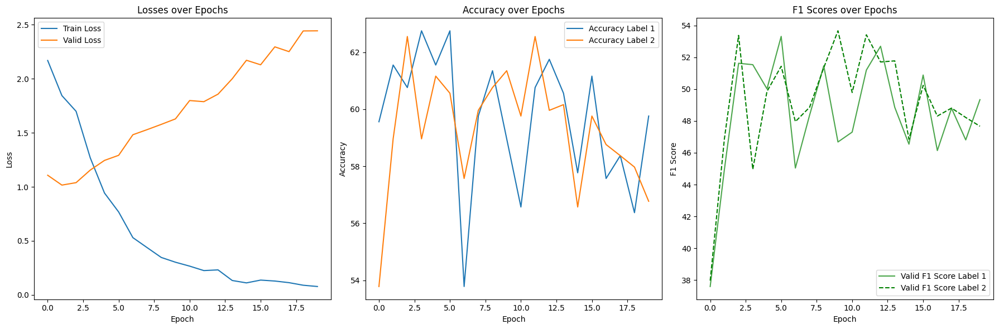

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 6))

# Train and Valid Losses 변화를 그립니다.
plt.subplot(1, 3, 1)
plt.plot(train_losses, label="Train Loss")
plt.plot(valid_losses, label="Valid Loss")
plt.title("Losses over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Accuracy 변화를 그립니다.
plt.subplot(1, 3, 2)
plt.plot(valid_accuracies_1, label="Accuracy Label 1")
plt.plot(valid_accuracies_2, label="Accuracy Label 2")
plt.title("Accuracy over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# F1-Score 변화를 그립니다.
plt.subplot(1, 3, 3)
plt.plot(valid_f1_scores_1, 'g-', alpha=0.7, label="Valid F1 Score Label 1")  # added alpha for transparency
plt.plot(valid_f1_scores_2, 'g--', label="Valid F1 Score Label 2")
plt.title("F1 Scores over Epochs")
plt.xlabel("Epoch")
plt.ylabel("F1 Score")
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, f1_score

# 모델 가중치 불러오기
model.load_state_dict(torch.load(best_model_path))
model.to(devices[0])  # 필요한 경우 GPU로 모델 이동
model.eval()

all_predictions_1 = []
all_predictions_2 = []
all_labels_1 = []
all_labels_2 = []
top2_correct_1 = 0
top2_correct_2 = 0

# test_dataset 평가
with torch.no_grad():
    for inputs, labels in test_dataloader:
        for k, v in inputs.items():
            if isinstance(v, torch.Tensor):
                inputs[k] = v.to(devices[0])
        for k, v in labels.items():
            if isinstance(v, torch.Tensor):
                labels[k] = v.to(devices[0])

        outputs = model(inputs)
        _, top2_predicted_1 = outputs[0].topk(2, 1, True, True)
        _, top2_predicted_2 = outputs[1].topk(2, 1, True, True)

        all_predictions_1.extend(top2_predicted_1[:, 0].cpu().tolist())
        all_predictions_2.extend(top2_predicted_2[:, 0].cpu().tolist())
        all_labels_1.extend(labels["politic"].cpu().tolist())
        all_labels_2.extend(labels["government"].cpu().tolist())

        # Top-2 정확도 계산
        top2_correct_1 += sum([true_label in pred_labels for true_label, pred_labels in zip(labels["politic"].cpu().tolist(), top2_predicted_1.cpu().tolist())])
        top2_correct_2 += sum([true_label in pred_labels for true_label, pred_labels in zip(labels["government"].cpu().tolist(), top2_predicted_2.cpu().tolist())])

        # 실제 값과 예측 값을 출력
        for true_label_1, pred_label_1, true_label_2, pred_label_2 in zip(labels["politic"].cpu().tolist(), top2_predicted_1[:, 0].cpu().tolist(), labels["government"].cpu().tolist(), top2_predicted_2[:, 0].cpu().tolist()):
            print(f"Output 1 - True Label: {true_label_1}, Predicted: {pred_label_1} | Output 2 - True Label: {true_label_2}, Predicted: {pred_label_2}")

# 정확도 및 f1-score 계산
accuracy_1 = accuracy_score(all_labels_1, all_predictions_1)
f1_1 = f1_score(all_labels_1, all_predictions_1, average='macro')
accuracy_2 = accuracy_score(all_labels_2, all_predictions_2)
f1_2 = f1_score(all_labels_2, all_predictions_2, average='macro')
top2_accuracy_1 = top2_correct_1 / len(all_labels_1)
top2_accuracy_2 = top2_correct_2 / len(all_labels_2)

print(f"\nOutput 1 - Accuracy: {accuracy_1:.4f}, F1 Score: {f1_1:.4f}, Top-2 Accuracy: {top2_accuracy_1:.4f}")
print(f"Output 2 - Accuracy: {accuracy_2:.4f}, F1 Score: {f1_2:.4f}, Top-2 Accuracy: {top2_accuracy_2:.4f}")


torch.Size([2, 5])
torch.Size([2, 6])
Output 1 - True Label: 0, Predicted: 0 | Output 2 - True Label: 1, Predicted: 1
Output 1 - True Label: 0, Predicted: 2 | Output 2 - True Label: 0, Predicted: 0
torch.Size([2, 5])
torch.Size([2, 6])
Output 1 - True Label: 0, Predicted: 0 | Output 2 - True Label: 1, Predicted: 1
Output 1 - True Label: 0, Predicted: 2 | Output 2 - True Label: 1, Predicted: 2
torch.Size([2, 5])
torch.Size([2, 6])
Output 1 - True Label: 0, Predicted: 0 | Output 2 - True Label: 1, Predicted: 1
Output 1 - True Label: 0, Predicted: 1 | Output 2 - True Label: 1, Predicted: 2
torch.Size([2, 5])
torch.Size([2, 6])
Output 1 - True Label: 0, Predicted: 0 | Output 2 - True Label: 1, Predicted: 1
Output 1 - True Label: 0, Predicted: 0 | Output 2 - True Label: 2, Predicted: 1
torch.Size([2, 5])
torch.Size([2, 6])
Output 1 - True Label: 0, Predicted: 0 | Output 2 - True Label: 1, Predicted: 1
Output 1 - True Label: 0, Predicted: 0 | Output 2 - True Label: 0, Predicted: 1
torch.Size

In [ ]:
def calculate_accuracy_within_tolerance(true_labels, predicted_labels):
    tolerance=1
    is_close_enough = [abs(true - pred) <= tolerance for true, pred in zip(true_labels, predicted_labels)]
    return sum(is_close_enough) / len(true_labels)

# Calculate accuracy with tolerance=1
abs_accuracy_1 = calculate_accuracy_within_tolerance(all_labels_1, all_predictions_1)
abs_accuracy_2 = calculate_accuracy_within_tolerance(all_labels_2, all_predictions_2)
# Calculate macro F1 score with tolerance=1
def calculate_f1_within_tolerance(true_labels, predicted_labels):
    tolerance=1
    is_close_enough = [abs(true - pred) <= tolerance for true, pred in zip(true_labels, predicted_labels)]
    return f1_score(true_labels, is_close_enough, average='macro')

abs_f1_1 = calculate_f1_within_tolerance(all_labels_1, all_predictions_1)
abs_f1_2 = calculate_f1_within_tolerance(all_labels_2, all_predictions_2)

print(f" abs_accuracy_1: {abs_accuracy_1:.4f}, abs_f1_1: {abs_f1_1:.4f}")
for true, pred in zip(all_labels_1, all_predictions_1):
    print(abs(true - pred), end=" ")
print()
print(f" abs_accuracy_2: {abs_accuracy_2:.4f}, abs_f1_2: {abs_f1_2:.4f}")
for true, pred in zip(all_labels_2, all_predictions_2):
    print(abs(true - pred), end=" ")

 abs_accuracy_1: 0.8486, abs_f1_1: 0.1095
0 2 0 2 0 1 0 0 0 0 2 0 2 1 0 1 0 0 2 1 1 0 0 1 0 1 1 3 0 0 1 1 1 1 1 3 0 0 0 3 0 1 0 1 1 3 1 3 0 0 0 2 1 0 1 0 0 1 2 0 0 2 2 1 1 3 0 1 1 1 0 0 3 3 1 3 1 0 1 1 0 0 1 2 3 1 1 0 1 1 2 0 0 1 1 0 2 1 0 0 0 0 1 1 1 1 1 1 2 0 0 1 2 2 1 0 1 2 1 0 2 0 2 1 0 1 0 0 1 0 2 0 0 0 2 0 0 2 0 0 2 1 1 1 1 2 2 0 0 0 1 1 0 0 1 0 0 2 2 2 1 0 0 2 0 1 1 0 0 0 0 0 0 0 0 1 0 1 1 2 2 1 2 0 0 1 0 0 0 0 0 0 1 2 2 0 1 0 0 1 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 2 0 0 0 0 1 0 1 0 0 0 1 1 1 0 1 0 0 0 2 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 2 0 1 0 1 1 0 1 0 1 0 0 0 0 1 0 2 2 0 1 0 0 1 0 1 1 0 0 1 0 1 0 0 1 1 2 1 0 0 0 2 0 1 1 0 1 0 0 0 0 1 0 1 1 0 0 1 0 1 1 0 0 0 1 1 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 0 2 0 0 0 0 2 0 0 1 1 1 2 1 1 0 2 2 1 0 1 3 1 2 1 2 1 1 0 0 1 3 1 1 2 0 1 0 1 1 1 1 2 1 1 0 2 2 0 0 0 2 2 0 1 1 1 1 3 2 1 0 0 1 2 1 1 2 1 1 0 2 1 2 0 1 1 0 1 2 0 0 2 1 1 1 1 1 0 